### Short-Term Rental Housings Study During COVID: A Case Study of London AirBnB Visiting Pattern 


***
#### Lau Hiu Ying 
***

### 1.1) Introduction

2020 has been an unexpected years for most business in world due to the outbreak of Coronavirus (COVID-19). Lockdowns and fear to travel reduces the human mobility to travel and people tended to work from home than travelling, which are believed to dramatically impacted the short-let business model of AirBnB. Moreover, Airbnb made a decision to allow guests to cancel bookings for trips starting before 31 May 2020 with a full refund due to the coronavirus outbreak.

This report aims to understand the pattern of visitng frequency of London AirBnB under the pandemic situation and to identify contributions of AirBnB features on the business, and hence shed some light on the business development under pandemic situation.

### 1.2) Analytical Questions

- How does the visiting pattern of London AirBnB change before and during the pandemic period of COVID-19 temporally and spatially?
- Is there any association between visiting pattern of London AirBnB with the COVID period?
- What are the key AirBnB features that contribute to the difference in visiting frequency among all London AirBnB listings?

### 1.3) Define Study Period
UK announced its first lock down on  March 23, ordering Brits to stay at home, banned gatherings of more than two people, and closed all non-essential retail. Nevertheless, cases of Covid-19 surge in the UK on 4 March, as officials announce the biggest one-day increase so far as 34 cases bring the total to 87. Boris Johnson also urged everybody in the UK to work from home and avoid pubs and restaurants to give the NHS time to cope with the pandemic on 16 March, which suggest UK business is being affected in an earlier date. Therefore, COVID-period and pre-COVID period for comparison analysis are defined as follows:
- COVID-19 Period: March - Sep 2020
- Pre-COVID-10 Period: March - Sep 2019

### 2) Data Preparation, Data Cleaning, Transformation & Feature Engineering 

Due to the complexity and numbers of datasets, this session first performs data cleansing, transformation and feature engineering seperately within each dataset groups. Second, in session 2.8, datasets are integrated and merged into cleaned dataset for further analysis.

In [2]:
# import packages/ libraries
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from glob import glob
import scipy.stats as stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import statsmodels.api as sm

### 2.1 ) Dataset and Data Sources

5 types of Dataset are used in this study:
- 2 Listing Dataset showing profiles of all London AirBnB listings from AirBnB, updated by 13 Oct 2020 and by 15 Oct 2019 for comparison
- Number of COVID-19 cases in London by London borough, supplied by London Government at https://data.london.gov.uk/dataset/coronavirus--covid-19--cases
- 20 Datasets showing the future booking in calendar of AirBnB website as of the scrapped Date
- Review Dataset showing all reviews per London AirBnB listing since 2010, updated by 13 Oct 2020
- Spatial Data of London Borough in shape file format

Disclaimer & License:
- All AirBnB datasets are sourced from publicly available information from the Airbnb site by Inside AirBnB and is open to analysis under a Creative Commons CC0 1.0 Universal (CC0 1.0) "Public Domain Dedication" license. Details please refer to http://insideairbnb.com/get-the-data.html , supplied by London Government

### 2.2 ) London AirBnB Listings

This sessions handles 2 dataset from London AirBnB, scrapped as of October 2020 and October 2019 respectively. They covers the profiles of all AirBnB listings in London by that time, including host profiles, borough where AirBnB located, room amenity/ facilities such as number of bed/bedrooms, daily price on average, text decription of the host and listing, and the review score given by previous customers.


#### 2.2.1) Data Preparation

In [3]:
# import AirBnB listings as of 13 Oct 2020

listing_covid_all=pd.read_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/202010_listings.csv.gz',parse_dates=['host_since','last_review','first_review'])

# Drop irrelevant columns and ensure column consistency of two datasets
col_covid=['host_neighbourhood','host_acceptance_rate','host_location','name','description','neighborhood_overview','neighbourhood','host_total_listings_count','host_about','host_picture_url','host_thumbnail_url','listing_url','scrape_id','last_scraped','picture_url','host_url','host_name','license','instant_bookable','calculated_host_listings_count','calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms','reviews_per_month','minimum_minimum_nights','maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm','calendar_updated','has_availability','availability_30','availability_60','availability_90','availability_365','calendar_last_scraped','number_of_reviews','number_of_reviews_ltm','number_of_reviews_l30d','neighbourhood_group_cleansed','bathrooms']
listing_covid = listing_covid_all.drop(columns=col_covid)

print('A total of ' + str(listing_covid.shape[0]) + ' listings are found in London as of Oct 2020')
print(listing_covid.info())

A total of 76619 listings are found in London as of Oct 2020
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76619 entries, 0 to 76618
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   id                           76619 non-null  int64         
 1   host_id                      76619 non-null  int64         
 2   host_since                   76598 non-null  datetime64[ns]
 3   host_response_time           38987 non-null  object        
 4   host_response_rate           38987 non-null  object        
 5   host_is_superhost            76598 non-null  object        
 6   host_listings_count          76598 non-null  float64       
 7   host_verifications           76619 non-null  object        
 8   host_has_profile_pic         76598 non-null  object        
 9   host_identity_verified       76598 non-null  object        
 10  neighbourhood_cleansed       76619 non-null  

##### Limitation of Previous Listings
Compared with the most updated listings data, listing data in 2019 sourced more information from AirBnB website. Columns are removed from the pre-period dataset to ensure consistency with the COVID listings.

In [358]:
# import AirBnB listings as of 13 Oct 2019
listing_pre_all = pd.read_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/201910_listings.csv.gz',parse_dates=['host_since','last_review','first_review'],low_memory=False)

# Drop irrelevant/ columns not consistent with 13 Oct 2020 Dataset
col_pre=['host_neighbourhood','cancellation_policy','require_guest_profile_picture','require_guest_phone_verification','jurisdiction_names','is_business_travel_ready','requires_license','extra_people','guests_included','cleaning_fee','security_deposit','square_feet','bed_type','is_location_exact','state','country_code','country','smart_location','zipcode','market','country','city','weekly_price','monthly_price','street','summary','host_acceptance_rate','space','experiences_offered','notes','thumbnail_url','medium_url','xl_picture_url','transit','access','interaction','house_rules','house_rules','host_location','name','description','neighborhood_overview','neighbourhood','host_total_listings_count','host_about','host_picture_url','host_thumbnail_url','listing_url','scrape_id','last_scraped','picture_url','host_url','host_name','license','instant_bookable','calculated_host_listings_count','calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms','reviews_per_month','minimum_minimum_nights','maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm','calendar_updated','has_availability','availability_30','availability_60','availability_90','availability_365','calendar_last_scraped','number_of_reviews','number_of_reviews_ltm','neighbourhood_group_cleansed','bathrooms']
listing_pre = listing_pre_all.drop(columns=col_pre)

print('A total of ' + str(listing_pre.shape[0]) + ' listings are found in London as of Oct 2019')
print(listing_pre.info())

A total of 83887 listings are found in London as of Oct 2019
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83887 entries, 0 to 83886
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   id                           83887 non-null  int64         
 1   host_id                      83887 non-null  int64         
 2   host_since                   83842 non-null  datetime64[ns]
 3   host_response_time           58647 non-null  object        
 4   host_response_rate           58647 non-null  object        
 5   host_is_superhost            83842 non-null  object        
 6   host_listings_count          83842 non-null  float64       
 7   host_verifications           83887 non-null  object        
 8   host_has_profile_pic         83842 non-null  object        
 9   host_identity_verified       83842 non-null  object        
 10  neighbourhood_cleansed       83887 non-null  

In [5]:
print(listing_pre.head(5))

      id  host_id host_since  host_response_time host_response_rate  \
0  11551    43039 2009-10-03      within an hour               100%   
1  13913    54730 2009-11-16      within an hour               100%   
2  15400    60302 2009-12-05  within a few hours               100%   
3  17402    67564 2010-01-04      within an hour                83%   
4  25023   102813 2010-04-03      within an hour               100%   

  host_is_superhost  host_listings_count  \
0                 t                  3.0   
1                 f                  4.0   
2                 f                  1.0   
3                 f                 18.0   
4                 t                  1.0   

                                  host_verifications host_has_profile_pic  \
0  ['email', 'phone', 'reviews', 'jumio', 'offlin...                    t   
1          ['email', 'phone', 'facebook', 'reviews']                    t   
2  ['email', 'phone', 'reviews', 'jumio', 'govern...                    t   


#### Identify 'Active' Listings by the Review History

Some hosts might not keep their calendar updated or have it highly available even though they live in the entire home/apartment. Hence, only listings with rental history (i.e. last review date) within 6 months before the two study periods are considered

A total of **50960 listings** are considered active in **pre-COVID-period**, while a total of **33751 listings** are considered active in **COVID-period**.

In [6]:
# Remove the non-active listings from the study period

# COVID-period
listing_covid = listing_covid[listing_covid['last_review'] > '2019-08-31']
print('A total of ' + str(listing_covid.shape[0]) + ' listings are considered active in COVID-period')

# Pre-COVID-period
listing_pre = listing_pre[listing_pre['last_review'] > '2018-08-31']
print('A total of ' + str(listing_pre.shape[0]) + ' listings are considered active in pre-COVID-period')

A total of 33751 listings are considered active in COVID-period
A total of 50960 listings are considered active in pre-COVID-period


#### Missing Column: Bathroom information in Pre-COVID dataset
Bathroom is considered as one crucial considerations among all amentities, especially in COVID period. As the bathroom information in pre-COVID dataset is missing, it is imputed by matching the records in the COVID dataset, assumed change of bathroom number/ type is rare. `id` acts as the unique ID for identifying the listings.

In [7]:
# Collect all available COVID Listing's bathroom information (available only since Aug 2020)
bathroom_all = [pd.read_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/202008_listings.csv.gz',usecols=['id','bathrooms_text']),
                pd.read_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/202009_listings.csv.gz',usecols=['id','bathrooms_text']),
                pd.read_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/202010_listings.csv.gz',usecols=['id','bathrooms_text'])]
bathroom_all = pd.concat(bathroom_all)
bathroom_all.drop_duplicates(keep='last',subset=['id'],inplace=True)
bathroom_all.reset_index(inplace=True,drop=True)
print(bathroom_all.head(5))

       id    bathrooms_text
0  199658            1 bath
1  266037  1.5 shared baths
2  284423            1 bath
3  314632     1 shared bath
4  355503            1 bath


In [8]:
# Check the unique value in this variable among all bathroom information
print(bathroom_all['bathrooms_text'].unique())

['1 bath' '1.5 shared baths' '1 shared bath' '2 baths' '1 private bath'
 '1.5 baths' nan '2.5 shared baths' '0 shared baths' 'Shared half-bath'
 '3 baths' '2.5 baths' '4 baths' '2 shared baths' '3.5 shared baths'
 'Private half-bath' '3.5 baths' '0 baths' '5.5 baths' 'Half-bath'
 '6 baths' '8 baths' '3 shared baths' '7.5 baths' '5 baths' '6.5 baths'
 '4.5 baths' '4 shared baths' '7 shared baths' '7.5 shared baths'
 '8 shared baths' '8.5 shared baths' '9.5 shared baths' '7 baths'
 '5 shared baths' '6 shared baths' '10 baths' '8.5 baths'
 '4.5 shared baths' '11.5 baths' '17 baths' '11 baths' '10.5 baths'
 '9 baths' '12 baths' '9 shared baths' '35 baths']


##### Bathroom Columns Deviation
There are mainly three categories of bathroom as observed above, 'private bathroom','shared bath', and 'half-bath' (meaning toilet only, also indicated by those end with 0.5 bath). 4 Variables are derived from `bathroom_text` to clearly the situation, named as `private_bath` (including bath), `shared_bath`,`half_bath_TF` (toilet only or not), `shared_TF` (bathroom Shared with others or not).

In [9]:
bathroom_all['private_bath'] = 0
bathroom_all['shared_bath'] = 0
bathroom_all['half_bath_TF'] = 0
bathroom_all['shared_TF'] = 0

# bathroom no
bathroom_all.loc[bathroom_all['bathrooms_text']=='Half-bath','bathrooms_text'] = str(0.5) + ' half-bath'
bathroom_all.loc[bathroom_all['bathrooms_text']=='Shared half-bath','bathrooms_text'] = str(0.5) + ' Shared half-bath'
bathroom_all.loc[bathroom_all['bathrooms_text']=='Private half-bath','bathrooms_text'] = str(0.5) + ' Private half-bath'
bath_no = bathroom_all.bathrooms_text.str.extract('(\d+)') # Extract no. of bathroom (regardless of bathroom type)

# Fill in the bath room to the corresponding room type accordingly
for idx, bathtype in enumerate(bathroom_all['bathrooms_text']):
    if  'private bath' in str(bathtype):
        bathroom_all.loc[idx,'private_bath'] = int(bath_no.iloc[idx,0])
    elif 'shared' in str(bathtype).lower():
        bathroom_all.loc[idx,'shared_bath'] = int(bath_no.iloc[idx,0])
    elif 'bath' in str(bathtype):
        bathroom_all.loc[idx,'private_bath'] = int(bath_no.iloc[idx,0])
        
# Variable to distinguish whether the bathroom is shared or not
bathroom_all.loc[bathroom_all.bathrooms_text.str.lower().str.contains('shared',na=False),'shared_TF'] = 1
# A special type of bathroom: toilet only is listed as 0.5 bathroom in bathroom_text
bathroom_all.loc[bathroom_all['bathrooms_text'].str.lower().str.contains('.5',na=False),'half_bath_TF'] = 1        
bathroom_all.head(10)

,id,bathrooms_text,private_bath,shared_bath,half_bath_TF,shared_TF
0,199658,1 bath,1,0,0,0
1,266037,1.5 shared baths,0,1,1,1
2,284423,1 bath,1,0,0,0
3,314632,1 shared bath,0,1,0,1
4,355503,1 bath,1,0,0,0
5,381741,2 baths,2,0,0,0
6,389786,1 private bath,1,0,0,0
7,405455,1 bath,1,0,0,0
8,427584,1 bath,1,0,0,0
9,442999,1.5 baths,1,0,1,0


Quite a proportion of bathroom information remain missing from the Pre-Covid dataset. Due to the high proportion and bathroom information cannot be derived from any of other variables, they are classified as **'Not Given'** in a derived variable `NG_bath_TF`

In [12]:
# Merge with Pre covid data by id
listing_pre_2 = listing_pre.merge(bathroom_all,on='id', how='left')
listing_pre_2.drop(columns='bathrooms_text',inplace=True) # Drop the bathroom_text

In [13]:
listing_pre_2.shape

(50960, 35)

In [14]:
print('A total of ' + str(listing_pre_2['shared_TF'].isna().sum()) + ' listings are still missing their bathroom information/ bathroom info not given')

A total of 16782 listings are still missing their bathroom information/ bathroom info not given


In [15]:
# Remaining missing value: assume as 'Not Given'
listing_pre_2['NG_bath_TF'] = 0
listing_pre_2.loc[listing_pre_2['shared_TF'].isna(),'NG_bath_TF'] = 1

# Fill in the missing values in other bathroom variables as 0
listing_pre_2['shared_TF'].fillna(value=0,inplace=True)
listing_pre_2['private_bath'].fillna(value=0,inplace=True)
listing_pre_2['shared_bath'].fillna(value=0,inplace=True)
listing_pre_2['half_bath_TF'].fillna(value=0,inplace=True)

In [16]:
# Update the new bathroom variables in Covid dataset
listing_covid_2 = listing_covid.merge(bathroom_all,on='id', how='left')
listing_covid_2.drop(columns=['bathrooms_text_x','bathrooms_text_y'],inplace=True) # Drop the bathroom_text
listing_covid_2['NG_bath_TF'] = 0 # All info are given 

In [17]:
# Check merge accuracy
print(listing_covid.shape)
print(listing_covid_2.shape)

(33751, 32)
(33751, 36)


#### 2.2.2) Handling Missing Values

In [18]:
# Check missing values of COVID dataset
print(listing_covid_2.isna().sum()[listing_covid_2.isna().sum()!=0])

host_since                       11
host_response_time             9520
host_response_rate             9520
host_is_superhost                11
host_listings_count              11
host_has_profile_pic             11
host_identity_verified           11
bedrooms                       2209
beds                            244
review_scores_rating            387
review_scores_accuracy          408
review_scores_cleanliness       408
review_scores_checkin           408
review_scores_communication     408
review_scores_location          408
review_scores_value             408
dtype: int64


In [19]:
# Pre-COVID dataset missing values
print(listing_pre_2.isna().sum()[listing_pre_2.isna().sum()!=0])

host_since                       23
host_response_time             6066
host_response_rate             6066
host_is_superhost                23
host_listings_count              23
host_has_profile_pic             23
host_identity_verified           23
bedrooms                         21
beds                             33
review_scores_rating            776
review_scores_accuracy          777
review_scores_cleanliness       776
review_scores_checkin           777
review_scores_communication     777
review_scores_location          777
review_scores_value             777
dtype: int64


##### Fill in host-related data
The host information is commonly missing in 11/23 listings in the two datasets.  `First_review` will then be imputed as `host_since`. `host_listings_count` (total listings host owned) are imput by counting the total listings host owned in this dataset by host id. Other Host Variables such as `host_is_superhost` ,`host_has_profile_pic`, `host_identity_verified` are assumed as 'False' if they cannot be scrapped from the website.

In [20]:
# Gather Host Information from dataset
host_info_covid = listing_covid_2.groupby('host_id').agg({'first_review':'min','host_id':'count'})
host_info_pre = listing_pre_2.groupby('host_id').agg({'first_review':'min','host_id':'count'})
host_info_covid.columns = ['min_first_review','listing_count']
host_info_pre.columns = ['min_first_review','listing_count']

host_id_missing = listing_covid_2[listing_covid_2['host_since'].isna()].host_id.unique()
host_id_missing_pre = listing_pre_2[listing_pre_2['host_since'].isna()].host_id.unique()
host_id_missing_info = host_info_covid.loc[host_id_missing,:]
host_id_missing_info_pre = host_info_pre.loc[host_id_missing_pre,:]

# Merge the df containing host's to-be-filled information into covid dataset
listing_covid_3 = listing_covid_2.merge(host_id_missing_info,on='host_id',how='left')
listing_pre_3 = listing_pre_2.merge(host_id_missing_info_pre,on='host_id',how='left')

# Fill in the values
listing_covid_3.host_since.fillna(listing_covid_3.min_first_review,inplace=True)
listing_covid_3.host_listings_count.fillna(listing_covid_3.listing_count,inplace=True)
listing_covid_3.drop(columns=['min_first_review','listing_count'],inplace=True) # Drop the merged columns

listing_pre_3.host_since.fillna(listing_pre_3.min_first_review,inplace=True)
listing_pre_3.host_listings_count.fillna(listing_pre_3.listing_count,inplace=True)
listing_pre_3.drop(columns=['min_first_review','listing_count'],inplace=True) # Drop the merged columns

# Set other host variables as False
listing_covid_3[['host_is_superhost','host_has_profile_pic','host_identity_verified']] = 'f'
listing_pre_3[['host_is_superhost','host_has_profile_pic','host_identity_verified']] = 'f'

print(listing_covid_3.isna().sum()[listing_covid_3.isna().sum()!=0])
print(listing_pre_3.isna().sum()[listing_pre_3.isna().sum()!=0])

host_response_time             9520
host_response_rate             9520
bedrooms                       2209
beds                            244
review_scores_rating            387
review_scores_accuracy          408
review_scores_cleanliness       408
review_scores_checkin           408
review_scores_communication     408
review_scores_location          408
review_scores_value             408
dtype: int64
host_response_time             6066
host_response_rate             6066
bedrooms                         21
beds                             33
review_scores_rating            776
review_scores_accuracy          777
review_scores_cleanliness       776
review_scores_checkin           777
review_scores_communication     777
review_scores_location          777
review_scores_value             777
dtype: int64


In [21]:
# Check merge
print(listing_covid_2.shape)
print(listing_covid_3.shape)
print(listing_pre_2.shape)
print(listing_pre_3.shape)

(33751, 36)
(33751, 36)
(50960, 36)
(50960, 36)


##### Fill in Number of Bedrooms and Bed by Accomondates

Both `beds` and `bedrooms` are heavily right-skewed. In addition, `beds` variable is considered as a messy variable, where abnormal data are very common, for instance, the presense of 0 bed (account for 4%), 1 bed can accommodate > 3 people, etc. Details are seen as follow. This variable, however, is counted as inaccurate information input by host and hence should not be removed as outliner. Similar practice also applies in `bedrooms`. `accommodates`, as a highly correlated variable to both variables, is considered in the imputation.

              accommodates      beds  bedrooms
accommodates      1.000000  0.816848  0.774605
beds              0.816848  1.000000  0.727006
bedrooms          0.774605  0.727006  1.000000


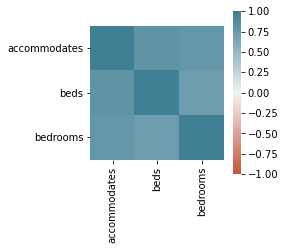

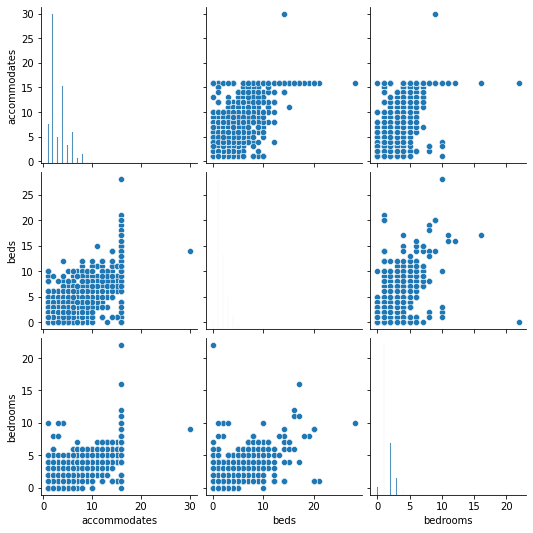

In [22]:
# Concat the relevant data from two datasets to understand the complexity of bedroom/ bed/ accommodates subset
accom_bed = pd.concat([listing_covid_3[['id','accommodates','beds','bedrooms']],listing_pre_3[['id','accommodates','beds','bedrooms']]])
# Remove duplicate count by listing id
accom_bed.drop_duplicates(keep='first',subset=['id'],inplace=True)
accom_bed.drop(axis=1,columns=['id'],inplace=True)

# Bedrooms and beds are highly correlated to accommodates
corr = accom_bed.corr()
print(corr)
plt.figure(figsize = (3,3))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True)
plt.show()

sns.pairplot(accom_bed)
plt.show()

`accommodates` is assumed to provide insight for both `beds` and `bedrooms`. Hence, inaccurate data will be spot out and impute the median of the corresponding `accommodates`.

In [23]:
# Set up mapping df for mapping median of accommodates in beds and bedrooms
# both datasets use this for mapping as this is universal
accom_median = accom_bed.groupby('accommodates')[['beds','bedrooms']].median().reset_index()

listing_covid_3.loc[listing_covid_3['beds']==0,'beds'] = None # replace with missing values where bed = 0 (impossible)
listing_covid_3.loc[listing_covid_3['bedrooms']==0,'bedrooms'] = None # replace with missing values where bed = 0 (impossible)
listing_pre_3.loc[listing_pre_3['beds']==0,'beds'] = None
listing_pre_3.loc[listing_pre_3['bedrooms']==0,'bedrooms'] = None 

# Assume no more than 4 people can sleep on one bed, identify irregular number of beds
listing_covid_3.loc[np.divide(listing_covid_3.accommodates,listing_covid_3.beds) >4,'beds' ] = None
listing_pre_3.loc[np.divide(listing_pre_3.accommodates,listing_pre_3.beds) >4,'beds' ] = None

# Assume some beds are unused, but the ratio of visitor: bed should not be lower than 0.5
listing_covid_3.loc[np.divide(listing_covid_3.accommodates,listing_covid_3.beds) <0.5,'beds'] = None
listing_pre_3.loc[np.divide(listing_pre_3.accommodates,listing_pre_3.beds) <0.5,'beds'] = None

# Assume there should be no more than 6 people in one room, identify irregular number of bedrooms
listing_covid_3.loc[np.divide(listing_covid_3.accommodates,listing_covid_3.bedrooms) >6,'bedrooms'] = None
listing_pre_3.loc[np.divide(listing_pre_3.accommodates,listing_pre_3.bedrooms) >6,'bedrooms'] = None

In [24]:
# Impute the median or the corresponding accommodates
listing_covid_4 = listing_covid_3.merge(accom_median,on='accommodates',how='left')
listing_covid_4.beds_x.fillna(listing_covid_4.beds_y,inplace=True)
listing_covid_4.bedrooms_x.fillna(listing_covid_4.bedrooms_y,inplace=True)
listing_covid_4.drop(columns=['beds_y','bedrooms_y'],inplace=True)

listing_pre_4 = listing_pre_3.merge(accom_median,on='accommodates',how='left')
listing_pre_4.beds_x.fillna(listing_pre_4.beds_y,inplace=True)
listing_pre_4.bedrooms_x.fillna(listing_pre_4.bedrooms_y,inplace=True)
listing_pre_4.drop(columns=['beds_y','bedrooms_y'],inplace=True)

# Rename the columns
dict_rename = {'beds_x':'beds','bedrooms_x':'bedrooms'}
listing_covid_4.rename(columns=dict_rename,inplace=True)
listing_pre_4.rename(columns=dict_rename,inplace=True)

In [25]:
# Check missing values
print(listing_covid_4.isna().sum()[listing_covid_4.isna().sum()!=0])
print(listing_pre_4.isna().sum()[listing_pre_4.isna().sum()!=0])

host_response_time             9520
host_response_rate             9520
review_scores_rating            387
review_scores_accuracy          408
review_scores_cleanliness       408
review_scores_checkin           408
review_scores_communication     408
review_scores_location          408
review_scores_value             408
dtype: int64
host_response_time             6066
host_response_rate             6066
review_scores_rating            776
review_scores_accuracy          777
review_scores_cleanliness       776
review_scores_checkin           777
review_scores_communication     777
review_scores_location          777
review_scores_value             777
dtype: int64


In [26]:
# Check Merge
print(listing_covid_3.shape)
print(listing_covid_4.shape)
print(listing_pre_3.shape)
print(listing_pre_4.shape)

(33751, 36)
(33751, 36)
(50960, 36)
(50960, 36)


##### Missing Review Scores of Listing
An interesting phenonmenon is despite the presense of `last_review` date in recent months, missing reviews are found among two datasets. This is due to the scrapping error, whereas reviews are automated posting by AirBnB since the host cancelled the reservations 3 days before arrival *('The host canceled this reservation before arrival. This is an automated posting.')*. In fact, no visit is made to those listings. Therefore, `all review_scores` with missing values are **removed from two datasets**.

In [27]:
# Subset the non-null values
listing_covid_5 = listing_covid_4[~listing_covid_4['review_scores_accuracy'].isna()]
listing_pre_5 = listing_pre_4[(~listing_pre_4['review_scores_accuracy'].isna()) & (~listing_pre_4['review_scores_communication'].isna()) & (~listing_pre_4['review_scores_rating'].isna())]

print(listing_covid_5.isna().sum()[listing_covid_5.isna().sum()!=0])
print(listing_pre_5.isna().sum()[listing_pre_5.isna().sum()!=0])

host_response_time    9289
host_response_rate    9289
dtype: int64
host_response_time    5827
host_response_rate    5827
dtype: int64


In [28]:
# Check Merge: removing wrong review ratings
print(listing_covid_4.shape)
print(listing_covid_5.shape)
print(listing_pre_4.shape)
print(listing_pre_5.shape)

(33751, 36)
(33343, 36)
(50960, 36)
(50181, 36)


##### Missing Values in Host Response
Due to scrapping error, some host, although information is present in website, miss `host_response_rate`, `host_response_time` in dataset. As there is no other correlated variables, they are imput by mode (categorical data) and median for robust analysis. For numeric variables, since the proportion of missing values is not small, and the distribution of the variable is quite extreme, median, instead of mode, is used.

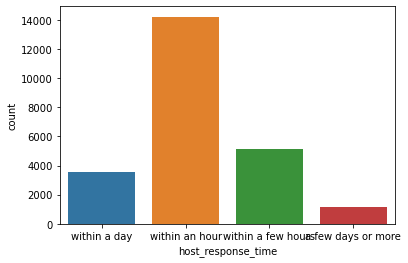

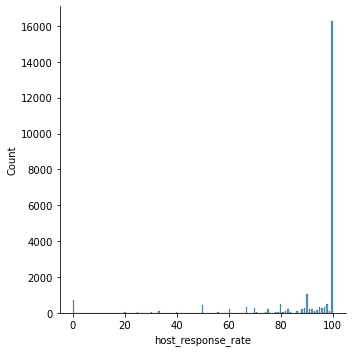

In [29]:
listing_covid_5[['host_response_time','host_response_rate']].isna()

# Convert response rate to numeric variable
ResponseRate = listing_covid_5['host_response_rate'].str.replace('%','').astype('float64')
ResponseRate_pre = listing_pre_5['host_response_rate'].str.replace('%','').astype('float64')
sns.countplot(x='host_response_time',data=listing_covid_5)
sns.displot(listing_covid_5.host_response_rate.str.replace('%','').astype('float64'))

In [30]:
# Fill in Median and mode
listing_covid_5.host_response_rate = listing_covid_5.host_response_rate.fillna(value=str(ResponseRate.median())+'%')
listing_covid_5.host_response_time = listing_covid_5.host_response_time.fillna(value=listing_covid_5.host_response_time.mode()[0])
listing_pre_5.host_response_rate = listing_pre_5.host_response_rate.fillna(value=str(ResponseRate_pre.median())+'%')
listing_pre_5.host_response_time = listing_pre_5.host_response_time.fillna(value=listing_pre_5.host_response_time.mode()[0])

print(listing_covid_5.isna().sum()[listing_covid_5.isna().sum()!=0])
print(listing_pre_5.isna().sum()[listing_pre_5.isna().sum()!=0])

Series([], dtype: int64)
Series([], dtype: int64)


C:\Users\Hillie\anaconda3\lib\site-packages\pandas\core\generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


#### 2.2.3) Data Derivation

In [32]:
# remove % in columns
listing_covid_5.host_response_rate = listing_covid_5.host_response_rate.str.replace('%','')
listing_covid_5.price = listing_covid_5.price.str.replace('$','').str.replace(',','')
listing_pre_5.host_response_rate = listing_pre_5.host_response_rate.str.replace('%','')
listing_pre_5.price = listing_pre_5.price.str.replace('$','').str.replace(',','')

In [33]:
# assign numeric data type to variables
listing_covid_5 = listing_covid_5.astype({'shared_bath':'int64','id':'object','private_bath':'int64','host_id':'object','host_response_rate':'float64','bedrooms':'int64','beds':'int64','price':'float64'})
listing_pre_5 = listing_pre_5.astype({'shared_bath':'int64','id':'object','private_bath':'int64','host_id':'object','host_response_rate':'float64','bedrooms':'int64','beds':'int64','price':'float64'})

#### Host Verification
`host_verifications` indicates how and whether hosts' identity could be verified. In fact, in web interface, visitors would only know whether the host is verified (by a 'tick'), which how they are verified will not affect visitors' choices. This variable is derived as [0,1] to show whether the host is verified. 

In [34]:
# Create new variable host_verifications_TF for logical input
listing_covid_5['host_verifications_TF'] = 1
listing_covid_5.loc[listing_covid_5['host_verifications'] == '[]','host_verifications_TF'] =0

listing_pre_5['host_verifications_TF'] = 1
listing_pre_5.loc[listing_pre_5['host_verifications'] == '[]','host_verifications_TF'] =0

# drop original column
listing_covid_5.drop(columns='host_verifications',inplace=True)
listing_pre_5.drop(columns='host_verifications',inplace=True)

#### Host Experience as of the end of study period
Identify host experience from `host_since`. Although `first_review` may better reflect their experience, the `host since` variable is presented in their profile for visitors' view.

In [35]:
# Obtain host experience (year)
import datetime as dt
host_ex_covid = (np.datetime64(dt.date(2020,9,30))- listing_covid_5['host_since'])

listing_covid_5['host_experience'] = 0

for i,k in host_ex_covid.items():
    listing_covid_5.loc[i,'host_experience'] = round(k.days/365,1)
    
host_ex_pre = (np.datetime64(dt.date(2019,9,30))- listing_pre_5['host_since'])

listing_pre_5['host_experience'] = 0

for i,k in host_ex_pre.items():
    listing_pre_5.loc[i,'host_experience'] = round(k.days/365,1)

#### Property and Room Categories
As room type has been indicated in `room_type`, the information in `property_type` is removed and recategorized.

In [36]:
# Identify inconsistency within same variables of different dataset
print(listing_covid_5.loc[:,'room_type'].unique())
print(listing_pre_5.loc[:,'room_type'].unique())

['Entire home/apt' 'Private room' 'Shared room' 'Hotel room']
['Entire home/apt' 'Private room' 'Hotel room' 'Shared room']


In [37]:
# Identify inconsistency within same variables of different dataset
print(listing_covid_5.loc[:,'property_type'].unique()[0:10])

['Entire apartment' 'Private room in apartment' 'Private room in house'
 'Entire townhouse' 'Private room in townhouse'
 'Entire serviced apartment' 'Room in aparthotel'
 'Private room in bed and breakfast' 'Entire house' 'Private room in loft']


In [38]:
print(listing_pre_5.loc[:,'property_type'].unique())

['Apartment' 'House' 'Townhouse' 'Condominium' 'Serviced apartment'
 'Bed and breakfast' 'Aparthotel' 'Loft' 'Other' 'Guest suite' 'Boat'
 'Guesthouse' 'Villa' 'Cabin' 'Bungalow' 'Yurt' 'Cottage' 'Tiny house'
 'Nature lodge' 'Hut' 'Hostel' 'Boutique hotel' 'Houseboat' 'Hotel'
 'Chalet' 'Earth house' 'Barn' 'Ryokan (Japan)' 'Camper/RV'
 'Casa particular (Cuba)' 'Farm stay' 'Tent' 'Treehouse' 'Lighthouse'
 'Bus']


In [41]:
#Re-categorized the property type
dict_property = {
'apartment': 'apartment',
'condominium': 'apartment',
'entire place': 'apartment',
'home/apt': 'apartment',
'townhouse': 'townhouse',
'hotel': 'hostel_hotel',
'Ryokan': 'hostel_hotel',
'Aparthotel':'hostel_hotel',
'hostel':'hostel_hotel',
'minsu':'hostel_hotel',
'guesthouse': 'hostel_hotel',
'bed and breakfast':'hostel_hotel',
'guest suite': 'hostel_hotel',
'cabin': 'cottage_bungalow',
'villa': 'cottage_bungalow',
'bungalow': 'cottage_bungalow',
'loft': 'cottage_bungalow',
'cottage': 'cottage_bungalow',
'chalet' : 'cottage_bungalow',
'Nature lodge': 'cottage_bungalow',
'camper/RV': 'cottage_bungalow',
'earth house': 'cottage_bungalow',
'farm stay': 'cottage_bungalow',
'hut': 'cottage_bungalow',
'lighthouse':'cottage_bungalow',
'barn': 'cottage_bungalow',
'casa': 'cottage_bungalow',
'tiny house': 'cottage_bungalow',
'castle': 'cottage_bungalow',
'yurt': 'cottage_bungalow',
'bus': 'others',
'houseboat': 'others',
'boat': 'others',
'tent':'others',
'house': 'townhouse'    
}

In [42]:
# Create dummy variable for the new property categories
listing_covid_5['townhouse']=0
listing_covid_5['apartment']=0
listing_covid_5['cottage_bungalow']=0
listing_covid_5['hostel_hotel']=0

for key, item in dict_property.items():
    listing_covid_5.loc[listing_covid_5.property_type.str.lower().str.contains(key),item] = 1 # dummy variables
    listing_covid_5.loc[listing_covid_5.property_type.str.lower().str.contains(key),'property_type'] = item # update the original value
    listing_pre_5.loc[listing_pre_5.property_type.str.lower().str.contains(key),item] = 1    # dummy variables
    listing_pre_5.loc[listing_pre_5.property_type.str.lower().str.contains(key),'property_type'] = item # update the original value

In [43]:
# Check missing categories (other than the given 'others')
print(listing_covid_5.loc[~listing_covid_5.others.isna(),'property_type'].unique() )
print(listing_pre_5.loc[~listing_pre_5.others.isna(),'property_type'].unique() )

['others']
['others']


In [44]:
# Check Merge
print(listing_covid_4.shape)
print(listing_covid_5.shape)
print(listing_pre_4.shape)
print(listing_pre_5.shape)

(33751, 36)
(33343, 42)
(50960, 36)
(50181, 42)


In [58]:
# Hot-encoding for room_type
dummy_room = pd.get_dummies(listing_covid_5.room_type)
dummy_room_p = pd.get_dummies(listing_pre_5.room_type)
dummy_room.columns = ['entire_house','hotel_rm','private_rm','share_rm']
dummy_room_p.columns = ['entire_house','hotel_rm','private_rm','share_rm']

listing_covid_6 = pd.concat([listing_covid_5, dummy_room],axis=1)
listing_pre_6 = pd.concat([listing_pre_5, dummy_room_p],axis=1)

In [59]:
# Drop the others column & property_type
listing_covid_6.drop(columns=['others'],inplace=True)
listing_pre_6.drop(columns=['others'],inplace=True)
print(listing_covid_6.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33343 entries, 0 to 33750
Data columns (total 45 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   id                           33343 non-null  object        
 1   host_id                      33343 non-null  object        
 2   host_since                   33343 non-null  datetime64[ns]
 3   host_response_time           33343 non-null  object        
 4   host_response_rate           33343 non-null  float64       
 5   host_is_superhost            33343 non-null  object        
 6   host_listings_count          33343 non-null  float64       
 7   host_has_profile_pic         33343 non-null  object        
 8   host_identity_verified       33343 non-null  object        
 9   neighbourhood_cleansed       33343 non-null  object        
 10  latitude                     33343 non-null  float64       
 11  longitude                    33343 non-nu

#### Amenities

In [60]:
# Chains of string is found in each cell of amenities
listing_covid_6.loc[:,'amenities'] = listing_covid_6.loc[:,'amenities'].str.replace('[',' ').str.replace(']',' ').str.replace('"','')
listing_pre_6.loc[:,'amenities'] = listing_pre_6.loc[:,'amenities'].str.replace('[',' ').str.replace(']',' ').str.replace('"','')

In [61]:
listing_covid_6.loc[listing_covid_6['amenities'].str.len() <3,'amenities'] = 'Empty'
listing_pre_6.loc[listing_pre_6['amenities'].str.len() <3,'amenities']= 'Empty'

In [62]:
# Find Text
listing_covid_6.amenities.head()

0     Laptop-friendly workspace, Carbon monoxide al...
1     Laptop-friendly workspace, Carbon monoxide al...
2     Laptop-friendly workspace, TV, Hot water, Ess...
3     Bed linens, Hair dryer, Long term stays allow...
4     Laptop-friendly workspace, Smoke alarm, Heati...
Name: amenities, dtype: object

In [63]:
# Extract text from amentities text
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
stop_words   = (stopwords.words('english'))

amenities=[]

for string_a in listing_covid_6.amenities:
    b= [string_a]
    vectorizer = CountVectorizer()
    vectorizer.fit_transform(b)
    list_a = vectorizer.get_feature_names()
    for item in list_a:
        if item not in stop_words:
            amenities.append(item)
        
amenities_count={}
from nltk import FreqDist
fdist = FreqDist(amenities)
# Identify popular amenities only
for item, freq in fdist.items():
    if freq >= round(listing_covid_6.shape[0]/4,0): # more than 25% is counted as common
        amenities_count[item] = freq

In [64]:
# List of amenity terms
amenity_term = list(amenities_count.keys())
# indicates from count that some amenities terms are chained based on same number of frequency
dict_amenity={ 
'extra': 'extra_pillow_blanket',
'pillows': 'extra_pillow_blanket',
'blankets': 'extra_pillow_blanket',
'private' : 'private_entrance',
'entrance':'private_entrance',
'free':'free_parking',
'parking':'free_parking',
'premises':'free_parking',
'allowed':'long_term_stays',
'dryer':'hair_dryer',
'hair':'hair_dryer',
'fire':'fire_extinguisher',
'extinguisher':'fire_extinguisher',
'long':'long_term_stays',
'term':'long_term_stays',
'stays':'long_term_stays',
'dishes':'dishes_silverware',
'silverware':'dishes_silverware',
'hot':'hot_water',
'water':'hot_water',
'laptop':'laptop_friendly', 
'friendly':'laptop_friendly', 
'workspace':'laptop_friendly',
'carbon':'smoke_detector',
'monoxide':'smoke_detector',
'smoke':'smoke_detector',
'cooking':'cooking_basics',
'basics':'cooking_basics',
'bed':'bed_linens',
'linens':'bed_linens',
'first':'first_aid',
'aid':'first_aid',
'kit':'first_aid',
'coffee':'coffee_maker',
'maker':'coffee_maker' }

# Create hot encoding for each common amenity
amenity_list_single = amenity_term.copy()
# For amenity which present as dict key (re-categorized)
for key,item in dict_amenity.items():
    amenity_list_single.remove(key)
    listing_covid_6.loc[listing_covid_6.amenities.str.lower().str.contains(key),item] = 1
    listing_pre_6.loc[listing_pre_6.amenities.str.lower().str.contains(key),item] = 1
    listing_covid_6[item].fillna(0,inplace=True)
    listing_pre_6[item].fillna(0,inplace=True)

# for amenity not in dict (no re-categorized)    
for item in amenity_list_single:
    listing_covid_6.loc[listing_covid_6.amenities.str.lower().str.contains(item),item] = 1
    listing_pre_6.loc[listing_pre_6.amenities.str.lower().str.contains(item),item] = 1
    listing_covid_6[item].fillna(0,inplace=True)
    listing_pre_6[item].fillna(0,inplace=True)

In [65]:
# Drop the messy column
listing_covid_6.drop(columns='amenities',inplace=True)
listing_pre_6.drop(columns='amenities',inplace=True)
print(listing_covid_6.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33343 entries, 0 to 33750
Data columns (total 73 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   id                           33343 non-null  object        
 1   host_id                      33343 non-null  object        
 2   host_since                   33343 non-null  datetime64[ns]
 3   host_response_time           33343 non-null  object        
 4   host_response_rate           33343 non-null  float64       
 5   host_is_superhost            33343 non-null  object        
 6   host_listings_count          33343 non-null  float64       
 7   host_has_profile_pic         33343 non-null  object        
 8   host_identity_verified       33343 non-null  object        
 9   neighbourhood_cleansed       33343 non-null  object        
 10  latitude                     33343 non-null  float64       
 11  longitude                    33343 non-nu

In [66]:
# Check Merge
print(listing_covid_5.shape)
print(listing_covid_6.shape)
print(listing_pre_5.shape)
print(listing_pre_6.shape)

(33343, 42)
(33343, 73)
(50181, 42)
(50181, 73)


#### 2.2.4) Data Transformation
#### Normalize Ordinal Data

In [67]:
# List Variables which needs to be reviewed
ordinal_col = ['review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value']

# Different scale of review scores
ordinal_max = listing_covid_6.loc[:,ordinal_col].max()
ordinal_max_pre = listing_pre_6.loc[:,ordinal_col].max()
ordinal_min = 0 # Since review_scores are ratings given by customers, the min. score is 0
print(ordinal_max)
print(ordinal_max_pre)

review_scores_rating           100.0
review_scores_accuracy          10.0
review_scores_cleanliness       10.0
review_scores_checkin           10.0
review_scores_communication     10.0
review_scores_location          10.0
review_scores_value             10.0
dtype: float64
review_scores_rating           100.0
review_scores_accuracy          10.0
review_scores_cleanliness       10.0
review_scores_checkin           10.0
review_scores_communication     10.0
review_scores_location          10.0
review_scores_value             10.0
dtype: float64


In [68]:
# Normalize the ordinal data such that they are in the same scale [0,1]
ordinal_normalize = (listing_covid_6.loc[:,ordinal_col] - ordinal_min)/(ordinal_max - ordinal_min)
ordinal_normalize_pre = (listing_pre_6.loc[:,ordinal_col] - ordinal_min)/(ordinal_max_pre - ordinal_min)
listing_covid_7 = listing_covid_6.drop(columns=ordinal_col)
listing_pre_7 = listing_pre_6.drop(columns=ordinal_col)
listing_covid_7 = pd.concat([listing_covid_7,ordinal_normalize],axis=1)
listing_pre_7 = pd.concat([listing_pre_7,ordinal_normalize_pre],axis=1)
print(listing_covid_7[ordinal_col].head())

   review_scores_rating  review_scores_accuracy  review_scores_cleanliness  \
0                  0.91                     0.9                        0.9   
1                  0.97                     1.0                        1.0   
2                  0.96                     1.0                        1.0   
3                  0.94                     1.0                        0.9   
4                  0.96                     1.0                        1.0   

   review_scores_checkin  review_scores_communication  review_scores_location  \
0                    1.0                          1.0                     0.9   
1                    1.0                          1.0                     0.9   
2                    1.0                          1.0                     1.0   
3                    0.9                          0.9                     1.0   
4                    1.0                          1.0                     0.9   

   review_scores_value  
0                  

#### Numeric Variables
The distribution and kde plot of numeric suggest that most numeric distribution are heavily skewed (left/ right),and some demonstrate extreme values. Only `host_experience` shows quite a normally distributed graph. `Price` and `minimum_nights` seems quite normally distributed without the existence of extreme values.

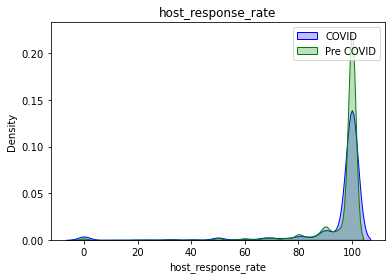

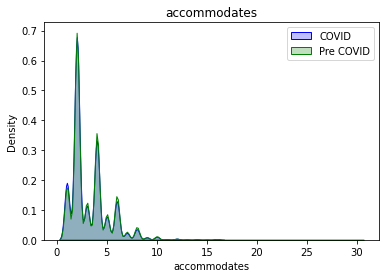

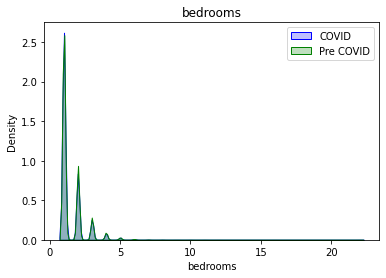

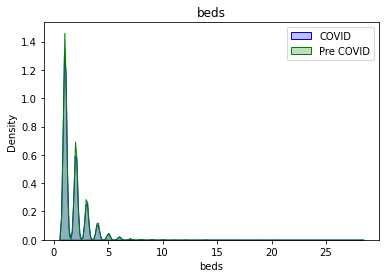

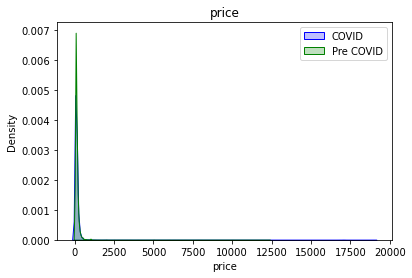

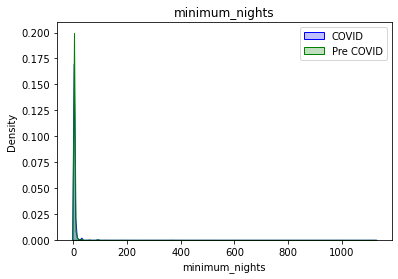

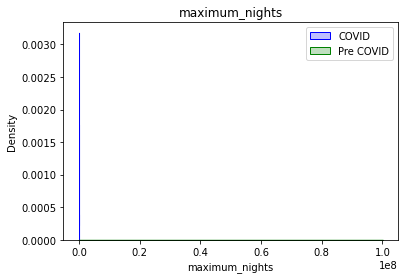

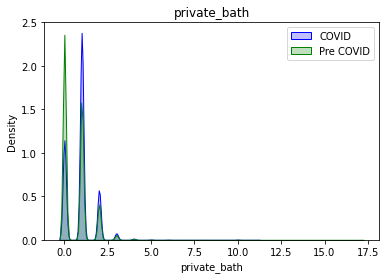

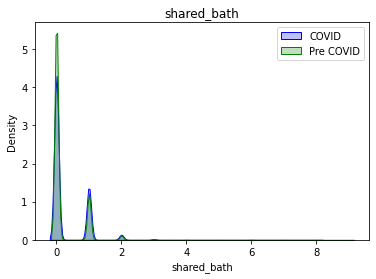

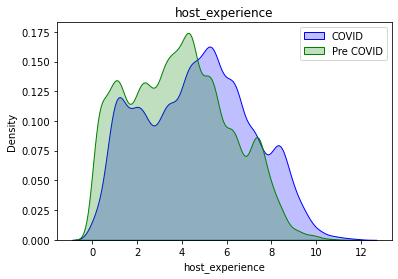

In [69]:
# Understand the distribution of numeric variables
numeric_col = ['host_response_rate','accommodates','bedrooms','beds','price','minimum_nights','maximum_nights','private_bath','shared_bath','host_experience']

for item in numeric_col:
    df = listing_covid_7[item]
    df_pre = listing_pre_7[item]
    plt.figsize = (4,2)
    sns.kdeplot(data=df,color='b',fill=True)
    sns.kdeplot(data=df_pre,color='g',fill=True)
    plt.legend(['COVID','Pre COVID'])
    plt.title(item)
    plt.show()

#### Extreme Values/ Outliners
Extreme values are present in `price`, `beds`, `minimum_nights`, `maximum_nights` and `bedrooms`. `beds` and `bedrooms` have been checked in previous session by their ratio with the number of accommodates, and cross-check with the information posted in AirBnB, and hence, are accepted in this study.

Some outliners are a natural part of the variable, for instance, the number of `beds`, `bedrooms`, `private_bath`,`shared_bath`. They shall not be removed and hence keep for future analysis. 

Some outliners exist due to error, which shall be corrected. Extremely high value are present in the remaining three variables `price`, `minimum_nights`, `maximum_nights` . Median are used to replace these values.

In [70]:
# Evaluate the max values value of numeric variables since they are mostly left-skewed heavily.
print(listing_covid_7[numeric_col].max())
print(listing_pre_7[numeric_col].max())
print(listing_covid_7[numeric_col].min())
print(listing_pre_7[numeric_col].min())
# Conclude: extreme values are present in price, beds,minimum_nights, maximum_nights, bedrooms

host_response_rate      100.0
accommodates             16.0
bedrooms                 22.0
beds                     28.0
price                 18998.0
minimum_nights         1124.0
maximum_nights        16959.0
private_bath             11.0
shared_bath               8.0
host_experience          11.8
dtype: float64
host_response_rate         100.0
accommodates                30.0
bedrooms                    22.0
beds                        28.0
price                    12345.0
minimum_nights            1124.0
maximum_nights        99999999.0
private_bath                17.0
shared_bath                  9.0
host_experience             11.1
dtype: float64
host_response_rate    0.0
accommodates          1.0
bedrooms              1.0
beds                  1.0
price                 0.0
minimum_nights        1.0
maximum_nights        1.0
private_bath          0.0
shared_bath           0.0
host_experience       0.0
dtype: float64
host_response_rate    0.0
accommodates          1.0
bedrooms     

In [71]:
# Remove the extreme values/ outliners before further data transformation

# Some outliners exist due to error, which shall be corrected
# Replace the extreme values with median
error_num = ['price','minimum_nights','maximum_nights']
error_median = listing_covid_7[error_num].median()
error_median_pre = listing_pre_7[error_num].median()

# Detect outliners by IQR
for i in np.arange(0,len(error_num)):
    item = error_num[i]
    q25=np.percentile(listing_covid_7[item],25)
    q75=np.percentile(listing_covid_7[item],75)
    upper = q75+ (q75-q25)*1.5
    lower = q25 - (q75-q25)*1.5 
    listing_covid_7.loc[(listing_covid_7[item]>upper) | (listing_covid_7[item]<lower),item] = error_median[i]
    
    q25_pre=np.percentile(listing_pre_7[item],25)
    q75_pre=np.percentile(listing_pre_7[item],75)
    upper_pre = q75_pre+ (q75_pre-q25_pre)*1.5
    lower_pre = q25_pre - (q75_pre-q25_pre)*1.5 
    listing_pre_7.loc[(listing_pre_7[item]>upper_pre) | (listing_pre_7[item]<lower_pre),item] = error_median_pre[i]    

# Note: minimum Price = 0
# Price is pre-filled as 0 if no data is found (which is impossible)
# set Price = 0 as missing value such that the distribution is not affected
listing_covid_7[listing_covid_7['price']==0] = None
listing_pre_7[listing_pre_7['price']==0] = None

In [72]:
# Confirm no extreme value
print(listing_covid_7[numeric_col].max())
print(listing_covid_7[numeric_col].min())

host_response_rate     100.0
accommodates            16.0
bedrooms                22.0
beds                    28.0
price                  234.0
minimum_nights           6.0
maximum_nights        1825.0
private_bath            11.0
shared_bath              8.0
host_experience         11.8
dtype: float64
host_response_rate    0.0
accommodates          1.0
bedrooms              1.0
beds                  1.0
price                 8.0
minimum_nights        1.0
maximum_nights        1.0
private_bath          0.0
shared_bath           0.0
host_experience       0.0
dtype: float64


In [73]:
# Check Merge
print(listing_covid_6.shape)
print(listing_covid_7.shape)
print(listing_pre_6.shape)
print(listing_pre_7.shape)

(33343, 73)
(33343, 73)
(50181, 73)
(50181, 73)


#### Transformation of Continuous Variables

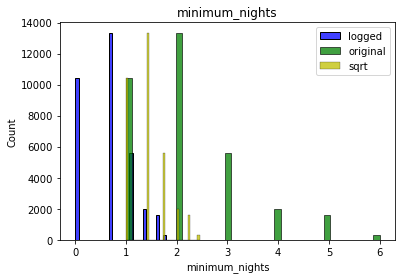

origin skewness: 1.1327487166836536
log skewness: 0.13788302273806557
sqrt skewness: 0.6009382823700868


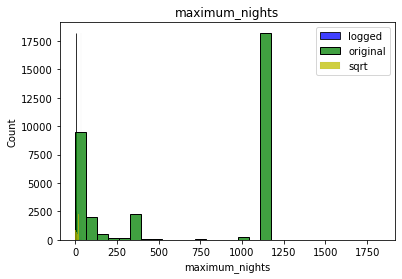

origin skewness: -0.29490491778037253
log skewness: -0.8246217399834278
sqrt skewness: -0.42909588574760255


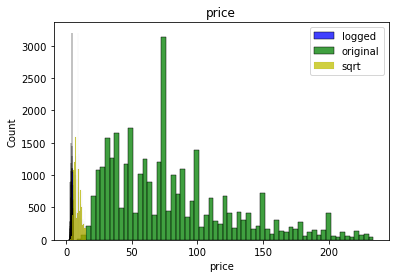

origin skewness: 1.0135894976425366
log skewness: -0.14864885589813495
sqrt skewness: 0.4467553181993199


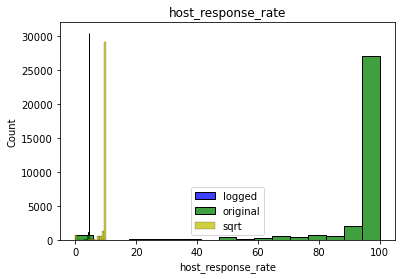

origin skewness: -3.7898294885837167
log skewness: -6.059410671719248
sqrt skewness: -5.030194633403235


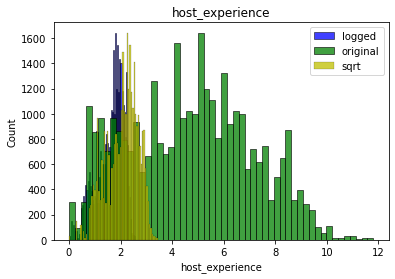

origin skewness: 0.099410927613571
log skewness: -0.7651247749849283
sqrt skewness: -0.4959368887331499


In [74]:
# Only positive variables allows log/ sqrt/ boxcox transformation
numeric_log_col = ['minimum_nights','maximum_nights','price']

for item in numeric_log_col:
    df_origin = listing_covid_7[item]
    df_log = np.log(df_origin)
    df_sqrt = np.sqrt(df_origin)
    plt.figsize = (5,2)
    sns.histplot(data=df_log,color='b')
    sns.histplot(data=df_origin,color='g')
    sns.histplot(data=df_sqrt,color='y')
    plt.legend(['logged','original','sqrt'])
    plt.title(item)
    plt.show()
    print('origin skewness: '+ str(df_origin.skew()))
    print('log skewness: '+ str(df_log.skew()))
    print('sqrt skewness: '+ str(df_sqrt.skew()))
    
numeric_logplus_col = ['host_response_rate','host_experience']   

for item in numeric_logplus_col:
    df_origin = listing_covid_7[item]
    df_log = np.log(df_origin+1)
    df_sqrt = np.sqrt(df_origin)
    plt.figsize = (5,2)
    sns.histplot(data=df_log,color='b')
    sns.histplot(data=df_origin,color='g')
    sns.histplot(data=df_sqrt,color='y')
    plt.legend(['logged','original','sqrt'])
    plt.title(item)
    plt.show()
    print('origin skewness: '+ str(df_origin.skew()))
    print('log skewness: '+ str(df_log.skew()))
    print('sqrt skewness: '+ str(df_sqrt.skew()))

In [75]:
# Judged by the skewness, the transformation taken to each variables as follows:
num_continuous = ['minimum_nights','maximum_nights','price','host_response_rate','host_experience']
# ['sqrt','None','sqrt','None','None']

num_continuous_tranform = ['minimum_nights','price']
# Log transform work best (assess by the skewness). Hence, data are transformed by log transformation
numeric_log = listing_covid_7.loc[:,num_continuous_tranform].apply(np.sqrt).rename(columns={'minimum_nights':'minimum_nights_sqrt','price':'price_sqrt'})
listing_covid_7.drop(columns=num_continuous_tranform,inplace=True)
listing_covid_7 = pd.concat([listing_covid_7,numeric_log],axis =1 )

In [76]:
# Perform same practice on pre-covid dataset
numeric_log_pre = listing_pre_7.loc[:,num_continuous_tranform].apply(np.sqrt).rename(columns={'minimum_nights':'minimum_nights_sqrt','price':'price_sqrt'})
listing_pre_7.drop(columns=num_continuous_tranform,inplace=True)
listing_pre_7 = pd.concat([listing_pre_7,numeric_log_pre],axis =1 )
# Accomodates, min. night of staying tends to appear normal

#### Transformation of Count Variables
Sqrt is suggested for transforming count data in the poisson distribution

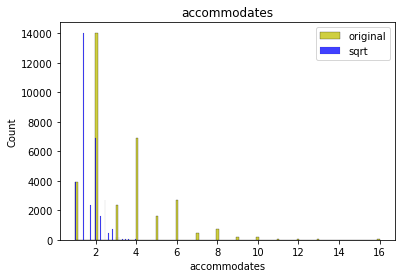

original skewness: 1.731185747903731
sqrt skewness: 0.8338125001337944


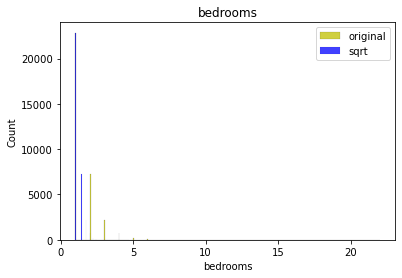

original skewness: 2.7769250091396103
sqrt skewness: 1.7283698475501


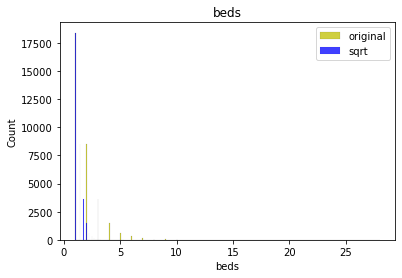

original skewness: 3.1855626390788645
sqrt skewness: 1.5963997042994278


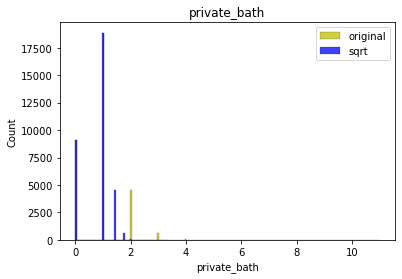

original skewness: 1.7294774969350823
sqrt skewness: -0.5099372449395775


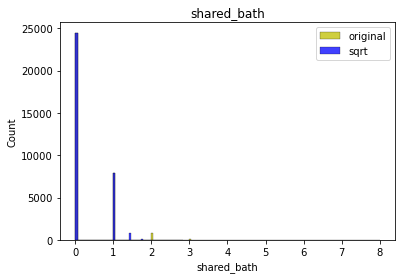

original skewness: 2.2668990667843048
sqrt skewness: 1.1956395968570226


In [77]:
# For count data log transformation by square root (for count data)
count_col = ['accommodates','bedrooms','beds','private_bath','shared_bath']

for item in count_col:
    df_origin = listing_covid_7[item]
    df = np.sqrt(df_origin)
    plt.figsize = (5,2)
    sns.histplot(data=df_origin,color='y')
    sns.histplot(data=df,color='b')
    plt.legend(['original','sqrt'])
    plt.title(item)
    plt.show()
    print('original skewness: '+ str(df_origin.skew()))
    print('sqrt skewness: '+ str(df.skew()))

In [78]:
# Transformation
count_var = np.sqrt(listing_covid_7[count_col]).rename(columns={'accommodates':'accommodates_sqrt','bedrooms':'bedrooms_sqrt','beds':'beds_sqrt','shared_bath':'shared_bath_sqrt','private_bath':'private_bath_sqrt'})
listing_covid_7.drop(columns=count_col,inplace=True)
listing_covid_7 = pd.concat([listing_covid_7,count_var],axis =1 )

count_var_pre = np.sqrt(listing_pre_7[count_col]).rename(columns={'accommodates':'accommodates_sqrt','bedrooms':'bedrooms_sqrt','beds':'beds_sqrt','shared_bath':'shared_bath_sqrt','private_bath':'private_bath_sqrt'})
listing_pre_7.drop(columns=count_col,inplace=True)
listing_pre_7 = pd.concat([listing_pre_7,count_var_pre],axis =1 )


In [79]:
# Check Merge
print(listing_covid_6.shape)
print(listing_covid_7.shape)
print(listing_pre_6.shape)
print(listing_pre_7.shape)

(33343, 73)
(33343, 73)
(50181, 73)
(50181, 73)


### 2.3) Estimate the Cumulative Number of COVID-19 Cases in London

This dataset tells the number of new cases and cumulative number of COVID cases per day in each London Borough. It 
is updated in a daily basis.


#### 2.3.1) Data Preparation

In [80]:
#import dataset
cases=pd.read_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/phe_cases_london_boroughs.csv',parse_dates=['date'])
print(cases.info())
print(cases.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7689 entries, 0 to 7688
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   area_name    7689 non-null   object        
 1   area_code    7689 non-null   object        
 2   date         7689 non-null   datetime64[ns]
 3   new_cases    7689 non-null   float64       
 4   total_cases  7689 non-null   float64       
dtypes: datetime64[ns](1), float64(2), object(2)
memory usage: 300.5+ KB
None
              area_name  area_code       date  new_cases  total_cases
0  Barking and Dagenham  E09000002 2020-02-11        0.0          0.0
1            Wandsworth  E09000032 2020-02-11        0.0          0.0
2                Harrow  E09000015 2020-02-11        0.0          0.0
3                Sutton  E09000029 2020-02-11        0.0          0.0
4             Islington  E09000019 2020-02-11        0.0          0.0


In [81]:
# Rename Columns to align with Listing Dataset
cases.columns = ['Neighborhood','geo_code','date','new_cases','total_cases']

# Extract Study period
cases = cases[cases['date']<'2020-10-01']
cases.head()

,Neighborhood,geo_code,date,new_cases,total_cases
0,Barking and Dagenham,E09000002,2020-02-11,0.0,0.0
1,Wandsworth,E09000032,2020-02-11,0.0,0.0
2,Harrow,E09000015,2020-02-11,0.0,0.0
3,Sutton,E09000029,2020-02-11,0.0,0.0
4,Islington,E09000019,2020-02-11,0.0,0.0


#### 2.3.2) Data Cleaning and Resampling

In [82]:
# Aggregated data by day and neighborhood
case_neighborhood=cases.groupby(['Neighborhood','geo_code']).resample('D',on='date').sum()
case_neighborhood.sort_values(by='date',ascending=True,inplace=True)
case_neighborhood.reset_index(inplace=True)
case_neighborhood.head()

,Neighborhood,geo_code,date,new_cases,total_cases
0,Barking and Dagenham,E09000002,2020-02-11,0.0,0.0
1,Hackney,E09000012,2020-02-11,0.0,0.0
2,Lewisham,E09000023,2020-02-11,1.0,1.0
3,Waltham Forest,E09000031,2020-02-11,0.0,0.0
4,Brent,E09000005,2020-02-11,0.0,0.0


In [83]:
# Aggregated data by day
case_sum=cases[['date','new_cases','total_cases']].resample('D',on='date').sum()
case_sum.reset_index(inplace=True)
case_sum.head()

,date,new_cases,total_cases
0,2020-02-11,1.0,1.0
1,2020-02-12,0.0,1.0
2,2020-02-13,0.0,1.0
3,2020-02-14,0.0,1.0
4,2020-02-15,0.0,1.0


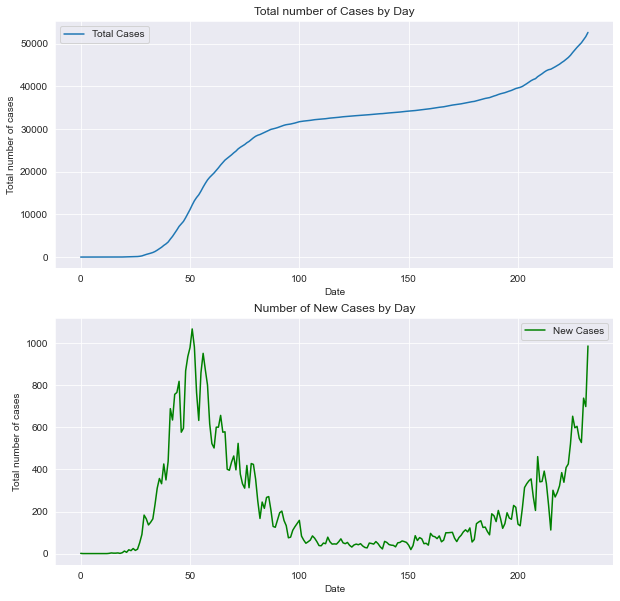

In [361]:
fig,(ax2,ax3) = plt.subplots(nrows=2,figsize=(10,10))
ax2.plot(case_sum['total_cases'],label='Total Cases')
ax3.plot(case_sum['new_cases'],label='New Cases',c='green')
ax2.set(xlabel='Date',ylabel='Total number of cases',title='Total number of Cases by Day')
ax3.set(xlabel='Date',ylabel='Total number of cases',title='Number of New Cases by Day')
ax2.legend()
ax3.legend()
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Temporal Trend of COVID')

#### Resampling 

In [85]:
# For comparison and merging with other dataset, resampling average total cases & total new cases by neighborhood by month/ week
#by neightborhood average by month
case_neighborhood_m = case_neighborhood.groupby(['Neighborhood','geo_code']).resample('M',on='date').agg({'new_cases':'sum','total_cases':'mean'})
case_neighborhood_m.reset_index(inplace=True)
print(case_neighborhood_m.head(5))

           Neighborhood   geo_code       date  new_cases  total_cases
0  Barking and Dagenham  E09000002 2020-02-29        0.0     0.000000
1  Barking and Dagenham  E09000002 2020-03-31      164.0    43.322581
2  Barking and Dagenham  E09000002 2020-04-30      385.0   403.266667
3  Barking and Dagenham  E09000002 2020-05-31      118.0   628.387097
4  Barking and Dagenham  E09000002 2020-06-30       37.0   684.566667


In [86]:
#by neightborhood average by week
case_neighborhood_w = case_neighborhood.groupby(['Neighborhood','geo_code']).resample('W',on='date').agg({'new_cases':'sum','total_cases':'mean'})
case_neighborhood_w.reset_index(inplace=True)
print(case_neighborhood_w.head(5))

           Neighborhood   geo_code       date  new_cases  total_cases
0  Barking and Dagenham  E09000002 2020-02-16        0.0     0.000000
1  Barking and Dagenham  E09000002 2020-02-23        0.0     0.000000
2  Barking and Dagenham  E09000002 2020-03-01        1.0     0.142857
3  Barking and Dagenham  E09000002 2020-03-08        1.0     1.142857
4  Barking and Dagenham  E09000002 2020-03-15       13.0     7.571429


### 2.4) Estimate the Future Availability Per Month Per Listing
A Calendar is available in each AirBnB listing's URL for visitors to check availability of corresponding listing and to reserve bookings. Data are scrapped monthly from this calendar so as to understand the future availability, as an indicator to visiting frequency of listings. 

As the calendar dataset shows all future dates (e.g. including availability after n years), to avoid duplicates and ensure the validity of visiting frequency, only bookings made **within 1 month after the current scrapped date/ before next scrapped date are considered as valid visits** in this study. All calendar datasets scrapped in each month are concatenated and pre-processed to avoid confusion.

#### 2.4.1) Data Preparation and Merging

In [527]:
# Import all Calendar files scrapped each month
calendar_files = glob('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/*_calendar.csv.gz')
calendar_files[0:5]

['C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework\\201902_calendar.csv.gz',
 'C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework\\201903_calendar.csv.gz',
 'C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework\\201904_calendar.csv.gz',
 'C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework\\201905_calendar.csv.gz',
 'C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework\\201906_calendar.csv.gz']

#### Valid Range of Each Calendar Dataset
One of the Limitations of Calendar datasets is it is not scrapped by the end/ at the beginning of each month, but in the middle of month. Dictionaries are created to clearly list the valid range of each calendar dataset.

In [528]:
# Create Scrap Date Dictionary
web_scrap_date = ['13-10-2020','11-09-2020','24-08-2020','14-07-2020','11-06-2020','10-05-2020','14-04-2020','15-03-2020','16-02-2020','09-01-2020','09-12-2019','05-11-2019','15-10-2019','14-09-2019','09-08-2019','10-07-2019','05-06-2019','05-05-2019','09-04-2019','07-03-2019','05-02-2019']
web_scrap_dict={}
i= -1

for f in calendar_files:
    idx_first=f.index('20')
    idx_end=f.index('_calendar')
    period=f[idx_first:idx_end]
    web_scrap_dict[period]=web_scrap_date[i]
    i=i-1
    
web_scrap_dict

{'201902': '05-02-2019',
 '201903': '07-03-2019',
 '201904': '09-04-2019',
 '201905': '05-05-2019',
 '201906': '05-06-2019',
 '201907': '10-07-2019',
 '201908': '09-08-2019',
 '201909': '14-09-2019',
 '201910': '15-10-2019',
 '201911': '05-11-2019',
 '201912': '09-12-2019',
 '202001': '09-01-2020',
 '202002': '16-02-2020',
 '202003': '15-03-2020',
 '202004': '14-04-2020',
 '202005': '10-05-2020',
 '202006': '11-06-2020',
 '202007': '14-07-2020',
 '202008': '24-08-2020',
 '202009': '11-09-2020',
 '202010': '13-10-2020'}

In [529]:
# Create Dictionary showing the next scrapped date of the calendar files
next_web_scrap_dict={}
i= -2

for f in calendar_files[:-1]:
    idx_first=f.index('20')
    idx_end=f.index('_calendar')
    period=f[idx_first:idx_end]
    next_web_scrap_dict[period]=web_scrap_date[i]
    i=i-1
    
next_web_scrap_dict # Not necessary to investigate in the booking after the last scrapped date

{'201902': '07-03-2019',
 '201903': '09-04-2019',
 '201904': '05-05-2019',
 '201905': '05-06-2019',
 '201906': '10-07-2019',
 '201907': '09-08-2019',
 '201908': '14-09-2019',
 '201909': '15-10-2019',
 '201910': '05-11-2019',
 '201911': '09-12-2019',
 '201912': '09-01-2020',
 '202001': '16-02-2020',
 '202002': '15-03-2020',
 '202003': '14-04-2020',
 '202004': '10-05-2020',
 '202005': '11-06-2020',
 '202006': '14-07-2020',
 '202007': '24-08-2020',
 '202008': '11-09-2020',
 '202009': '13-10-2020'}

In [530]:
# Concat all calendar files
calendars = [] # list to store all processed calendar dataset
scrap_date_list=list(web_scrap_dict.keys())

for f in calendar_files[:-1]:
    idx_first=f.index('20')
    idx_end=f.index('_calendar')
    period=f[idx_first:idx_end] # Extract the Date information included in each files' Name
    single_c_file=pd.read_csv(f,sep=',',parse_dates=['date'],usecols=['listing_id','date','available','adjusted_price','price'])
    date_scrap=pd.to_datetime(web_scrap_dict[period],format = '%d-%m-%Y'); # Scrapped date of the current file
    date_next_scrap=pd.to_datetime(next_web_scrap_dict[period],format = '%d-%m-%Y') # Scrapped date of next file
    # Filter valid range from the current files 
    single_c_file = single_c_file[(single_c_file['date']>= date_scrap) & (single_c_file['date'] < date_next_scrap)]
    # Confirm the valid range of current file is correct
    print(single_c_file['date'].max())
    # Append current file to the concat list
    calendars.append(single_c_file)

2019-03-06 00:00:00
2019-04-08 00:00:00
2019-05-04 00:00:00
2019-06-04 00:00:00
2019-07-09 00:00:00
2019-08-08 00:00:00
2019-09-13 00:00:00
2019-10-14 00:00:00
2019-11-04 00:00:00
2019-12-08 00:00:00
2020-01-08 00:00:00
2020-02-15 00:00:00
2020-03-14 00:00:00
2020-04-13 00:00:00
2020-05-09 00:00:00
2020-06-10 00:00:00
2020-07-13 00:00:00
2020-08-23 00:00:00
2020-09-10 00:00:00
2020-10-12 00:00:00


In [531]:
# Concat all calendar data
calendars_df= pd.concat(calendars)
calendars_df.shape

(48664630, 5)

In [532]:
calendars_df.head()

,listing_id,date,available,price,adjusted_price
0,9554,2019-02-05,f,$35.00,$35.00
1,62260,2019-02-05,t,$50.00,$50.00
2,62260,2019-02-06,t,$50.00,$50.00
3,62260,2019-02-07,t,$50.00,$50.00
4,62260,2019-02-08,t,$50.00,$50.00


In [533]:
# Check duplicates
calendars_df[calendars_df.duplicated(subset=['listing_id','date'])]

# conclusion: One listing only have one record per day

,listing_id,date,available,price,adjusted_price


#### 2.4.2) Handling Missing Values

In [534]:
# Check Missing Values
print(calendars_df.isna().sum())
# Only Price col contained missing/ NaN values

# same issues occur in both price and adjusted price, missing values are impute from previous record
calendars_df.adjusted_price = calendars_df['adjusted_price'].fillna(method='ffill')
print(calendars_df.isna().sum())

listing_id            0
date                  0
available             0
price             15190
adjusted_price    15190
dtype: int64
listing_id            0
date                  0
available             0
price             15190
adjusted_price        0
dtype: int64


In [535]:
# drop original price col
calendars_df.drop(columns='price',inplace=True)

# Assign Data type
calendars_df.loc[:,'adjusted_price'] = calendars_df.loc[:,'adjusted_price'].copy().str.replace('$','')
calendars_df.loc[:,'adjusted_price'] = calendars_df.loc[:,'adjusted_price'].copy().str.replace(',','')
calendars_df.loc[:,'listing_id'] = calendars_df.loc[:,'listing_id'].astype('object')
calendars_df.loc[:,'adjusted_price'] = calendars_df.loc[:,'adjusted_price'].astype('float64')

In [536]:
# Extract dataset with reservations
booked_calendar = calendars_df[calendars_df['available']=='f']
booked_calendar.head()

,listing_id,date,available,adjusted_price
0,9554,2019-02-05,f,35.0
82,108096,2019-02-05,f,55.0
83,108096,2019-02-06,f,55.0
84,108096,2019-02-07,f,55.0
85,108096,2019-02-08,f,55.0


In [537]:
# Prevent Jupyter notebook from kernel crash
booked_calendar_grp_m_w = booked_calendar.groupby('listing_id').resample('W',on='date').mean()
booked_calendar_grp_c_w = booked_calendar.groupby('listing_id').resample('W',on='date').count()

booked_calendar_grp_m_m = booked_calendar.groupby('listing_id').resample('M',on='date').mean()
booked_calendar_grp_c_m = booked_calendar.groupby('listing_id').resample('M',on='date').count()

In [538]:
booked_calendar_grp_w = pd.concat([booked_calendar_grp_m_w,booked_calendar_grp_c_w],axis=1)
booked_calendar_grp_m = pd.concat([booked_calendar_grp_m_m,booked_calendar_grp_c_m],axis=1)

In [539]:
#rename column to distinguish
booked_calendar_grp_w.columns = ['Price','Reserved_Count','date', 'available','adjusted_price']
booked_calendar_grp_w.drop(axis=1,columns=['date', 'available','adjusted_price'],inplace=True)

booked_calendar_grp_m.columns = ['Price','Reserved_Count','date', 'available','adjusted_price']
booked_calendar_grp_m.drop(axis=1,columns=['date', 'available','adjusted_price'],inplace=True)

In [540]:
booked_calendar_grp_m.reset_index(inplace=True)
booked_calendar_grp_w.reset_index(inplace=True)

In [541]:
booked_calendar_grp_w.head()

,listing_id,date,Price,Reserved_Count
0,9554,2019-02-10,36.333333,6
1,9554,2019-02-17,36.142857,7
2,9554,2019-02-24,36.142857,7
3,9554,2019-03-03,36.142857,7
4,9554,2019-03-10,35.000000,3


In [542]:
# Save for records
booked_calendar_grp_w.to_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Calendar_all.csv.gz',index=False)
booked_calendar_grp_m.to_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Calendar_all_m.csv.gz',index=False)

In [544]:
# Delete dataframe records to release memory
del booked_calendar_grp_w ,booked_calendar_grp_m_w, booked_calendar_grp_c_w ,booked_calendar_grp_c_m, booked_calendar_grp_m_m

In [87]:
# Import the merged dataset again
calendar = pd.read_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Calendar_all.csv.gz',parse_dates=['date'])
calendar2 = pd.read_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Calendar_all_m.csv.gz',parse_dates=['date'])

In [88]:
# subset only those active listing
active_id = pd.concat([listing_covid_7[['id']], listing_pre_7[['id']]]).drop_duplicates(keep='first',subset='id').reset_index(drop=True)
calendar = calendar.astype({'listing_id':'object'})
calendar2 = calendar2.astype({'listing_id':'object'})
calendar = calendar[calendar['listing_id'].isin(list(active_id.id))]
calendar2 = calendar2[calendar2['listing_id'].isin(list(active_id.id))]

In [89]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3974241 entries, 5 to 7300911
Data columns (total 4 columns):
 #   Column          Dtype         
---  ------          -----         
 0   listing_id      object        
 1   date            datetime64[ns]
 2   Price           float64       
 3   Reserved_Count  int64         
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 151.6+ MB


In [90]:
# Subset the necessary periods
calendar_w = calendar[(calendar['date']> '2019-02-28') & (calendar['date'] < '2020-10-01')]
calendar_m = calendar2[(calendar2['date']> '2019-02-28') & (calendar2['date'] < '2020-10-01')]
calendar_w.head(10)

,listing_id,date,Price,Reserved_Count
5,11551,2019-05-12,105.0,7
6,11551,2019-05-19,105.0,7
7,11551,2019-05-26,105.0,7
8,11551,2019-06-02,105.0,7
9,11551,2019-06-09,114.0,5
10,11551,2019-06-16,120.0,7
11,11551,2019-06-23,120.0,7
12,11551,2019-06-30,120.0,7
13,11551,2019-07-07,120.0,7
14,11551,2019-07-14,120.0,2


Some values are missing in `Price` since no reservation is made/ host did not offer listings in that month. Hence, missing values will not be processed.

In [91]:
calendar_w.shape

(3798676, 4)

In [92]:
# Double check date range
print(calendar_w.date.min())
print(calendar_w.date.max())
print(calendar_m.date.min())
print(calendar_m.date.max())

2019-03-03 00:00:00
2020-09-27 00:00:00
2019-03-31 00:00:00
2020-09-30 00:00:00


#### 2.4.3) Handling Outliners and Data Distribution

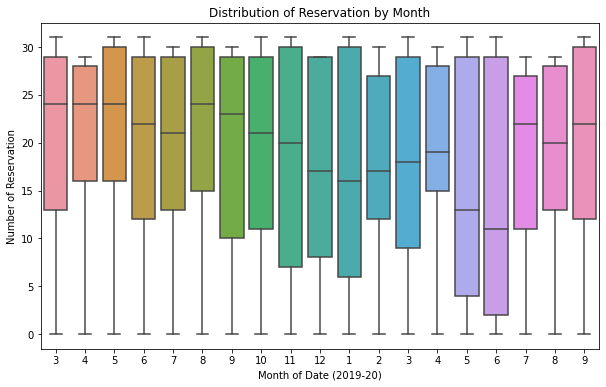

In [94]:
# Check outliners of the resampled monthly data
fig, ax=plt.subplots(figsize=(10,6))
labels=list(np.arange(3,13)) + list(np.arange(1,10))
sns.boxplot(data=calendar_m,y='Reserved_Count',x='date',ax=ax)
plt.title('Distribution of Reservation by Month')
ax.set_xticklabels(labels=labels)
ax.set_xlabel('Month of Date (2019-20)')
ax.set_ylabel('Number of Reservation')
plt.show()

# Boxplot tells the reservations are all in suitable range (0-30)

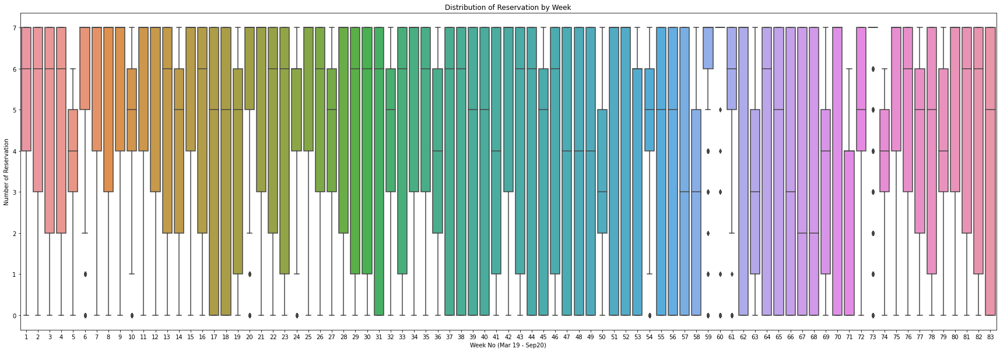

In [95]:
# Boxplot by week

week_no=list(calendar_w.date.unique())
fig, ax=plt.subplots(figsize=(30,10))
labels=list(np.arange(1,len(week_no)+1))
sns.boxplot(data=calendar_w,y='Reserved_Count',x='date',ax=ax)
plt.title('Distribution of Reservation by Week')
ax.set_xticklabels(labels=labels)
ax.set_xlabel('Week No (Mar 19 - Sep20)')
ax.set_ylabel('Number of Reservation')
plt.show()

# Boxplot tells the reservations are all in suitable range (0-7).Few outliners are observed but they are assumed as part of noraml population number

### 2.5)  Calculate the Number of Review Per Listing Per Month
AirBnB visitors were asked to write reviews for the AirBnB listing after staying overnight. Hence the number of reviews is also an indicator for determining the visiting frequency of AirBnB business. According to scholars, the review rate is around 50%.
However, different from the calendar dataset, this number did not consider the length of stay nor the number of visitors. Instead, it indicates the number of visits, which visits could be made by a group of visitors, or visitors could stay in the listing for more than one month. 

#### Limitations of Review Dataset
- Visitors can review their experience at anytime but most properly review in a week after renting. Hence, there are chances that these reviews are counted as next week/ next month's records, especially during for visitors who reviewed by the end of month. 
- Response rate is is 50% only (as calculated by the data source, Inside AirBnB)
- The review number does not indicate the length of stay, accommodates may live longer than one month yet review once only. 
- This study does not take reviewer's text comment into account

#### 2.5.1) Data Preparation

In [96]:
# Import the review file which included all reviews since 2010
review=pd.read_csv('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/202010_reviews.csv.gz',sep=',',parse_dates=['date'])

In [97]:
review.shape

(1207898, 6)

In [98]:
review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1207898 entries, 0 to 1207897
Data columns (total 6 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   listing_id     1207898 non-null  int64         
 1   id             1207898 non-null  int64         
 2   date           1207898 non-null  datetime64[ns]
 3   reviewer_id    1207898 non-null  int64         
 4   reviewer_name  1207897 non-null  object        
 5   comments       1207365 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 55.3+ MB


In [99]:
review.head(5)

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,11551,30672,2010-03-21,93896,Shar-Lyn,"The flat was bright, comfortable and clean and..."
1,11551,32236,2010-03-29,97890,Zane,We stayed with Adriano and Valerio for a week ...
2,11551,41044,2010-05-09,104133,Chase,Adriano was a fantastic host. We felt very at ...
3,11551,48926,2010-06-01,122714,John & Sylvia,We had a most wonderful stay with Adriano and ...
4,11551,58352,2010-06-28,111543,Monique,I'm not sure which of us misunderstood the s...


#### Data Cleaning

In [100]:
# Drop reviews where same reviewer give more than 1 comment in one day
review.drop_duplicates(subset=['listing_id','date','reviewer_id'],keep='first',inplace=True)

# A number of comments suggest some reviews are left automatically by system when host cancelled the reservation
# Drop these records
print(review.loc[review['comments'].str.contains('host canceled this reservation',na=False),:].head(5))
review = review.loc[~review['comments'].str.contains('host canceled this reservation',na=False),:]

review.head()

     listing_id         id       date  reviewer_id   reviewer_name  \
154       11551  104360132 2016-09-26     84148985         Winsome   
174       11551  197510459 2017-09-25    149479637         Michael   
175       11551  197807700 2017-09-27     73064030        Jonathan   
204       13913  262179591 2018-05-08     99110277        Philippe   
453       25123  212211101 2017-11-16    156529186  Krishnamoortee   

                                              comments  
154  The host canceled this reservation 6 days befo...  
174  The host canceled this reservation 31 days bef...  
175  The host canceled this reservation 57 days bef...  
204  The host canceled this reservation 53 days bef...  
453  The host canceled this reservation 35 days bef...  


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,11551,30672,2010-03-21,93896,Shar-Lyn,"The flat was bright, comfortable and clean and..."
1,11551,32236,2010-03-29,97890,Zane,We stayed with Adriano and Valerio for a week ...
2,11551,41044,2010-05-09,104133,Chase,Adriano was a fantastic host. We felt very at ...
3,11551,48926,2010-06-01,122714,John & Sylvia,We had a most wonderful stay with Adriano and ...
4,11551,58352,2010-06-28,111543,Monique,I'm not sure which of us misunderstood the s...


In [101]:
# Drop varaibles not covered in this study
review.drop(columns=['reviewer_id','reviewer_name','comments'],inplace=True)

In [102]:
# Check merge -- some rows deleted due to duplications and error in web scrapping
review.shape

(1187965, 3)

In [103]:
print(len(review.listing_id.unique()))

53730


In [104]:
# Filter the study periods 
review = review[(review['date'] > '2019-02-28') & (review['date'] < '2020-10-01')] 

#### Resampling

In [105]:
# resample by  month
review_m = review.groupby('listing_id').resample('M',on='date').count().drop(columns=['date','listing_id']).reset_index()
review_m.columns = ['listing_id','date','Review_no']
print(len(review_m.listing_id.unique()))
review_m.head(5)

38969


,listing_id,date,Review_no
0,11551,2019-07-31,1
1,11551,2019-08-31,0
2,11551,2019-09-30,1
3,11551,2019-10-31,0
4,11551,2019-11-30,1


In [106]:
# resample by  week
review_w = review.groupby('listing_id').resample('W',on='date').count().drop(columns=['date','listing_id']).reset_index()
review_w.columns = ['listing_id','date','Review_no']
print(len(review_w.listing_id.unique()))
review_w.head(5)

38969


,listing_id,date,Review_no
0,11551,2019-07-14,1
1,11551,2019-07-21,0
2,11551,2019-07-28,0
3,11551,2019-08-04,0
4,11551,2019-08-11,0


In [107]:
# Assign Data type
review_w.loc[:,'listing_id'] = review_w.loc[:,'listing_id'].astype('object')
review_m.loc[:,'listing_id'] = review_m.loc[:,'listing_id'].astype('object')
review_w.describe()

,Review_no
count,1.133248e+06
mean,3.895829e-01
std,6.813690e-01
min,0.000000e+00
25%,0.000000e+00
50%,0.000000e+00
75%,1.000000e+00
max,2.900000e+01


In [108]:
# Double check date range
print(review_w.date.min())
print(review_w.date.max())
print(review_m.date.min())
print(review_m.date.max())

2019-03-03 00:00:00
2020-10-04 00:00:00
2019-03-31 00:00:00
2020-09-30 00:00:00


In [109]:
print(review_w.shape)
print(review_m.shape)

(1133248, 3)
(287713, 3)


In [110]:
# Ensure same no. of id
print(len(review_m.listing_id.unique()))
print(len(review_w.listing_id.unique()))

38969
38969


#### 2.5.2) Handling Outliners and Data Transformation

Investigation in AirBnB website suggest different reviewers may leave review on the same day/ within same week. However, boxplot results suggest even after removing the duplicates of reviewer giving more than one review per day per listing, and removing the automatic cancellation message of AirBnB, a number of outliners exists within each month/ week of study period (**each dot below represent a listing in corresponding month/week**). 

The outliners may due to the replies and conversations between reviewers and host on website and hence should be removed from distribution. Assume one AirBnB customer can give one comment every day, the maximum number of reviews is no more than the total day in specific month, with few variations on number due to response latency.

In this dataset, removing the outliner is equivalent to setting review_no =0 when merging with other datasets (which is problematic). Logging is attempted to pull in high numbers. **Since the dataset is dominant by 0, an addition of 1 is added to each cell i.e. log(x+1). Median of each month/period will be used to imput the outliner.**

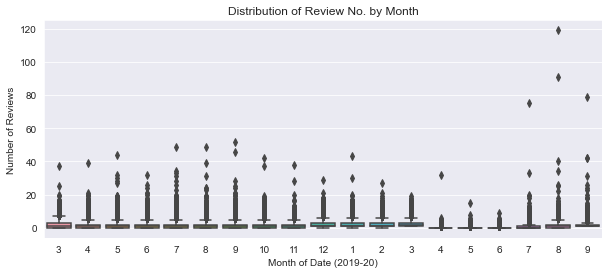

In [343]:
fig, ax=plt.subplots(figsize=(10,4))
labels=list(np.arange(3,13)) + list(np.arange(1,10))
sns.boxplot(data=review_m,y='Review_no',x='date',ax=ax)
plt.title('Distribution of Review No. by Month')
ax.set_xticklabels(labels=labels)
ax.set_xlabel('Month of Date (2019-20)')
ax.set_ylabel('Number of Reviews')
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Monthly Review Outliner')

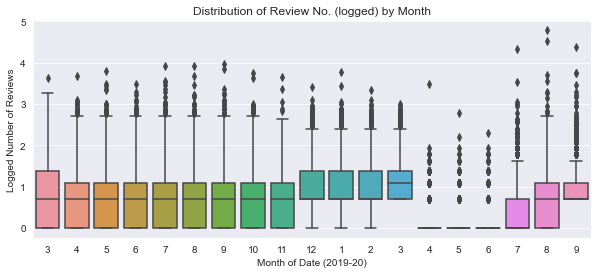

In [342]:
# Since zero exist in variable, value 1 is added to each observation
review_m['Review_no_log'] = (review_m.Review_no +1).apply(np.log)

# Boxplot showing distribution after log(x+1) transformation
fig, ax=plt.subplots(figsize=(10,4))
labels=list(np.arange(3,13)) + list(np.arange(1,11))
sns.boxplot(data=review_m,y='Review_no_log',x='date',ax=ax)
plt.title('Distribution of Review No. (logged) by Month')
ax.set_xticklabels(labels=labels)
ax.set_xlabel('Month of Date (2019-20)')
ax.set_ylabel('Logged Number of Reviews')
plt.show()


In [113]:
# Remove the Outliners as of each month (listings which are outliners after log transformation)

datelist= list(review_m.date.unique())
review_mlist = []

for month in datelist:
    review_date = review_m[review_m.date == month]
    q25 = np.percentile(review_date.Review_no_log,25)
    q75 = np.percentile(review_date.Review_no_log,75)
    upper = q75 + (q75-q25)*1.5
    lower = q25 - (q75-q25)*1.5
    median = review_date.Review_no.median()
    median_log = review_date.Review_no_log.median()
    review_date2=review_date.copy()
    review_date2.loc[(review_date.Review_no_log > upper) | (review_date.Review_no_log < lower),'Review_no'] = median
    review_date2.loc[(review_date.Review_no_log > upper) | (review_date.Review_no_log < lower),'Review_no_log'] = median_log
    review_mlist.append(review_date2)
    
review_m2 = pd.concat(review_mlist,axis=0)

In [114]:
# The number of listing remain in data suggest the help of log(x+1)
print(review_m2.shape)
print(review_m.shape)

(287713, 4)
(287713, 4)


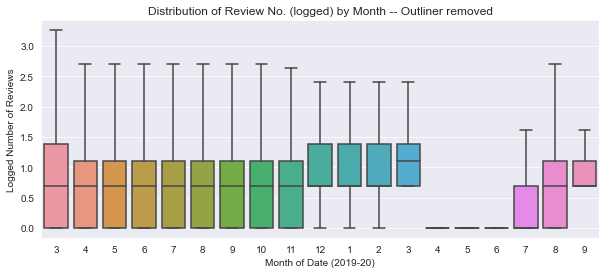

In [344]:
# Ensure all outliners are 'removed'
fig, ax=plt.subplots(figsize=(10,4))
labels=list(np.arange(3,13)) + list(np.arange(1,10))
sns.boxplot(data=review_m2,y='Review_no_log',x='date',ax=ax)
plt.title('Distribution of Review No. (logged) by Month -- Outliner removed')
ax.set_xticklabels(labels=labels)
ax.set_xlabel('Month of Date (2019-20)')
ax.set_ylabel('Logged Number of Reviews')
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Monthly Review Outliner Removed')

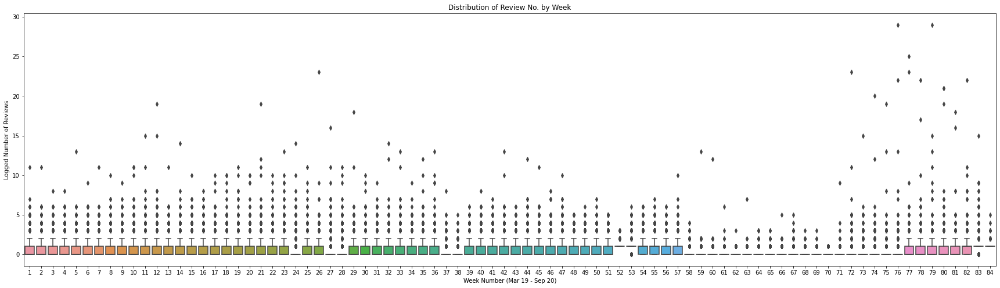

In [116]:
## Perform same check on weekly data

week_no = list(review_w.date.unique())

fig, ax=plt.subplots(figsize=(30,8))
labels=list(np.arange(1,len(week_no)+1))
sns.boxplot(data=review_w,y='Review_no',x='date',ax=ax)
plt.title('Distribution of Review No. by Week')
ax.set_xticklabels(labels=labels)
ax.set_xlabel('Week Number (Mar 19 - Sep 20)')
ax.set_ylabel('Logged Number of Reviews')
plt.show()

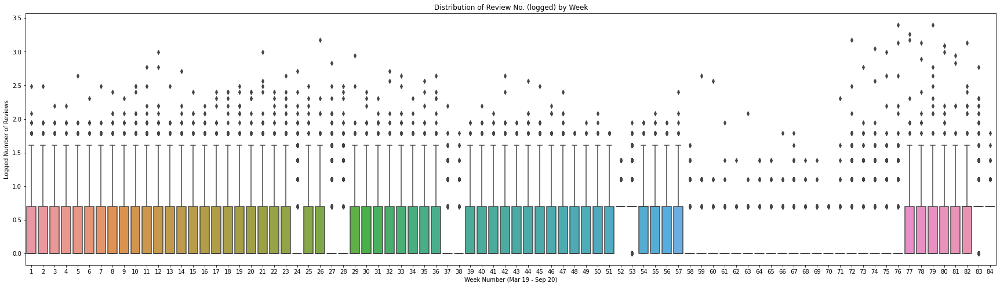

In [117]:
# Since zero exist in variable, value 1 is added to each observation
review_w['Review_no_log'] = (review_w.Review_no +1).apply(np.log)

# Boxplot showing distribution after log(x+1) transformation
fig, ax=plt.subplots(figsize=(30,8))
labels=list(np.arange(1,len(week_no)+1))
sns.boxplot(data=review_w,y='Review_no_log',x='date',ax=ax)
plt.title('Distribution of Review No. (logged) by Week')
ax.set_xticklabels(labels=labels)
ax.set_xlabel('Week Number (Mar 19 - Sep 20)')
ax.set_ylabel('Logged Number of Reviews')
plt.show()

In [118]:
# Remove the Outliners as of each week (listings which are outliners after log transformation)

datelist= list(review_w.date.unique())
review_wlist = []


for week in datelist:
    review_date = review_w[review_w.date == week]
    q25 = np.percentile(review_date.Review_no_log,25)
    q75 = np.percentile(review_date.Review_no_log,75)
    upper = q75 + (q75-q25)*1.5
    lower = q25 - (q75-q25)*1.5
    median = review_date.Review_no.median()
    median_log = review_date.Review_no_log.median()
    review_date2=review_date.copy()
    review_date2.loc[(review_date.Review_no_log > upper) | (review_date.Review_no_log < lower),'Review_no'] = median
    review_date2.loc[(review_date.Review_no_log > upper) | (review_date.Review_no_log < lower),'Review_no_log'] = median_log
    review_wlist.append(review_date2)
    
review_w2 = pd.concat(review_wlist,axis=0)

In [119]:
print(review_w.shape)
print(review_w2.shape)

(1133248, 4)
(1133248, 4)


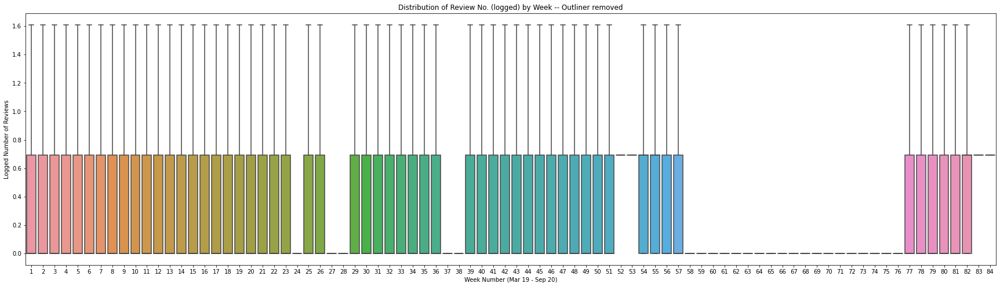

In [120]:
# Ensure all outliners are 'removed'
fig, ax=plt.subplots(figsize=(30,8))
labels=list(np.arange(1,len(week_no)+1))
sns.boxplot(data=review_w2,y='Review_no_log',x='date',ax=ax)
plt.title('Distribution of Review No. (logged) by Week -- Outliner removed')
ax.set_xticklabels(labels=labels)
ax.set_xlabel('Week Number (Mar 19 - Sep 20)')
ax.set_ylabel('Logged Number of Reviews')
plt.show()

In [121]:
# Ensure same number of listing
print(len(review_m2.listing_id.unique()))
print(len(review_w2.listing_id.unique()))

38969
38969


### 2.6) Borough Geographical Data

In [122]:
import geopandas as gpd
oa = gpd.read_file('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Borough/London_Borough_Excluding_MHW.shp')
oa.crs = "epsg:27700"

In [123]:
oa.drop(columns=['ONS_INNER','SUB_2009','SUB_2006','NONLD_AREA','HECTARES'],inplace=True)
oa.head()

,NAME,GSS_CODE,geometry
0,Kingston upon Thames,E09000021,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,E09000008,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,E09000006,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,E09000018,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,E09000009,"POLYGON ((510253.500 182881.600, 510249.900 18..."


In [124]:
# CHeck missing values
oa.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   NAME      33 non-null     object  
 1   GSS_CODE  33 non-null     object  
 2   geometry  33 non-null     geometry
dtypes: geometry(1), object(2)
memory usage: 920.0+ bytes


### 2.7) Dataset Integration

#### 2.7.1) Merging Borough information with Review Data

In [125]:
# Create a mapping list for listing_id & Neighborhood 
id_neighbor = pd.concat([listing_covid_7[['id','neighbourhood_cleansed']], listing_pre_7[['id','neighbourhood_cleansed']]])
id_neighbor.drop_duplicates(keep='first',subset=['id'],inplace=True)
id_neighbor.shape

(61577, 2)

In [126]:
# Obtain merging info from covid cases
neighbor_code = case_neighborhood_m[['Neighborhood','geo_code']].drop_duplicates(keep='first',subset=['Neighborhood'])
print(neighbor_code.shape)

id_neighbor_map = id_neighbor.merge(neighbor_code,left_on='neighbourhood_cleansed',right_on='Neighborhood',how='left').drop(columns='Neighborhood')
print(id_neighbor_map.shape)
print(len(list(id_neighbor_map.id.unique())))
id_neighbor_map.head(3)

(33, 2)
(61577, 3)
61577


,id,neighbourhood_cleansed,geo_code
0,11551,Lambeth,E09000022
1,13913,Islington,E09000019
2,15400,Kensington and Chelsea,E09000020


In [127]:
# Check borough names
id_neighbor_map.neighbourhood_cleansed.unique()

array(['Lambeth', 'Islington', 'Kensington and Chelsea', 'Westminster',
       'Barnet', 'Hounslow', 'Richmond upon Thames', 'Haringey',
       'Hammersmith and Fulham', 'Southwark', 'Brent', 'Camden',
       'Tower Hamlets', 'Hackney', 'Waltham Forest', 'Merton',
       'Wandsworth', 'Bromley', 'Lewisham', 'Greenwich', 'Ealing',
       'Enfield', 'Newham', 'Croydon', 'Barking and Dagenham', 'Harrow',
       'Hillingdon', 'Kingston upon Thames', 'Redbridge',
       'City of London', 'Bexley', 'Sutton', 'Havering', None],
      dtype=object)

In [128]:
print(review_m2.shape)
review_w2.shape

(287713, 4)


(1133248, 4)

In [129]:
# If the listing did not exist in mapping df (all active listing across two study period), listing info should be removed
# by month
review_m_neighbor = review_m2[review_m2.listing_id.isin(id_neighbor_map.id)]
review_m_neighbor = review_m_neighbor.merge(id_neighbor_map,left_on='listing_id',right_on='id',how='left').drop(columns='id')
print(review_m_neighbor.shape)
# by week
review_w_neighbor = review_w2[review_w2.listing_id.isin(id_neighbor_map.id)]
review_w_neighbor= review_w_neighbor.merge(id_neighbor_map,left_on='listing_id',right_on='id',how='left').drop(columns='id')
review_w_neighbor.shape

(285990, 6)


(1127791, 6)

In [130]:
# Check same number of listing
print(len(review_w_neighbor.listing_id.unique()))
len(review_m_neighbor.listing_id.unique())

38297


38297

In [131]:
print(review_m_neighbor.shape)
print(review_w_neighbor.shape)
review_m_neighbor.head(5)

(285990, 6)
(1127791, 6)


,listing_id,date,Review_no,Review_no_log,neighbourhood_cleansed,geo_code
0,11551,2019-07-31,1,0.693147,Lambeth,E09000022
1,13913,2019-07-31,0,0.000000,Islington,E09000019
2,15400,2019-07-31,0,0.000000,Kensington and Chelsea,E09000020
3,17402,2019-07-31,0,0.000000,Westminster,E09000033
4,25123,2019-07-31,0,0.000000,Barnet,E09000003


#### 2.7.2) Combine Reservation Data with Review Data

Merging the weekly review data (`review_w2`) with weekly booking data (`calendar_w`) reveals lots of null values, particular in `Review_no`. This is due to the voluntary-based reviews, and not considering the length of stay in review data (customer may live more than 1 week to leave a review). In this sense, it might be more robust to look at the monthly data.

As for the missing values, as the missing values are present due to no bookings/ reviews, 0 is impute in `Review_no` and `Reserved_Count`, while `Price` is impute according the previous week price.

In [132]:
len(list(id_neighbor_map.id.unique()))

61577

In [133]:
# by week
book_review_w = calendar_w.merge(review_w_neighbor,on=['listing_id','date'],how='outer')
# Ensure all listings are active
book_review_w = book_review_w[book_review_w.listing_id.isin(id_neighbor_map.id)]
print(len(list(book_review_w.listing_id.unique())))

61386


In [134]:
print(book_review_w.shape[0])
book_review_w.isna().sum()

3824986


listing_id                      0
date                            0
Price                      828525
Reserved_Count              26310
Review_no                 2697195
Review_no_log             2697195
neighbourhood_cleansed    2697195
geo_code                  2697195
dtype: int64

#### Handle Missing Values in merged dataset

In [135]:
# Fill missing values with 0 (as missing = no frequency)
book_review_w.Reserved_Count = book_review_w.Reserved_Count.fillna(value=0)
book_review_w.Review_no = book_review_w.Review_no.fillna(value=0)
book_review_w.Review_no_log = book_review_w.Review_no_log.fillna(value=0)
book_review_w.Price = book_review_w.Price.fillna(method='ffill')
book_review_w.drop(columns=['neighbourhood_cleansed','geo_code'],inplace=True)

In [136]:
# map the mapping list to fill neighborhood and double check if the listing is considered as active listing
book_review_w = book_review_w.merge(id_neighbor_map,left_on='listing_id',right_on='id',how='inner')
book_review_w.listing_id = book_review_w.listing_id.astype('object')
book_review_w.drop(columns='id',inplace=True)
book_review_w.head()

,listing_id,date,Price,Reserved_Count,Review_no,Review_no_log,neighbourhood_cleansed,geo_code
0,11551,2019-05-12,105.0,7.0,0.0,0.0,Lambeth,E09000022
1,11551,2019-05-19,105.0,7.0,0.0,0.0,Lambeth,E09000022
2,11551,2019-05-26,105.0,7.0,0.0,0.0,Lambeth,E09000022
3,11551,2019-06-02,105.0,7.0,0.0,0.0,Lambeth,E09000022
4,11551,2019-06-09,114.0,5.0,0.0,0.0,Lambeth,E09000022


In [137]:
book_review_w.isna().sum()

listing_id                0
date                      0
Price                     0
Reserved_Count            0
Review_no                 0
Review_no_log             0
neighbourhood_cleansed    0
geo_code                  0
dtype: int64

In [138]:
# Check the range of reserved night per week (0-7)
print(book_review_w.Reserved_Count.max())
print(book_review_w.Reserved_Count.min())

7.0
0.0


In [139]:
# Check the range of rev per week (0-7)
print(book_review_w.Review_no.max())
print(book_review_w.Review_no.min())

4.0
0.0


In [140]:
# merge by month
book_review_m = calendar_m.merge(review_m_neighbor,on=['listing_id','date'],how='outer')

book_review_m = book_review_m[book_review_m.listing_id.isin(id_neighbor_map.id)]
print(len(list(book_review_m.listing_id.unique())))
print(book_review_m.shape[0])
book_review_m.isna().sum()

61386
898348


listing_id                     0
date                           0
Price                      48807
Reserved_Count              6467
Review_no                 612358
Review_no_log             612358
neighbourhood_cleansed    612358
geo_code                  612358
dtype: int64

In [141]:
# Fill missing values
book_review_m.Reserved_Count = book_review_m.Reserved_Count.fillna(value=0)
book_review_m.Review_no = book_review_m.Review_no.fillna(value=0)
book_review_m.Review_no_log = book_review_m.Review_no_log.fillna(value=0)
book_review_m.Price = book_review_m.Price.fillna(method='ffill')
book_review_m.drop(columns=['neighbourhood_cleansed','geo_code'],inplace=True)

# map the mapping list to fill neighborhood and double check if the listing is considered as active listing
book_review_m = book_review_m.merge(id_neighbor_map,left_on='listing_id',right_on='id',how='inner')
book_review_m.listing_id = book_review_m.listing_id.astype('object')
book_review_m.drop(columns='id',inplace=True)
book_review_m.head()

,listing_id,date,Price,Reserved_Count,Review_no,Review_no_log,neighbourhood_cleansed,geo_code
0,11551,2019-05-31,105.000000,26.0,0.0,0.000000,Lambeth,E09000022
1,11551,2019-06-30,117.857143,28.0,0.0,0.000000,Lambeth,E09000022
2,11551,2019-07-31,120.000000,9.0,1.0,0.693147,Lambeth,E09000022
3,11551,2019-08-31,120.000000,0.0,0.0,0.000000,Lambeth,E09000022
4,11551,2019-09-30,110.000000,9.0,1.0,0.693147,Lambeth,E09000022


In [142]:
# Checked the range of reserved nights (0-31)
print(book_review_m.Reserved_Count.max())
print(book_review_m.Reserved_Count.min())

31.0
0.0


In [143]:
# Check range of review_no
print(book_review_m.Review_no.max())
print(book_review_m.Review_no.min())

25.0
0.0


In [144]:
# COnfirm missing values are all treated
book_review_m.isna().sum()

listing_id                0
date                      0
Price                     0
Reserved_Count            0
Review_no                 0
Review_no_log             0
neighbourhood_cleansed    0
geo_code                  0
dtype: int64

#### 2.7.3) Combine COVID cases data with the Visiting Frequency Data

In [145]:
book_review_m.shape

(898348, 8)

In [146]:
book_review_w.shape

(3824986, 8)

In [147]:
# Combine the COVID case number with the booking, review dataset by neighborhood name and date for correlation analysis
df_m_all = book_review_m.merge(case_neighborhood_m,left_on=['neighbourhood_cleansed','date','geo_code'],right_on=['Neighborhood','date','geo_code'],how='left')
df_w_all = book_review_w.merge(case_neighborhood_w,left_on=['neighbourhood_cleansed','date','geo_code'],right_on=['Neighborhood','date','geo_code'],how='left')

In [148]:
# Ensure Merging accuracy
print(df_m_all.shape)
print(df_w_all.shape)

(898348, 11)
(3824986, 11)


In [149]:
# Number of cases before the first record of COVID are considered as 0
min_case_date = cases.date.min()
df_m_all.loc[df_m_all['date'] < min_case_date,['new_cases','total_cases'] ] = 0
df_w_all.loc[df_w_all['date'] < min_case_date ,['new_cases','total_cases'] ] = 0

# Drop extra neighborhood variable
df_w_all.drop(columns='Neighborhood',inplace=True)
df_m_all.drop(columns='Neighborhood',inplace=True)

# Rename Col for clarification
df_w_all.columns = ['id','date','Price','Reserved_Count_wtotal','Review_no_wtotal','Review_no_wtotal_log','borough','geo_code','new_cases_wtotal','total_cases_wavg']
df_m_all.columns = ['id','date','Price','Reserved_Count_mtotal','Review_no_mtotal','Review_no_mtotal_log','borough','geo_code','new_cases_mtotal','total_cases_mavg']

In [150]:
print(df_w_all.head())

      id       date  Price  Reserved_Count_wtotal  Review_no_wtotal  \
0  11551 2019-05-12  105.0                    7.0               0.0   
1  11551 2019-05-19  105.0                    7.0               0.0   
2  11551 2019-05-26  105.0                    7.0               0.0   
3  11551 2019-06-02  105.0                    7.0               0.0   
4  11551 2019-06-09  114.0                    5.0               0.0   

   Review_no_wtotal_log  borough   geo_code  new_cases_wtotal  \
0                   0.0  Lambeth  E09000022               0.0   
1                   0.0  Lambeth  E09000022               0.0   
2                   0.0  Lambeth  E09000022               0.0   
3                   0.0  Lambeth  E09000022               0.0   
4                   0.0  Lambeth  E09000022               0.0   

   total_cases_wavg  
0               0.0  
1               0.0  
2               0.0  
3               0.0  
4               0.0  


In [151]:
print(df_m_all.isna().sum())

id                       0
date                     0
Price                    0
Reserved_Count_mtotal    0
Review_no_mtotal         0
Review_no_mtotal_log     0
borough                  0
geo_code                 0
new_cases_mtotal         0
total_cases_mavg         0
dtype: int64


In [152]:
print(df_w_all.isna().sum())

id                       0
date                     0
Price                    0
Reserved_Count_wtotal    0
Review_no_wtotal         0
Review_no_wtotal_log     0
borough                  0
geo_code                 0
new_cases_wtotal         0
total_cases_wavg         0
dtype: int64


In [153]:
# Ensure active listings
print(len(list(df_m_all.id.unique())))
print(len(list(df_w_all.id.unique())))

61386
61386


#### 2.7.4) Combine with Spatial Data

In [154]:
# Combine with monthly df data
sdf_m_all = df_m_all.merge(oa,left_on='geo_code',right_on='GSS_CODE',how='left')
sdf_m_all.drop(columns=['NAME','GSS_CODE'],inplace=True)
print(sdf_m_all.head())

      id       date       Price  Reserved_Count_mtotal  Review_no_mtotal  \
0  11551 2019-05-31  105.000000                   26.0               0.0   
1  11551 2019-06-30  117.857143                   28.0               0.0   
2  11551 2019-07-31  120.000000                    9.0               1.0   
3  11551 2019-08-31  120.000000                    0.0               0.0   
4  11551 2019-09-30  110.000000                    9.0               1.0   

   Review_no_mtotal_log  borough   geo_code  new_cases_mtotal  \
0              0.000000  Lambeth  E09000022               0.0   
1              0.000000  Lambeth  E09000022               0.0   
2              0.693147  Lambeth  E09000022               0.0   
3              0.000000  Lambeth  E09000022               0.0   
4              0.693147  Lambeth  E09000022               0.0   

   total_cases_mavg                                           geometry  
0               0.0  POLYGON ((530046.800 177893.400, 530048.400 17...  
1     

In [155]:
# Combine with weekly data
sdf_w_all = df_w_all.merge(oa,left_on='geo_code',right_on='GSS_CODE',how='left')
sdf_w_all.drop(columns=['NAME','GSS_CODE'],inplace=True)

In [156]:
# Ensure Merging accuracy
print(sdf_w_all.shape)
print(sdf_m_all.shape)

(3824986, 11)
(898348, 11)


In [157]:
print(len(list(sdf_m_all.id.unique())))
print(len(list(sdf_w_all.id.unique())))

61386
61386


#### 2.7.5) Subset COVID & Pre-COVID Study Period from Data for Further Analysis

In [158]:
# Select only COVID study period data 
sdf_m_covid = sdf_m_all.loc[(sdf_m_all['date'] > '2020-02-29') & (sdf_m_all['date'] < '2020-10-01'),: ]
sdf_w_covid = sdf_w_all.loc[(sdf_w_all['date'] > '2020-02-29') & (sdf_w_all['date'] < '2020-10-01'),: ]

# Select Pre-COVID study period data
sdf_m_pre = sdf_m_all.loc[(sdf_m_all['date'] > '2019-02-28') & (sdf_m_all['date'] < '2019-10-01'),: ]
sdf_w_pre = sdf_w_all.loc[(sdf_w_all['date'] > '2019-02-28') & (sdf_w_all['date'] < '2019-10-01'),: ]

In [159]:
print(len(list(sdf_m_covid.id.unique())))
print(len(list(sdf_w_covid.id.unique())))
print(len(list(sdf_m_pre.id.unique())))
print(len(list(sdf_w_pre.id.unique())))

53734
53843
52289
52269


In [160]:
# Ensure both have same id (difference may due to resampling and subsetting the two study period)
sdf_w_covid = sdf_w_covid[sdf_w_covid.id.isin(list(sdf_m_covid.id.unique()))]
sdf_m_covid = sdf_m_covid[sdf_m_covid.id.isin(list(sdf_w_covid.id.unique()))]
sdf_m_pre = sdf_m_pre[sdf_m_pre.id.isin(list(sdf_w_pre.id.unique()))]
sdf_w_pre = sdf_w_pre[sdf_w_pre.id.isin(list(sdf_m_pre.id.unique()))]

In [161]:
print(len(list(sdf_m_covid.id.unique())))
print(len(list(sdf_w_covid.id.unique())))
print(len(list(sdf_m_pre.id.unique())))
print(len(list(sdf_w_pre.id.unique())))

53707
53707
52269
52269


In [162]:
sdf_m_covid.reset_index(level=0,inplace=True,drop=True)
sdf_w_covid.reset_index(level=0,inplace=True,drop=True)
sdf_m_pre.reset_index(level=0,inplace=True,drop=True)
sdf_w_pre.reset_index(level=0,inplace=True,drop=True)
print(sdf_m_covid.head())

      id       date       Price  Reserved_Count_mtotal  Review_no_mtotal  \
0  11551 2020-03-31  112.727273                    0.0               2.0   
1  11551 2020-04-30  112.727273                    0.0               0.0   
2  11551 2020-05-31  112.727273                    0.0               0.0   
3  11551 2020-06-30   90.000000                   15.0               0.0   
4  11551 2020-07-31   85.789474                   19.0               0.0   

   Review_no_mtotal_log  borough   geo_code  new_cases_mtotal  \
0              1.098612  Lambeth  E09000022             552.0   
1              0.000000  Lambeth  E09000022             655.0   
2              0.000000  Lambeth  E09000022             116.0   
3              0.000000  Lambeth  E09000022              27.0   
4              0.000000  Lambeth  E09000022              71.0   

   total_cases_mavg                                           geometry  
0        157.322581  POLYGON ((530046.800 177893.400, 530048.400 17...  
1     

In [163]:
# Confirm the study period
print(sdf_m_covid.date.min())
print(sdf_m_covid.date.max())
print(sdf_w_covid.date.min())
print(sdf_w_covid.date.max())

print(sdf_m_pre.date.min())
print(sdf_m_pre.date.max())
print(sdf_w_pre.date.min())
print(sdf_w_pre.date.max())

2020-03-31 00:00:00
2020-09-30 00:00:00
2020-03-01 00:00:00
2020-09-27 00:00:00
2019-03-31 00:00:00
2019-09-30 00:00:00
2019-03-03 00:00:00
2019-09-29 00:00:00


In [164]:
# Ensure active listings are only included -- less than before as some only exist between two study period
print(len(list(sdf_m_covid.id.unique())))
print(len(list(sdf_w_covid.id.unique())))

53707
53707


#### 2.7.6) Combine Spatial Data & Visiting Frequency Per Month on Listing Data

In [165]:
listing_covid_7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33343 entries, 0 to 33750
Data columns (total 73 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   id                           33342 non-null  object        
 1   host_id                      33342 non-null  object        
 2   host_since                   33342 non-null  datetime64[ns]
 3   host_response_time           33342 non-null  object        
 4   host_response_rate           33342 non-null  float64       
 5   host_is_superhost            33342 non-null  object        
 6   host_listings_count          33342 non-null  float64       
 7   host_has_profile_pic         33342 non-null  object        
 8   host_identity_verified       33342 non-null  object        
 9   neighbourhood_cleansed       33342 non-null  object        
 10  latitude                     33342 non-null  float64       
 11  longitude                    33342 non-nu

In [166]:
# Sum up the total number of reservation/ review per listing in COVID period
listing_result_covid = sdf_m_covid.groupby('id')[['Reserved_Count_mtotal','Review_no_mtotal']].sum()
listing_result_pre = sdf_m_pre.groupby('id')[['Reserved_Count_mtotal','Review_no_mtotal']].sum()
listing_result_covid.reset_index(inplace=True)
listing_result_pre.reset_index(inplace=True)

In [167]:
# Dataframe of Listing of Two Study Periods, drop unnecessary columns to reduce features
listing_covid_8 = listing_covid_7.drop(columns=['neighbourhood_cleansed','first_review','host_since','host_id','last_review','longitude','latitude'])
listing_pre_8 = listing_pre_7.drop(columns=['neighbourhood_cleansed','first_review','host_since','host_id','last_review','longitude','latitude'])

# Combine with Spatial Data (COVID) and their visit frequency figures and missing in fill frequency
listing_covid_f = listing_covid_8.merge(id_neighbor_map,on='id',how='left').merge(oa,left_on='geo_code',right_on='GSS_CODE',how='left').merge(listing_result_covid,on='id',how='left')
listing_covid_f.drop(columns=['NAME','GSS_CODE','geo_code'],inplace=True)
listing_covid_f.drop(listing_covid_f.loc[listing_covid_f.id.isna(),'id'].index,inplace=True)
listing_covid_f.reset_index(inplace=True,drop=True)
listing_covid_f.rename(columns={'Reserved_Count_mtotal':'Reserved_Count_6mtotal','Review_no_mtotal':'Review_no_6mtotal'},inplace=True)
listing_covid_f.Reserved_Count_6mtotal = listing_covid_f.Reserved_Count_6mtotal.fillna(0)
listing_covid_f.Review_no_6mtotal = listing_covid_f.Review_no_6mtotal.fillna(0)
# Encoding on T/F variable
listing_covid_f.host_is_superhost = listing_covid_f.host_is_superhost.map({'f':0,'t':1})
listing_covid_f.host_has_profile_pic = listing_covid_f.host_has_profile_pic.map({'f':0,'t':1})
listing_covid_f.host_identity_verified = listing_covid_f.host_identity_verified.map({'f':0,'t':1})
listing_covid_f = listing_covid_f.astype({'host_is_superhost':'int64','host_has_profile_pic':'int64','host_identity_verified':'int64'})

# Combine with Spatial Data (pre-COVID) and their visit frequency figures
listing_pre_f = listing_pre_8.merge(id_neighbor_map,on='id',how='left').merge(oa,left_on='geo_code',right_on='GSS_CODE',how='left').merge(listing_result_pre,on='id',how='left')
listing_pre_f.drop(columns=['NAME','GSS_CODE','geo_code'],inplace=True)
listing_pre_f.rename(columns={'Reserved_Count_mtotal':'Reserved_Count_6mtotal','Review_no_mtotal':'Review_no_6mtotal'},inplace=True)
listing_pre_f.drop(listing_pre_f.loc[listing_pre_f.id.isna(),'id'].index,inplace=True)
listing_pre_f.reset_index(inplace=True,drop=True)
listing_pre_f.Reserved_Count_6mtotal = listing_pre_f.Reserved_Count_6mtotal.fillna(0)
listing_pre_f.Review_no_6mtotal = listing_pre_f.Review_no_6mtotal.fillna(0)
# Encoding on T/F variable
listing_pre_f.host_is_superhost = listing_pre_f.host_is_superhost.map({'f':0,'t':1})
listing_pre_f.host_has_profile_pic = listing_pre_f.host_has_profile_pic.map({'f':0,'t':1})
listing_pre_f.host_identity_verified = listing_pre_f.host_identity_verified.map({'f':0,'t':1})
listing_pre_f = listing_pre_f.astype({'host_is_superhost':'int64','host_has_profile_pic':'int64','host_identity_verified':'int64'})

print(listing_covid_f.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33342 entries, 0 to 33341
Data columns (total 70 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   id                           33342 non-null  object  
 1   host_response_time           33342 non-null  object  
 2   host_response_rate           33342 non-null  float64 
 3   host_is_superhost            33342 non-null  int64   
 4   host_listings_count          33342 non-null  float64 
 5   host_has_profile_pic         33342 non-null  int64   
 6   host_identity_verified       33342 non-null  int64   
 7   property_type                33342 non-null  object  
 8   room_type                    33342 non-null  object  
 9   maximum_nights               33342 non-null  float64 
 10  half_bath_TF                 33342 non-null  float64 
 11  shared_TF                    33342 non-null  float64 
 12  NG_bath_TF                   33342 non-null  float64 
 13  h

In [168]:
# Dataframe for Model buildings (COVID period dataset) - drop variables which their dummy variables have been created
listing_covid_ML = listing_covid_f.drop(columns=['property_type','room_type','geometry'])

# Encoding on host_response_time to ordinal variable
listing_covid_ML.host_response_time = listing_covid_ML.host_response_time.copy().map({'within an hour':1,'within a few hours':2,'within a day':3,'a few days or more':4})

# Create dummy varaibles for neighborhood
neighborhood  = pd.get_dummies(listing_covid_ML.neighbourhood_cleansed,prefix='borough')
listing_covid_ML = pd.concat([listing_covid_ML,neighborhood],axis=1)
listing_covid_ML.drop(columns='neighbourhood_cleansed',inplace=True)
print(listing_covid_ML.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33342 entries, 0 to 33341
Data columns (total 99 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              33342 non-null  object 
 1   host_response_time              33342 non-null  int64  
 2   host_response_rate              33342 non-null  float64
 3   host_is_superhost               33342 non-null  int64  
 4   host_listings_count             33342 non-null  float64
 5   host_has_profile_pic            33342 non-null  int64  
 6   host_identity_verified          33342 non-null  int64  
 7   maximum_nights                  33342 non-null  float64
 8   half_bath_TF                    33342 non-null  float64
 9   shared_TF                       33342 non-null  float64
 10  NG_bath_TF                      33342 non-null  float64
 11  host_verifications_TF           33342 non-null  float64
 12  host_experience                 

In [169]:
# DataFrame for spatial analysis - drop dummy variables
listing_covid_spatial= listing_covid_f.drop(columns=['id','townhouse','apartment','cottage_bungalow','hostel_hotel','entire_house','hotel_rm','private_rm','share_rm'])
listing_pre_spatial= listing_pre_f.drop(columns=['id','townhouse','apartment','cottage_bungalow','hostel_hotel','entire_house','hotel_rm','private_rm','share_rm'])
listing_covid_spatial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33342 entries, 0 to 33341
Data columns (total 61 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   host_response_time           33342 non-null  object  
 1   host_response_rate           33342 non-null  float64 
 2   host_is_superhost            33342 non-null  int64   
 3   host_listings_count          33342 non-null  float64 
 4   host_has_profile_pic         33342 non-null  int64   
 5   host_identity_verified       33342 non-null  int64   
 6   property_type                33342 non-null  object  
 7   room_type                    33342 non-null  object  
 8   maximum_nights               33342 non-null  float64 
 9   half_bath_TF                 33342 non-null  float64 
 10  shared_TF                    33342 non-null  float64 
 11  NG_bath_TF                   33342 non-null  float64 
 12  host_verifications_TF        33342 non-null  float64 
 13  h

### 2.8) Summary of Dataset

##### Data wrangling and transformation have been performed in previous sessions and the merged datasets are as follows:
(1) `sdf_m_all`: March 2019 to Sep 2020 **Monthly** Data which describe the change in **Total No. of Reviews, Total No. of Reservation and Average Price Per Listing**, in additional to the change in **Total No. of New COVID Cases and Average No. of all COVID Cases at the listings' Borough (with geometry information)**.

(2) `sdf_w_all`: **Weekly** Data and others are same as above

(3) `sdf_m_covid`/ `sdf_m_pre`: Subset of (1), separating COVID Period and Pre-COVID Period respectively

(4) `sdf_w_covid`/ `sdf_w_pre`: Subset of (2), separating COVID Period and Pre-COVID Period respectively

(5) `listing_covid_spatial` & `listing_pre_spatial` : Listing Data, containing **spatial information, listing infomation and their total number of review/ reservations** in the corresponding study period

(6) `listing_covid_ML`: Listing dataset similar to (5) but with Hot encoding performed with for building model

### 3) Temporal Analysis on AirBnB Visiting Frequency

### 3.1) Understand the Trend of Visiting Frequency

#### Monthly Trend

In [170]:
# Aggregate by borough to speed up loading time
sdf_m_sum = sdf_m_all.groupby(['date','borough'])[['Reserved_Count_mtotal','Review_no_mtotal','Price']].agg({'Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','Price':'mean'})
sdf_m_sum.reset_index(inplace=True)
sdf_m_sum.head(5)

,date,borough,Reserved_Count_mtotal,Review_no_mtotal,Price
0,2019-03-31,Barking and Dagenham,1515.0,78.0,48.438709
1,2019-03-31,Barnet,9700.0,430.0,66.105709
2,2019-03-31,Bexley,905.0,37.0,50.642044
3,2019-03-31,Brent,20897.0,817.0,75.738171
4,2019-03-31,Bromley,4043.0,130.0,63.202680


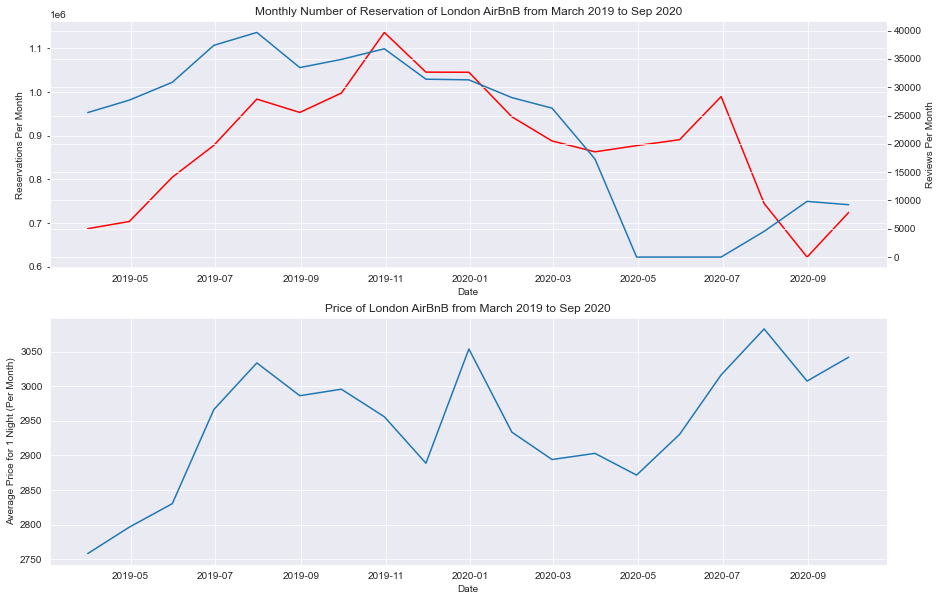

In [340]:
fig,(ax,ax3) = plt.subplots(nrows=2,figsize = (15,10))
sns.set_style("darkgrid")
sns.lineplot(data = sdf_m_sum,x='date',y='Reserved_Count_mtotal',ci=None,estimator='sum',ax=ax,color="r")
ax.set(xlabel='Date',ylabel='Reservations Per Month',title='Monthly Number of Reservation of London AirBnB from March 2019 to Sep 2020')

ax2=ax.twinx()
sns.lineplot(data = sdf_m_sum,x='date',y='Review_no_mtotal',ci=None,estimator='sum',ax=ax2)
ax2.set(ylabel='Reviews Per Month')

sns.lineplot(data = sdf_m_sum,x='date',y='Price',ci=None,estimator='sum',ax=ax3)
ax3.set(xlabel='Date',ylabel='Average Price for 1 Night (Per Month)',title='Price of London AirBnB from March 2019 to Sep 2020')
plt.show()

fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Temporal Trend')

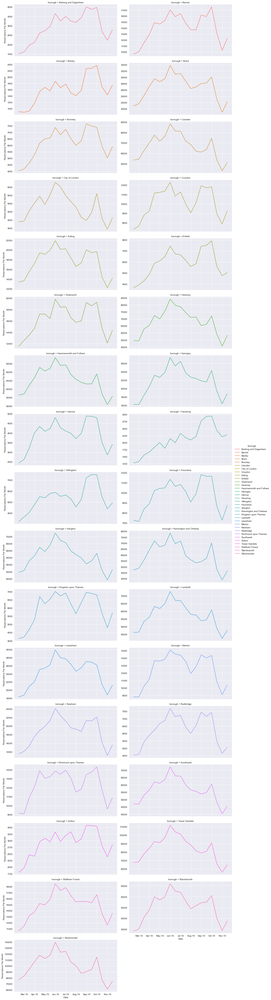

In [172]:
# Showing Trend by Borough
month_list = list(sdf_m_sum.date.dt.strftime('%b-%y').unique())

g= sns.relplot(
    data=sdf_m_sum, x="date", y="Reserved_Count_mtotal",
    col="borough", kind="line",col_wrap=2,hue="borough",height=3.5,aspect=2,facet_kws=dict(sharey=False)
)

for ax in g.axes:
    g.set_xlabels('Date')
    g.set_ylabels('Reservations Per Month')
    g.set_xticklabels(month_list)
    
plt.show()

#### Weekly Trend

In [173]:
# Aggregate by borough to speed up loading time
sdf_w_sum = sdf_w_all.groupby(['date','borough'])[['Reserved_Count_wtotal','Review_no_wtotal','Price']].agg({'Reserved_Count_wtotal':'sum','Review_no_wtotal':'sum','Price':'mean'})
sdf_w_sum.reset_index(inplace=True)
sdf_w_sum.head()

,date,borough,Reserved_Count_wtotal,Review_no_wtotal,Price
0,2019-03-03,Barking and Dagenham,269.0,9.0,65.591126
1,2019-03-03,Barnet,1855.0,44.0,78.934630
2,2019-03-03,Bexley,188.0,2.0,61.751020
3,2019-03-03,Brent,4067.0,74.0,85.622047
4,2019-03-03,Bromley,847.0,14.0,77.621566


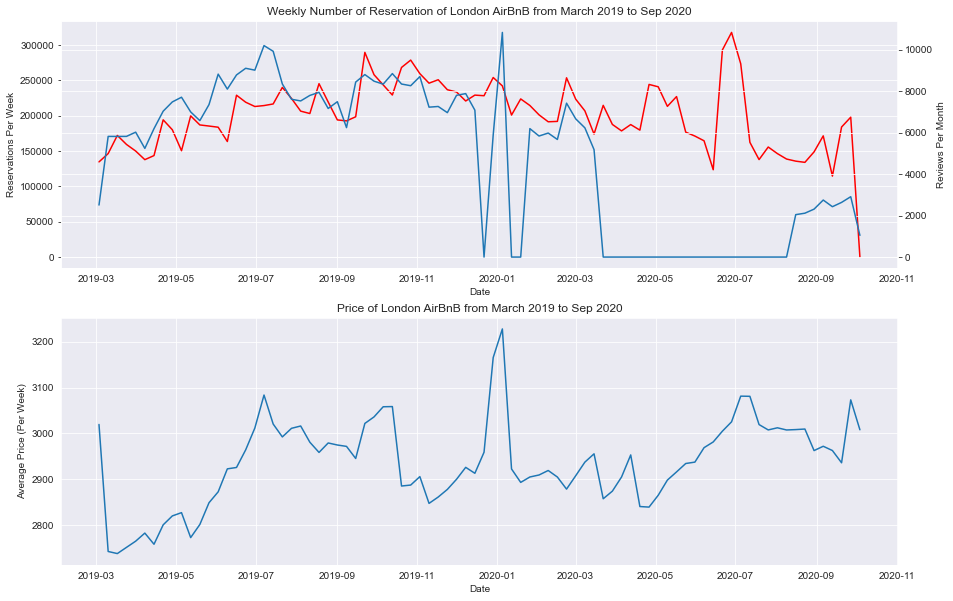

In [174]:
fig,(ax,ax3) = plt.subplots(nrows=2,figsize = (15,10))
sns.set_style("darkgrid")
sns.lineplot(data = sdf_w_sum,x='date',y='Reserved_Count_wtotal',ci=None,estimator='sum',ax=ax,color="r")
ax.set(xlabel='Date',ylabel='Reservations Per Week',title='Weekly Number of Reservation of London AirBnB from March 2019 to Sep 2020')

ax2=ax.twinx()
sns.lineplot(data = sdf_w_sum,x='date',y='Review_no_wtotal',ci=None,estimator='sum',ax=ax2)
ax2.set(ylabel='Reviews Per Month')

sns.lineplot(data = sdf_w_sum,x='date',y='Price',ci=None,estimator='sum',ax=ax3)
ax3.set(xlabel='Date',ylabel='Average Price (Per Week)',title='Price of London AirBnB from March 2019 to Sep 2020')
plt.show()

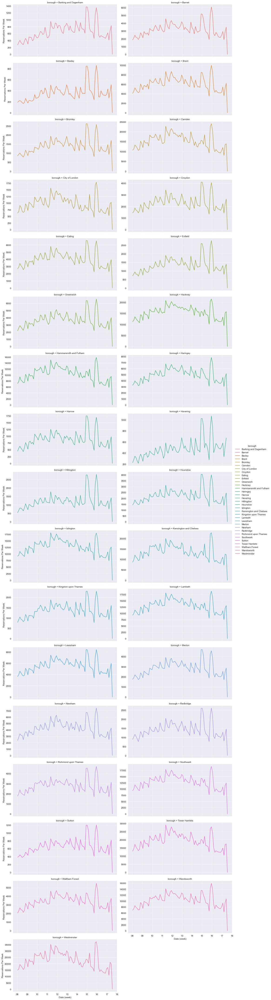

In [175]:
# Showing Trend by Borough
week_list = list(sdf_w_sum.date.dt.strftime('%W').unique())

g= sns.relplot(
    data=sdf_w_sum, x="date", y="Reserved_Count_wtotal",
    col="borough", kind="line",col_wrap=2,hue="borough",height=3.5,aspect=2,facet_kws=dict(sharey=False)
)

for ax in g.axes:
    g.set_xlabels('Date (week)')
    g.set_ylabels('Reservations Per Week')
    g.set_xticklabels(week_list)
    
plt.show()

#### Summary on the Trend of Visiting Frequency 


The overall temporal change among `Review_no` and `Reservation_no` is quite similar and similar trends are also common when break down by London borough. We can see that both `review_no` and `reservation_no` rises from March 2019 and peak at around Nov-Dec 2019. Compared with this period, in general, both indicators are decressing are observed from March 2020 to September 2020 and `Review_no` is quite clear, as it sinked to almost 0 in May-Jul 2020 Period. In addition, a little peak in `reservation_no` is observed in Jul 2020, while the `review_no` remains low/ close to 0.

As for weekly trend, generally speaking, the trend suggests similar trends as above but fluctuate more than the monthly trend. By context  it may be due to the length of renting of AirBnB customers. This phenonmenon is particularly obvious among `review_no`. As stated in session 1, review data is limited as customers may not comment on the exact day of the booking, or may leave more than one review (including replies) over same booking on different days (which cannot be checked). Therefore, **monthly aggregation** will be a more sounded approach in further analysis. 





#### Understand Two Indicators of Visiting Frequency

Although `review_no` demonstrated few limitations, by context if it is analyzed with `reservation_no`, it may give insights on number of customer group the listing serves (given the response rate) over the a period of reservations. In addition, since reservation dataset shows the future booking at monthly basis, cancellation or urgent bookings within one month are not recognized in data. Hence it is suggested to analyze with consideration of both indicators.


### 3.2) Visiting Frequency of AirBnB before and during COVID

**Hypothesis statement**: Visiting Frequency in COVID period is **different from** that in same period last year. 

In [176]:
# Visiting frequency per listing over the 7 month periods
sdf_m_covid_grp =sdf_m_covid.groupby('id')[['Reserved_Count_mtotal','Review_no_mtotal','Price']].agg({'Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','Price':'mean'})
sdf_m_covid_grp['Period'] = 'COVID'
sdf_m_pre_grp =sdf_m_pre.groupby('id')[['Reserved_Count_mtotal','Review_no_mtotal','Price']].agg({'Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','Price':'mean'})
sdf_m_pre_grp['Period'] = 'Pre-COVID'

#Find the mean/ std/ lambda of the two distributions
sdf_m_covid_grp_rvmean = sdf_m_covid_grp.Reserved_Count_mtotal.mean() # also equal to lambda of poisson distribution n/k
sdf_m_covid_grp_rvstd = sdf_m_covid_grp.Reserved_Count_mtotal.std()
sdf_m_pre_grp_rvmean=  sdf_m_pre_grp.Reserved_Count_mtotal.mean()
sdf_m_pre_grp_rvstd=  sdf_m_pre_grp.Reserved_Count_mtotal.std()

sdf_m_covid_grp_rwmean = sdf_m_covid_grp.Review_no_mtotal.mean() # also equal to lambda of poisson distribution n/k
sdf_m_covid_grp_rwstd = sdf_m_covid_grp.Review_no_mtotal.std()
sdf_m_pre_grp_rwmean=  sdf_m_pre_grp.Review_no_mtotal.mean()
sdf_m_pre_grp_rwstd=  sdf_m_pre_grp.Review_no_mtotal.std()

#### Understand the Distribution of Reservations and Review per listing over the two 7-month study periods

It is clear that both distributions of two periods, including `review_no` and `reservation_no` are heavily skewed. The reservation Number of COVID period skewed to the left (approach 0) and that of pre-COVID period skewed to the right. In other words, it suggests that hosts tended to rent their listings in a shorter term, hence the distributions shift from right-skewed to left-skewed. The boxplot also suggest no outliners exists in the distributions.

As for the review distributions, both skewed to the left. Outliners are commonly found in Review distribution, yet in previous sessions we have removed extreme values, hence they will not be treated here.

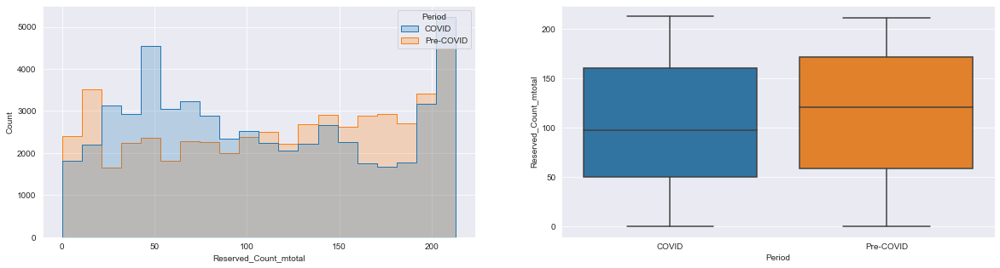

COVID mean: 106.35377138920438 | std: 63.79385334471643
Pre-COVID mean: 114.95431326407622 | std: 64.58736057953311


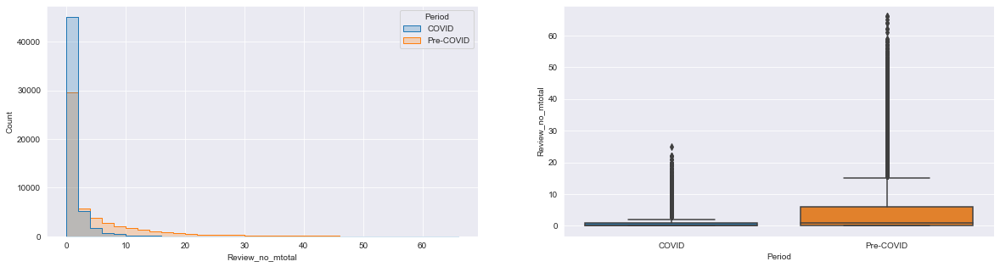

COVID mean: 0.7617628986910459 | std: 1.7564790675229969
Pre-COVID mean: 4.392240142340584 | std: 7.821461259216542


In [363]:
# Concat two study periods for plotting
sdf_m_grp = pd.concat([sdf_m_covid_grp,sdf_m_pre_grp])

# Distribution of two study periods
fig1, (ax1,ax2) =  plt.subplots(ncols=2,figsize=(20,5))
sns.histplot(data=sdf_m_grp,x='Reserved_Count_mtotal',hue='Period',element='step',ax=ax1,bins=20)
plt.xlabel('Number of Reservations of Listing over the Period')
sns.boxplot(data=sdf_m_grp,y='Reserved_Count_mtotal',x='Period',ax=ax2)
plt.show()
print('COVID mean: ' + str(sdf_m_covid_grp_rvmean) + ' | std: ' + str( sdf_m_covid_grp_rvstd))
print('Pre-COVID mean: ' + str(sdf_m_pre_grp_rvmean)+ ' | std: ' + str( sdf_m_pre_grp_rvstd))


fig2, (ax3,ax4) =  plt.subplots(ncols=2,figsize=(20,5))
sns.histplot(data=sdf_m_grp,x='Review_no_mtotal',hue='Period',element='step',binwidth=2,ax=ax3)
sns.boxplot(data=sdf_m_grp,y='Review_no_mtotal',x='Period',ax=ax4)
plt.show()
print('COVID mean: ' + str(sdf_m_covid_grp_rwmean) + ' | std: ' + str( sdf_m_covid_grp_rwstd))
print('Pre-COVID mean: ' + str(sdf_m_pre_grp_rwmean)+ ' | std: ' + str( sdf_m_pre_grp_rwstd))

fig2.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Comparison_histogram_Review')

#### Significant Testing
As the data is drawn from a fixed period of time of all AirBnB listings, it demonstrates a **discrete poisson distribution**, where random “events” occur at a certain rate over a period of time. In this cases, apart from the t-test, a **Kolmogorov-Smirnov Test (KS test)** is performed to compare and test if there is difference betwen the two distributions.Unlike T-Test, which assumes normal distribution and not suitable to use here.

Lambda (equivalent to mean in this case), are used to create empirical poisson distribution. Not that this test is conditional, assumed the test statistic being the maximum absolute difference between the empirical distribution function and its conditional expectation given the sample total.

**H0: Lambda (COVID) = Lambda (Pre-COVID)**

**H1: Lambda (COVID) ~= Lambda (Pre-COVID)**

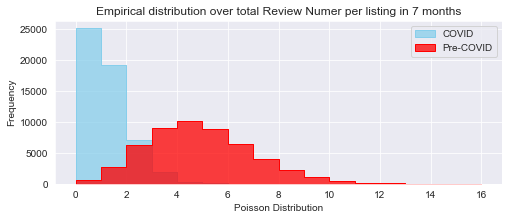

In [180]:
# Generate two poisson distribution
from scipy.stats import poisson
reservation_poisson_covid = poisson.rvs(mu=sdf_m_covid_grp_rvmean, size=sdf_m_covid_grp.shape[0])
reservation_poisson_pre = poisson.rvs(mu=sdf_m_pre_grp_rvmean, size=sdf_m_pre_grp.shape[0])

review_poisson_covid = poisson.rvs(mu=sdf_m_covid_grp_rwmean, size=sdf_m_covid_grp.shape[0])
review_poisson_pre = poisson.rvs(mu=sdf_m_pre_grp_rwmean, size=sdf_m_pre_grp.shape[0])

fig,ax = plt.subplots(figsize=(8,3))
sns.histplot(review_poisson_covid,ax=ax,element='step',binwidth=1,color='skyblue')
sns.histplot(review_poisson_pre,ax=ax,element='step',binwidth=1,color='red')
ax.legend(['COVID','Pre-COVID'])
ax.set(xlabel='Poisson Distribution', ylabel='Frequency',title='Empirical distribution over total Review Numer per listing in 7 months')
plt.show()

In [181]:
# Compare the mean/ lambda of the two distributions

ks_reservation, ks_reservation_p = stats.ks_2samp(reservation_poisson_covid, reservation_poisson_pre)
ks_review, ks_review_p = stats.ks_2samp(review_poisson_covid, review_poisson_pre)

print('P-value of Reservation poisson distributions is ' + str(ks_reservation_p) +', test statistics is ' + str(ks_reservation))
print('P-value of Review poisson distributions is ' + str(ks_review_p) +', test statistics is ' + str(ks_review))

P-value of Reservation poisson distributions is 0.0, test statistics is 0.3226649742225681
P-value of Review poisson distributions is 0.0, test statistics is 0.7724752968825717


#### Difference between two poisson distributions
The p-value of the above sessions suggest that there are significant difference between the two poisson distributions over the 7-month study periods. We also note that this significant result is built based on comparing Lambda of two distributions, and based on comparing empirical poisson distributions.

Further analysis should be to find out the difference between two poisson distributions since they are significantly different from each other. **Kullback-Leibler Divergence** is useful for comparing the difference between two distributions, especially for complex distributions. Higher KL Divergence suggests further distance.
According to Alexander (2018), the KL Diverence of Poisson Distribution can be calculated from the below formula.

*KL(pλ1||pλ2) = λ1 * log(λ1/ λ2) − (λ1 − λ2)*

Reference: Etz, Alexander. (2018). Technical Notes on Kullback-Leibler Divergence. 10.31234/osf.io/5vhzu. (https://psyarxiv.com/5vhzu) 

In [182]:
## Calculate the KL Divergence
KL_Reservation = (sdf_m_pre_grp_rvmean*np.log2(sdf_m_pre_grp_rvmean/sdf_m_covid_grp_rvmean)) - (sdf_m_pre_grp_rvmean-sdf_m_covid_grp_rvmean)
print('The KL divergence between COVID distribution & Pre-COVID distribution on total number of reservation is ' + str(KL_Reservation))

KL_Review  = (sdf_m_pre_grp_rwmean*np.log2(sdf_m_pre_grp_rwmean/sdf_m_covid_grp_rwmean)) - (sdf_m_pre_grp_rwmean-sdf_m_covid_grp_rwmean)
print('The KL divergence between COVID distribution & Pre-COVID distribution on total number of review is ' + str(KL_Review))

The KL divergence between COVID distribution & Pre-COVID distribution on total number of reservation is 4.296114236891068
The KL divergence between COVID distribution & Pre-COVID distribution on total number of review is 7.471098607943882


##### Summary
From the KL Divergence we understand that the difference of COVID and Non-COVID period are more obvious among the Review Distribution than Reservation Distribution.

#### Analysis on the Mode on COVID Period



Reservation distribution of Pre-COVID period is clearly right-skewed. On the other hand, the reservation distribution in COVID period demonstrate a left-skewed distribution, while another peak remains in the right (a sign for Biomodal distribution). In other words, **a number of listings are resistent to the shift in distributions**. This may indicate there are two cohorts with different properties/ mechanism behinds the distributions. Significant testing have been performed to test if there are difference among these long term listings between two periods.

In this study, we use 180 reservations as a cut off point, since prior knowledge suggest 180 stays within around 210 stays (half year) are quite long in short-term rental housing like AirBnB. Besides, the histogram chart shows a rise in reservations count at reservation = 180.

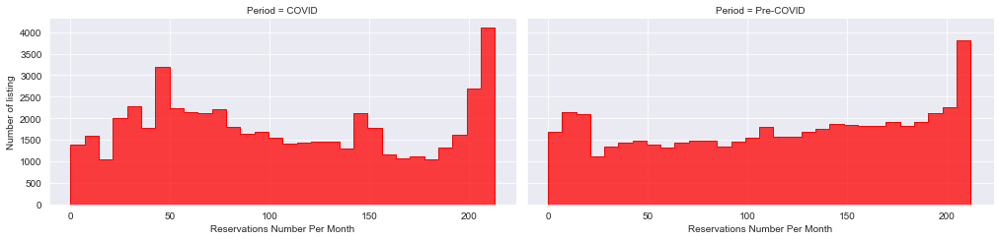

In [335]:
g = sns.FacetGrid(sdf_m_grp, col="Period", height=3.5, aspect=2)
g.map(sns.histplot, "Reserved_Count_mtotal",element='step',bins=30,color='red')
for ax in g.axes:
    g.set_xlabels('Reservations Number Per Month')
    g.set_ylabels('Number of listing')

plt.show()

g.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Histogram_Distribution')

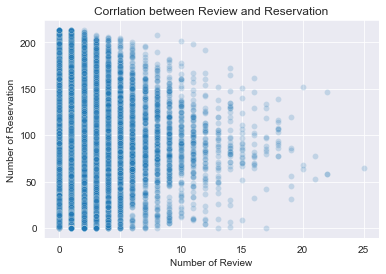

In [356]:
### Understand the correlation between Review and Reservation Number
fig, ax = plt.subplots()
sns.scatterplot(data=sdf_m_grp[sdf_m_grp['Period']=='COVID'], y='Reserved_Count_mtotal',x='Review_no_mtotal',ax=ax,alpha=0.2)
plt.title('Corrlation between Review and Reservation')
ax.set_xlabel('Number of Review')
ax.set_ylabel('Number of Reservation')
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Visiting Indicator')

##### Long Term Renting Analysis

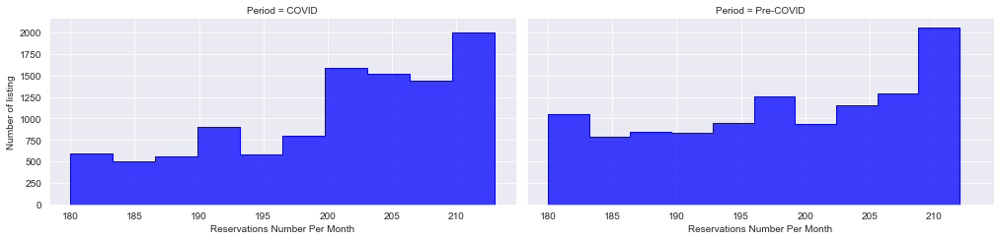

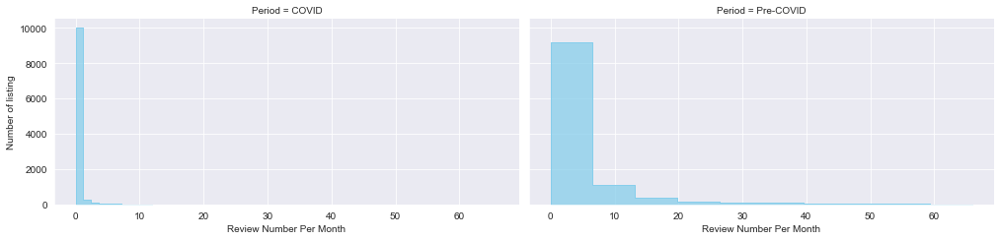

In [184]:
# Filter the long term rented listings, assumed >180 is long term rented listings (determined from the distribution)
sdf_m_grp_lt = sdf_m_grp[sdf_m_grp.Reserved_Count_mtotal>=180]

g = sns.FacetGrid(data=sdf_m_grp_lt, col="Period", height=3.5, aspect=2)
g.map(sns.histplot, "Reserved_Count_mtotal",element='step',color='blue',bins=10)
for ax in g.axes:
    g.set_xlabels('Reservations Number Per Month')
    g.set_ylabels('Number of listing')
    
h = sns.FacetGrid(data=sdf_m_grp_lt, col="Period", height=3.5, aspect=2)
h.map(sns.histplot, "Review_no_mtotal",element='step',color='skyblue',bins=10)
for ax in h.axes:
    h.set_xlabels('Review Number Per Month')
    h.set_ylabels('Number of listing')

In [185]:
# Compare the mean/ lambda of the two distributions

lt_covid = sdf_m_grp_lt[sdf_m_grp_lt['Period']=='COVID']
lt_pre = sdf_m_grp_lt[sdf_m_grp_lt['Period']=='Pre-COVID']

ltreservation_poisson_covid = poisson.rvs(mu=lt_covid.Reserved_Count_mtotal.mean(), size=lt_covid.shape[0])
ltreservation_poisson_pre = poisson.rvs(mu=lt_pre.Reserved_Count_mtotal.mean(), size=lt_pre.shape[0])

ltreview_poisson_covid = poisson.rvs(mu=lt_covid.Review_no_mtotal.mean(), size=lt_covid.shape[0])
ltreview_poisson_pre = poisson.rvs(mu=lt_pre.Review_no_mtotal.mean(), size=lt_pre.shape[0])


ks_reservation, ks_reservation_p = stats.ks_2samp(ltreservation_poisson_covid, ltreservation_poisson_pre)
ks_review, ks_review_p = stats.ks_2samp(ltreview_poisson_covid, ltreview_poisson_pre)

print('Long Term Renting')
print('P-value of Reservation poisson distributions is ' + str(ks_reservation_p) +', test statistics is ' + str(ks_reservation))
print('P-value of Review poisson distributions is ' + str(ks_review_p) +', test statistics is ' + str(ks_review))

Long Term Renting
P-value of Reservation poisson distributions is 1.9627074234045125e-30, test statistics is 0.07992239126368422
P-value of Review poisson distributions is 0.0, test statistics is 0.8764277068131443


##### Non-Long-Term renting analysis

Non-long term Renting
P-value of Reservation poisson distributions is 0.0, test statistics is 0.36372189045378595
P-value of Review poisson distributions is 0.0, test statistics is 0.7748086333051155


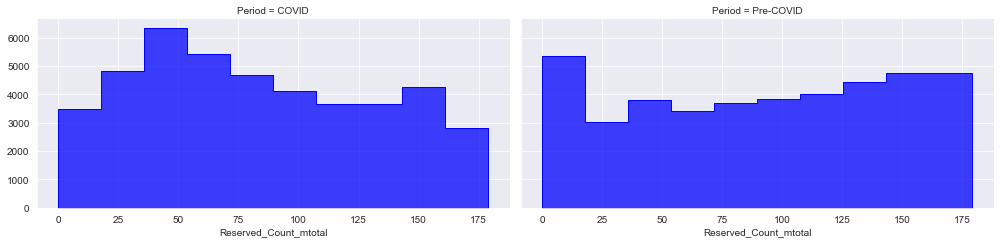

In [186]:
sdf_m_grp_st = sdf_m_grp[sdf_m_grp.Reserved_Count_mtotal<180]

g = sns.FacetGrid(data=sdf_m_grp_st, col="Period", height=3.5, aspect=2)
g.map(sns.histplot, "Reserved_Count_mtotal",element='step',color='blue',bins=10)

# Compare the mean/ lambda of the two distributions

st_covid = sdf_m_grp_st[sdf_m_grp_st['Period']=='COVID']
st_pre = sdf_m_grp_st[sdf_m_grp_st['Period']=='Pre-COVID']

streservation_poisson_covid = poisson.rvs(mu=st_covid.Reserved_Count_mtotal.mean(), size=st_covid.shape[0])
streservation_poisson_pre = poisson.rvs(mu=st_pre.Reserved_Count_mtotal.mean(), size=st_pre.shape[0])

streview_poisson_covid = poisson.rvs(mu=st_covid.Review_no_mtotal.mean(), size=st_covid.shape[0])
streview_poisson_pre = poisson.rvs(mu=st_pre.Review_no_mtotal.mean(), size=st_pre.shape[0])


ks_reservation, ks_reservation_p = stats.ks_2samp(streservation_poisson_covid, streservation_poisson_pre)
ks_review, ks_review_p = stats.ks_2samp(streview_poisson_covid, streview_poisson_pre)

print('Non-long term Renting')
print('P-value of Reservation poisson distributions is ' + str(ks_reservation_p) +', test statistics is ' + str(ks_reservation))
print('P-value of Review poisson distributions is ' + str(ks_review_p) +', test statistics is ' + str(ks_review))
plt.show()

#### Identify Listings that resist changes

In [188]:
# Proportion of Listings that remain >= 180 reservations in both periods
ltlisting_count = sdf_m_grp_lt.reset_index().astype({'id':'object'})
ltlisting_count= ltlisting_count.groupby('id')[['Reserved_Count_mtotal']].count()
anti_listing = ltlisting_count[ltlisting_count.Reserved_Count_mtotal==2]
Proportion_COVID = anti_listing.shape[0]/ lt_covid.shape[0]

print('Amongst the long-term-rented listings during COVID Period, ' + str(round(Proportion_COVID*100,1)) + '% are resistent to change in COVID period')

Amongst the long-term-rented listings during COVID Period, 47.1% are resistent to change in COVID period


##### Summary on the Length of Rentings/ Reservation Number
KS Test indicated that there is no difference between the reservation distribution of the long-term-rented listings (where > 180 days are occupied in the 7-month period) in COVID and pre-COVID period. Constrastly, there are significant difference between the non-long-term listings distributions of the two periods. This may indicate there are certain groups of listings who are anti-market-trend in the COVID (whereas 47% of them have also been long-rented in 2019). A large proportion of listings, compared with the same period last year, have fewer reservations in the COVID Period (distribution shift to left). 

More insights are given by the significant test result among the Number of Reviews among long-term-rented listings, whereas test results shows they are significantly different at alpha = 0.01. As observed, COVID distribution is more left-skewed than pre-COVID distribution. This suggest the possibilities that same customers remained in the same listings, assumed the response rate of each listing is constant. However, current data do not support further analysis. 

Based on the above results, it is suggested to seperate these two types of listings in further analysis in the COVID dataset. In this sense, the reservation distribution in COVID are more likely to be normally distributed.


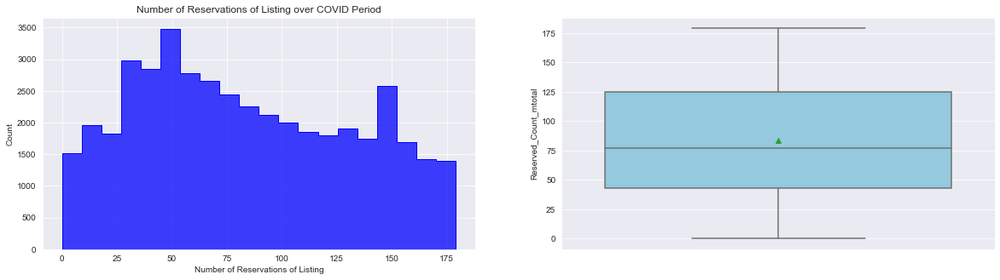

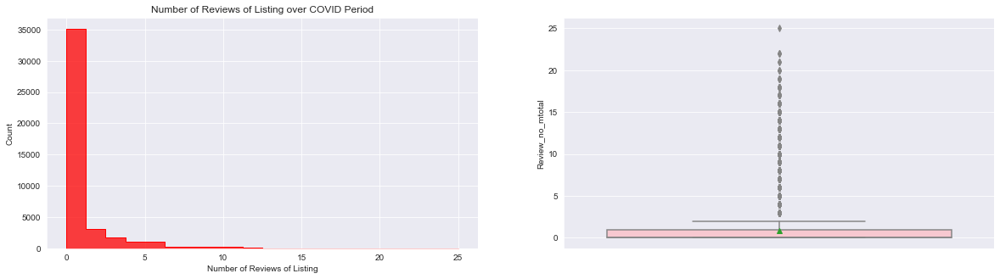

In [189]:
# Plot Non-long-term-rented Listing Distribution
fig, (ax1,ax2) =  plt.subplots(ncols=2,figsize=(20,5))
sns.histplot(data=st_covid,x='Reserved_Count_mtotal',element='step',ax=ax1,bins=20,color='blue')
ax1.set_xlabel('Number of Reservations of Listing')
ax1.set_title('Number of Reservations of Listing over COVID Period')
sns.boxplot(data=st_covid,y='Reserved_Count_mtotal',ax=ax2,color='skyblue',showmeans=True)
plt.show()

fig, (ax3,ax4) =  plt.subplots(ncols=2,figsize=(20,5))
sns.histplot(data=st_covid,x='Review_no_mtotal',element='step',ax=ax3,bins=20,color='red')
ax3.set_xlabel('Number of Reviews of Listing')
ax3.set_title('Number of Reviews of Listing over COVID Period')
sns.boxplot(data=st_covid,y='Review_no_mtotal',ax=ax4,color='pink',showmeans=True)
plt.show()

### 3.3) Correlation of COVID cases and Visiting Frequency

Session 3.2 suggested that the visiting frequency of AirBnB, especially in terms of number of reservations, reduced significantly, while there is a group of listings (>180 days of occupancy in 7 months) who are resistant to the market shift and form another distribution. This session will analyze the relationship between visiting Frequency of listings which are prone to market change and number of COVID cases. 

In [190]:
st_id = list(st_covid.reset_index().id.unique()) # listing id of non-long term rented listing
lt_id = list(lt_covid.reset_index().id.unique()) # listing id of long term rented listing

In [191]:
# reservation of the non-long-term rented listings across the years 
 # Per month
st_reservation_id=calendar2[calendar2.listing_id.isin(st_id)].merge(id_neighbor_map[['id','neighbourhood_cleansed']],left_on='listing_id',right_on='id')
st_reservation = st_reservation_id.groupby('date')[['Reserved_Count']].sum().reset_index()
# Per month per borough
st_reservation_borough = st_reservation_id.groupby(['date','neighbourhood_cleansed'])[['Reserved_Count']].sum().reset_index()

# Reviews of the non-long-term rented listings per month
st_review = review_m2[review_m2.listing_id.isin(st_id)].reset_index().groupby('date')[['Review_no']].sum().reset_index()

# reservation of the long-term rented listings across the years 
 # Per month
lt_reservation_id=calendar2[calendar2.listing_id.isin(lt_id)].merge(id_neighbor_map[['id','neighbourhood_cleansed']],left_on='listing_id',right_on='id')
lt_reservation = lt_reservation_id.groupby('date')[['Reserved_Count']].sum().reset_index()
lt_reservation_borough = lt_reservation_id.groupby(['date','neighbourhood_cleansed'])[['Reserved_Count']].sum().reset_index()

# Reviews of the non-long-term rented listings per month
lt_review = review_m2[review_m2.listing_id.isin(lt_id)].reset_index().groupby('date')[['Review_no']].sum().reset_index()

In [192]:
# Monthly number over COVID period Per listing
st_covid_date = sdf_m_covid[sdf_m_covid.id.isin(st_id)].rename(columns={'new_cases_mtotal':'total_borough_new','total_cases_mavg':'avg_borough_total'})
st_covid_date = st_covid_date.drop(columns='Review_no_mtotal_log').sort_values(by=['id','date'],ascending=True)

lt_covid_date = sdf_m_covid[sdf_m_covid.id.isin(lt_id)].rename(columns={'new_cases_mtotal':'total_borough_new','total_cases_mavg':'avg_borough_total'})
lt_covid_date = lt_covid_date.drop(columns='Review_no_mtotal_log').sort_values(by=['id','date'],ascending=True)

#### Correlation by Month

In [193]:
# Monthly number over COVID (Overall) - Non-Long-Term Rented Listings
cases_date_sum = case_sum.resample('M',on='date').agg({'new_cases':'sum','total_cases':'mean'}).reset_index().rename(columns={'new_cases':'new_cases_total','total_cases':'total_cases_avg'})

mindate=cases_date_sum.date.min()
covid_date_airBnB = cases_date_sum.merge(st_reservation,on='date',how='left').merge(st_review,on='date',how='left')
covid_date_airBnB_lt = cases_date_sum.merge(lt_reservation,on='date',how='left').merge(lt_review,on='date',how='left')

# assign next month reservation to one month earlier 
for i in np.arange(0,covid_date_airBnB.shape[0]-1):
    covid_date_airBnB.loc[i,'Next_Month_Reservation'] = covid_date_airBnB.loc[i+1,'Reserved_Count']

for i in np.arange(0,covid_date_airBnB_lt.shape[0]-1):
    covid_date_airBnB_lt.loc[i,'Next_Month_Reservation'] = covid_date_airBnB_lt.loc[i+1,'Reserved_Count']
covid_date_airBnB.Next_Month_Reservation =covid_date_airBnB.Next_Month_Reservation.fillna(st_reservation[st_reservation.date =='2020-10-31'].Reserved_Count.item())
covid_date_airBnB_lt.Next_Month_Reservation =covid_date_airBnB_lt.Next_Month_Reservation.fillna(lt_reservation[lt_reservation.date =='2020-10-31'].Reserved_Count.item())

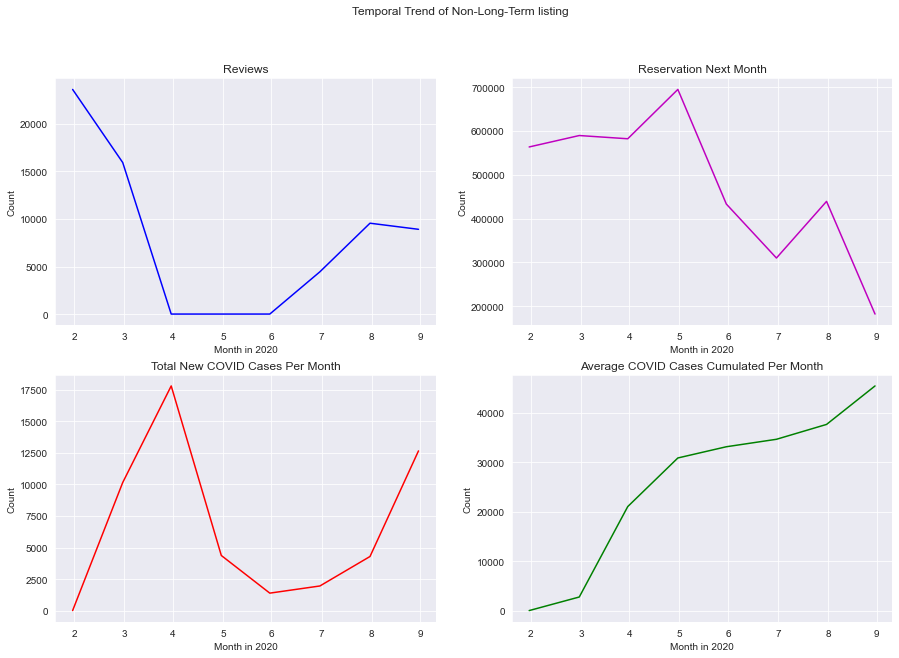

In [194]:
fig, (ax,ax1) = plt.subplots(ncols=2,nrows=2,figsize=(15,10))
sns.lineplot(data = covid_date_airBnB,x='date',y='Review_no',ax=ax[0],color='b')
sns.lineplot(data = covid_date_airBnB,x='date',y='Next_Month_Reservation',ax=ax[1],color='m')
sns.lineplot(data = covid_date_airBnB,x='date',y='new_cases_total',ax=ax1[0],color='r')
sns.lineplot(data = covid_date_airBnB,x='date',y='total_cases_avg',ax=ax1[1],color='g')

for i in [0,1]:
    ax[i].set_xticklabels(covid_date_airBnB.date.dt.month)
    ax[i].set_xlabel('Month in 2020')
    ax[i].set_ylabel('Count')
    ax1[i].set_xticklabels(covid_date_airBnB.date.dt.month)
    ax1[i].set_xlabel('Month in 2020')
    ax1[i].set_ylabel('Count')

ax[0].set_title('Reviews')
ax[1].set_title('Reservation Next Month')
ax1[0].set_title('Total New COVID Cases Per Month')
ax1[1].set_title('Average COVID Cases Cumulated Per Month')
fig.suptitle('Temporal Trend of Non-Long-Term listing')
plt.show()

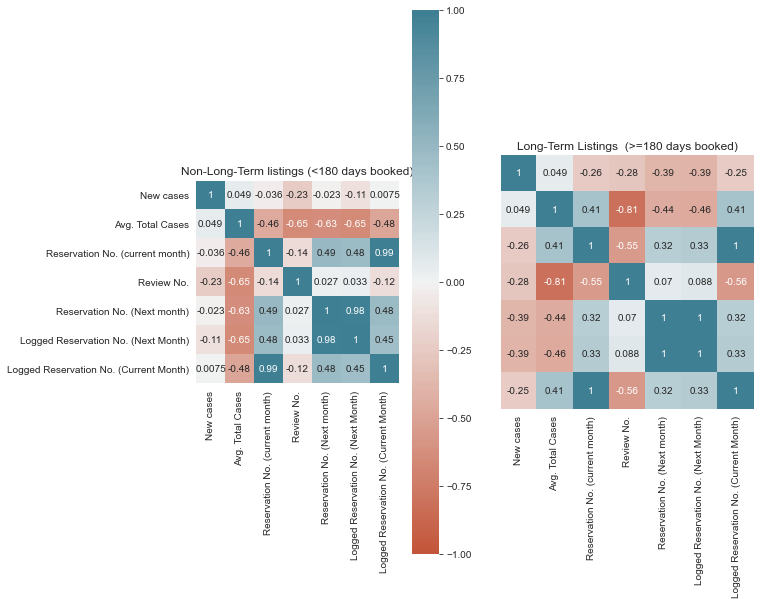

In [195]:
# Correlation Matrix - Non-Long-Term Rented Listings
covid_date_airBnB['Next_Month_Reservation_trans'] = covid_date_airBnB['Next_Month_Reservation'].apply(np.log)
covid_date_airBnB['Reserved_Count_trans'] = covid_date_airBnB['Reserved_Count'].apply(np.log)

covid_date_airBnB_lt['Next_Month_Reservation_trans'] = covid_date_airBnB_lt['Next_Month_Reservation'].apply(np.log)
covid_date_airBnB_lt['Reserved_Count_trans'] = covid_date_airBnB_lt['Reserved_Count'].apply(np.log)

fig,(ax,ax1) = plt.subplots(ncols=2,figsize=(10,10))
corr_all = covid_date_airBnB.corr()
corr_all_lt = covid_date_airBnB_lt.corr()
sns.heatmap(
    corr_all, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True,
    ax=ax,
    #cbar_kws = {'orientation':'horizontal'},
    xticklabels=['New cases','Avg. Total Cases','Reservation No. (current month)','Review No.','Reservation No. (Next month)','Logged Reservation No. (Next Month)','Logged Reservation No. (Current Month)'],
    yticklabels=['New cases','Avg. Total Cases','Reservation No. (current month)','Review No.','Reservation No. (Next month)','Logged Reservation No. (Next Month)','Logged Reservation No. (Current Month)']
)

# Correlation Matrix (Overall) - Long-Term Rented Listings

sns.heatmap(
    corr_all_lt, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True,
    ax=ax1,
    xticklabels=['New cases','Avg. Total Cases','Reservation No. (current month)','Review No.','Reservation No. (Next month)','Logged Reservation No. (Next Month)','Logged Reservation No. (Current Month)'],
    yticklabels=False,
    cbar=False
)

ax.set_title('Non-Long-Term listings (<180 days booked)')
ax1.set_title('Long-Term Listings  (>=180 days booked)')
plt.show()

Correlation Matrix suggest key variables that are correlated with the visiting frequency indicators. They are futher examined below:

Pearson's correlation (total cases vs. Reservation (next month)) is -0.6486455269905657 with a p-value of 0.08186991964785566
Pearson's correlation (total cases vs. Reservation (current month)) is -0.45776509993887704 with a p-value of 0.2540578455476946
Pearson's correlation (total cases vs. Review) is -0.6490230829391059 with a p-value of 0.08163258519162102


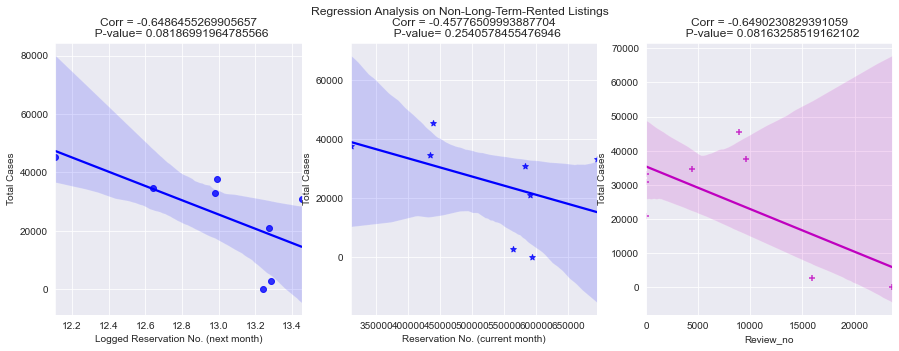

Pearson's correlation (new cases vs. Reservation (next month)) is -0.10952288945489624 with a p-value of 0.7962808675765736


In [372]:
# Regression analysis on Non-Long term listings

# Plot regression graph
fig, (ax,ax1,ax2) = plt.subplots(ncols=3,figsize=(15,5))
sns.regplot(data=covid_date_airBnB, x="Next_Month_Reservation_trans", y="total_cases_avg", ax=ax,fit_reg=True,color='b')
sns.regplot(data=covid_date_airBnB, x="Reserved_Count", y="total_cases_avg", ax=ax1,fit_reg=True,marker="*",color='b')
sns.regplot(data=covid_date_airBnB, x="Review_no", y="total_cases_avg", ax=ax2,fit_reg=True,marker="+",color='m')
# Calculate P-value
corrPearson, pValPearson = stats.pearsonr(covid_date_airBnB.Next_Month_Reservation_trans,covid_date_airBnB.total_cases_avg)
print ("Pearson's correlation (total cases vs. Reservation (next month)) is", corrPearson, "with a p-value of",pValPearson)
ax.set_ylabel('Total Cases')
ax.set_title('Corr = ' + str(corrPearson) + '\n  P-value= '+str(pValPearson))
ax1.set_ylabel('Total Cases')
corrPearson, pValPearson = stats.pearsonr(covid_date_airBnB.Reserved_Count,covid_date_airBnB.total_cases_avg)
print ("Pearson's correlation (total cases vs. Reservation (current month)) is", corrPearson, "with a p-value of",pValPearson)
ax1.set_title('Corr = ' + str(corrPearson) + '\n  P-value= '+str(pValPearson))
ax2.set_ylabel('Total Cases')
corrPearson, pValPearson = stats.pearsonr(covid_date_airBnB.Review_no,covid_date_airBnB.total_cases_avg)
print ("Pearson's correlation (total cases vs. Review) is", corrPearson, "with a p-value of",pValPearson)
ax2.set_title('Corr = ' + str(corrPearson) + '\n  P-value= '+str(pValPearson))
ax.set_xlabel('Logged Reservation No. (next month)')
ax1.set_xlabel('Reservation No. (current month)')
ax1.set_xlabel('Reservation No. (current month)')

fig.suptitle('Regression Analysis on Non-Long-Term-Rented Listings')
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/ST Correlation')

corrPearson, pValPearson = stats.pearsonr(covid_date_airBnB.Next_Month_Reservation_trans,covid_date_airBnB.new_cases_total)
print ("Pearson's correlation (new cases vs. Reservation (next month)) is", corrPearson, "with a p-value of",pValPearson)

Pearson's correlation (total cases vs. Review No.) is -0.8147857604002655 with a p-value of 0.013759379163530172


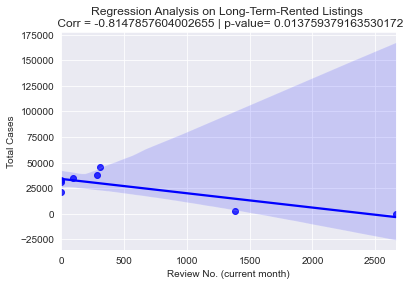

In [373]:
# p-value
corrPearson, pValPearson = stats.pearsonr(covid_date_airBnB_lt.Review_no,covid_date_airBnB_lt.total_cases_avg)
print ("Pearson's correlation (total cases vs. Review No.) is", corrPearson, "with a p-value of",pValPearson)

# Regression analysis on Long term listings
sns.regplot(data=covid_date_airBnB_lt, x="Review_no", y="total_cases_avg",fit_reg=True,color='b')
plt.ylabel('Total Cases')
plt.title('Regression Analysis on Long-Term-Rented Listings \n Corr = ' +str(corrPearson) + ' | p-value= '+str(pValPearson) )
plt.xlabel('Review No. (current month)')
plt.show()



#### Summary

##### Non-Long-term listings
Correlation analysis suggests that the average cumulative COVID cases per month has negative relationship with both visiting frequency indicators, including logged reservation number (next month) and the number of review (current month). In particular, the correlation between reservation number (next month) and total cases is higher than reservation number (current month). This may provide insight that the total cases announced is informing the decision making of making reservation in AirBnB.

P-value is calculated for validating the result. Due to the small sample size (n=8), the p-values fail to meet the standard 95% or 99% threshold. However, the p-value of the two indicators are both 0.082. This suggest there are only 8% chances that the correlation is generated randomly by chance and there is no association between the mentioned variables. Further regression should be performed as time passes and more data are available for analysis. Moreover, considering the confidence interval (the shade region), there are chances that review number is positively associated with the total cases. 

Another insight is the number of new cases reported per month is not associated with any visiting frequency indictors. However, the p-value is high as 0.79 and the correlation is weak. More analysis could be done with more data.

##### Long Term rented listings
Align with previous findings, there are no strong relationship between the reservation number and number of COVID cases. Yet a significant negative association is found between the review number and total cases, with a correlation o 0.82 and p-value as 0.01. This suggest within the long renting groups, number of review varied with the number of cases. As number of review provide insight for number of customers, this could further empower the findings in session 3.1.

### 3.4) Spatial Pattern

In [198]:
import geopandas as gpd
import altair as alt

In [199]:
print(sdf_m_covid.head())

      id       date       Price  Reserved_Count_mtotal  Review_no_mtotal  \
0  11551 2020-03-31  112.727273                    0.0               2.0   
1  11551 2020-04-30  112.727273                    0.0               0.0   
2  11551 2020-05-31  112.727273                    0.0               0.0   
3  11551 2020-06-30   90.000000                   15.0               0.0   
4  11551 2020-07-31   85.789474                   19.0               0.0   

   Review_no_mtotal_log  borough   geo_code  new_cases_mtotal  \
0              1.098612  Lambeth  E09000022             552.0   
1              0.000000  Lambeth  E09000022             655.0   
2              0.000000  Lambeth  E09000022             116.0   
3              0.000000  Lambeth  E09000022              27.0   
4              0.000000  Lambeth  E09000022              71.0   

   total_cases_mavg                                           geometry  
0        157.322581  POLYGON ((530046.800 177893.400, 530048.400 17...  
1     

#### Spatial Distribution of Visiting Frequency in Pre-COVID and COVID Period

In [200]:
# Distribution by Borough (with details in listing)
borough_covid_id=sdf_m_covid.groupby(['id','borough','geo_code'])[['Reserved_Count_mtotal','Review_no_mtotal','Price']].agg({'Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','Price':'mean'}).reset_index()
borough_covid_id['Period'] = 'COVID'
borough_pre_id=sdf_m_pre.groupby(['id','borough','geo_code'])[['Reserved_Count_mtotal','Review_no_mtotal','Price']].agg({'Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','Price':'mean'}).reset_index()
borough_pre_id['Period'] = 'Pre-COVID'
# Concat and add spatial data (geoemtry data cannot be aggregated before)
borough_id_spatial = pd.concat([borough_covid_id,borough_pre_id]).merge(oa[['GSS_CODE','geometry']],left_on='geo_code',right_on='GSS_CODE',how='left').drop(columns=['GSS_CODE'])

# Distribution by Borough (summarized all listings)
borough_covid=sdf_m_covid.groupby(['borough','geo_code'])[['Reserved_Count_mtotal','Review_no_mtotal','Price','id']].agg({'id':'count','Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','Price':'mean'}).reset_index().sort_values(by='borough',ascending=True)
borough_covid['Period'] = 'COVID'
borough_pre=sdf_m_pre.groupby(['borough','geo_code'])[['Reserved_Count_mtotal','Review_no_mtotal','Price','id']].agg({'id':'count','Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','Price':'mean'}).reset_index().sort_values(by='borough',ascending=True)
borough_pre['Period'] = 'Pre-COVID'

# Concat and add spatial data (geoemtry data cannot be aggregated before)
borough_spatial = pd.concat([borough_covid,borough_pre]).merge(oa[['GSS_CODE','geometry']],left_on='geo_code',right_on='GSS_CODE',how='left').drop(columns=['GSS_CODE']).rename(columns={'id':'Listing_no'})

# Since number of listings in each borough and in each period is different, normalize to average number of indicator per listing in each borough
borough_spatial['Reserved_per_listing'] = np.divide(borough_spatial['Reserved_Count_mtotal'],borough_spatial['Listing_no'])
borough_spatial['Review_per_listing'] = np.divide(borough_spatial['Review_no_mtotal'],borough_spatial['Listing_no'])

# Calculate the percentage change of Reservation_per_list & Review_per_listing across two periods
borough_spatial.loc[borough_spatial.Period == 'COVID','Reserve_pctc'] = np.divide(borough_spatial.loc[borough_spatial.Period == 'COVID','Reserved_per_listing'].values,borough_spatial.loc[borough_spatial.Period == 'Pre-COVID','Reserved_per_listing'].values)-1
borough_spatial.loc[borough_spatial.Period == 'COVID','Review_pctc'] = np.divide(borough_spatial.loc[borough_spatial.Period == 'COVID','Review_per_listing'].values,borough_spatial.loc[borough_spatial.Period == 'Pre-COVID','Review_per_listing'].values)-1

# Calculate the overall percentage change of each visiting frequency indicators
covid_Reserve_per = borough_covid.Reserved_Count_mtotal.sum()/borough_spatial.loc[borough_spatial.Period == 'COVID','Listing_no'].sum()
pre_Reserve_per = borough_pre.Reserved_Count_mtotal.sum()/borough_spatial.loc[borough_spatial.Period == 'Pre-COVID','Listing_no'].sum()
Reservation_pct = (covid_Reserve_per/pre_Reserve_per)-1

covid_Review_per = borough_covid.Review_no_mtotal.sum()/borough_spatial.loc[borough_spatial.Period == 'COVID','Listing_no'].sum()
pre_Review_per = borough_pre.Review_no_mtotal.sum()/borough_spatial.loc[borough_spatial.Period == 'Pre-COVID','Listing_no'].sum()
Review_pct = (covid_Review_per/pre_Review_per)-1

In [201]:
borough_spatial = gpd.GeoDataFrame(borough_spatial, crs="epsg:27700").rename(columns={'Reserved_Count_mtotal':'Reservation_No','Review_no_mtotal':'Review_No'})
borough_id_spatial = gpd.GeoDataFrame(borough_id_spatial, crs="epsg:27700").rename(columns={'Reserved_Count_mtotal':'Reservation_No','Review_no_mtotal':'Review_No'})
print(borough_spatial.head())

                borough   geo_code  Listing_no  Reservation_No  Review_No  \
0  Barking and Dagenham  E09000002        1374         23011.0      176.0   
1                Barnet  E09000003        6029         99048.0      713.0   
2                Bexley  E09000004         873         13377.0      133.0   
3                 Brent  E09000005       10170        177456.0     1097.0   
4               Bromley  E09000006        2613         45716.0      397.0   

       Price Period                                           geometry  \
0  49.123268  COVID  MULTIPOLYGON (((543905.400 183199.100, 543905....   
1  75.910428  COVID  POLYGON ((524579.900 198355.200, 524594.300 19...   
2  61.078761  COVID  POLYGON ((547226.200 181299.300, 547320.900 18...   
3  83.380374  COVID  POLYGON ((525201.000 182512.600, 525181.500 18...   
4  65.415028  COVID  POLYGON ((540373.600 157530.400, 540361.200 15...   

   Reserved_per_listing  Review_per_listing  Reserve_pctc  Review_pctc  
0             16.74

In [202]:
data_geo_borough = alt.InlineData(values = borough_spatial.to_json(), 
                       format = alt.DataFormat(property='features',type='json'))

covid_geo_borough = alt.InlineData(values = borough_spatial[borough_spatial['Period'] == 'COVID'].to_json(),                                                                                                     
                       format = alt.DataFormat(property='features',type='json'))

pre_geo_borough = alt.InlineData(values = borough_spatial[borough_spatial['Period'] == 'Pre-COVID'].to_json(),                                                                                                     
                       format = alt.DataFormat(property='features',type='json'))

In [392]:
# COVID frequency of indicators
alt.Chart(covid_geo_borough, title="COVID").mark_geoshape(strokeWidth=1,stroke='lightgray',strokeOpacity=0.2
).encode(
    color=alt.Color(alt.repeat('row'), type='quantitative', scale=alt.Scale(scheme='bluepurple'))
    , tooltip=['properties.borough:N',alt.Tooltip(alt.repeat("row"), type="quantitative")]
).properties(
    projection={'type': 'identity','reflectY': True},
    width=400,
    height=300
).repeat(
    row=['properties.Reservation_No','properties.Review_No','properties.Listing_no']
).resolve_scale(
    color='independent'
)

alt.RepeatChart(...)

In [391]:
# Pre-COVID frequency of indicators

alt.Chart(pre_geo_borough, title="Pre-COVID").mark_geoshape(strokeWidth=1,stroke='lightgray',strokeOpacity=0.2
).encode(
    color=alt.Color(alt.repeat('row'), type='quantitative', scale=alt.Scale(scheme='bluepurple'))
    , tooltip=['properties.borough:N',alt.Tooltip(alt.repeat("row"), type="quantitative")]
).properties(
    projection={'type': 'identity','reflectY': True},
    width=400,
    height=300
).repeat(
    row=['properties.Reservation_No','properties.Review_No','properties.Listing_no']
).resolve_scale(
    color='independent'
)

alt.RepeatChart(...)

There is no obvious change in reservation number and review number by borough when simply comparing their magnitude, except an overall reduction in number. However, the number of listings in each borough are different and influence on the analysis. As observed in the right most chart, the distribution of active listings differentiates by borough. Therefore, further analysis should be performed regarding the average number of indicators per listing in each borough.

In [390]:
alt.Chart(covid_geo_borough, title="COVID").mark_geoshape(strokeWidth=1,stroke='lightgray',strokeOpacity=0.2
).encode(
    color=alt.Color(alt.repeat('row'), type='quantitative', scale=alt.Scale(scheme='bluepurple'))
    , tooltip=['properties.borough:N',alt.Tooltip(alt.repeat("row"), type="quantitative")]
).properties(
    projection={'type': 'identity','reflectY': True},
    width=400,
    height=300
).repeat(
    row=['properties.Reserved_per_listing','properties.Review_per_listing']
).resolve_scale(
    color='independent'
)

alt.RepeatChart(...)

In [389]:
 alt.Chart(pre_geo_borough).mark_geoshape(strokeWidth=1,stroke='lightgrey',strokeOpacity=0.2
).encode(
     color=alt.Color(alt.repeat('row'), type='quantitative', scale=alt.Scale(scheme='bluepurple')),
     tooltip=['properties.borough:N',alt.Tooltip(alt.repeat("row"), type="quantitative")]
).properties(
    projection={'type': 'identity','reflectY': True},
      width=400,
    height=300,
    title=alt.TitleParams('Pre-COVID')
).repeat(
    row=['properties.Reserved_per_listing','properties.Review_per_listing','properties.Listing_no'],
).resolve_scale(
    color='independent'
)


alt.RepeatChart(...)

#### Short Summary
- Reservation Per Listing/ Average reservation based on active listings in each study period : We can see that in Pre-COVID period, borough with higher average is mostly centralized in borough surrounding city center (i.e. city of London, Westminister), such as Southwark, Islington, Lambeth and Hackney. However, in COVID period, the **average 'spread' to borough in outer circle** such as Sutton, Bromley. More color intensity/variations are found in COVID period, which suggest the average reservation spreads to other borough. The average number in City of London is almost the lowerest amongst all. Besides, only Lewisham and Hackney remain as most popular borough to make reservations.

- Review Per Listing/ Average review based on active listings in each study period: Review are mostly concentrated in an outer borough, Hillingdon in pre-COVID period. Yet in COVID period, though it remains highest, more variations are observed in Hounslow, Richmond and Sutton. Interestingly, the number is very high in City of London, despite its low reservation on average. This may suggest **shorter length of stay in city center** than other boroughes.

In order to better understand the spatial change in visiting frequency, the percentage change of each borough, and how this percenage change differs from other borough is analyzed as below:

In [378]:
alt.Chart(covid_geo_borough, title="% Change of Average Reservation from Pre-COVID").mark_geoshape(strokeWidth=1,stroke='lightgray',strokeOpacity=0.2
).encode(
    color=alt.Color('properties.Reserve_pctc:Q', scale=alt.Scale(scheme='yellowgreenblue',domain=[-0.2,0.2]),title='')
    , tooltip=alt.Tooltip(['properties.borough:N','properties.Review_per_listing:Q','properties.Reserve_pctc:Q'])
).properties(
    projection={'type': 'identity','reflectY': True},
    width=400,
    height=300
)

alt.Chart(...)

In [208]:
alt.Chart(covid_geo_borough, title="% Change of Average Review from Pre-COVID").mark_geoshape(strokeWidth=1,stroke='lightgray',strokeOpacity=0.2
).encode(
    color=alt.Color('properties.Review_pctc:Q', scale=alt.Scale(scheme='yelloworangebrown'),title='',sort='descending')
    , tooltip=alt.Tooltip(['properties.borough:N','properties.Reserved_Count_mtotal:Q','properties.Review_per_listing:Q','properties.Review_pctc:Q'])
).properties(
    projection={'type': 'identity','reflectY': True},
    width=400,
    height=300
)

alt.Chart(...)

#### Short Summary

The chart (Percentage Change in Reservation Number) clearly indicates that borough at outer circle of London show improvement in average number of reservations, where positive percentage change are observed, particularly Havering, Bromley, Sutton and Hillingdon. In contrast, borough in city center such as City of London, Westminister and Kensington recorded negative percentage change. Besides, it is worth noticing that borough surrounding the popular borough before COVID are quite resistant on the change, i.e. very low percentage changes are observed, such as Lewisham, Greenwich, etc.

As analyzed from previous sessions, the biomodal distributions suggested seperating listings into long-term-rented listings in COVID (as groups with anti-market trend ability) and the opposite groups. With regards to the spatial pattern summarized from this session, correlation analysis is performed among two listing groups. 


#### Long-Term-Rented Listing and Non-Long-Term-Rented Listing in COVID Period

In [209]:
borough_covid_id['listingGrp']=0
borough_covid_id.loc[borough_covid_id.id.isin(lt_id),'listingGrp'] =1
borough_covid_id2 = borough_covid_id.groupby(['listingGrp','borough','geo_code'])[['Reserved_Count_mtotal','Review_no_mtotal','id']].agg({'Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','id':'count'}).reset_index()

borough_covid_id2=borough_covid_id2.merge(oa[['GSS_CODE','geometry']],left_on='geo_code',right_on='GSS_CODE',how='left').drop(columns=['GSS_CODE']).rename(columns={'id':'Listing_no'})

# Since number of listings in each borough and in each period is different, normalize to average number of indicator per listing in each borough
borough_covid_id2['Reserved_per_listing'] = np.divide(borough_covid_id2['Reserved_Count_mtotal'],borough_covid_id2['Listing_no'])
borough_covid_id2['Review_per_listing'] = np.divide(borough_covid_id2['Review_no_mtotal'],borough_covid_id2['Listing_no'])

In [210]:
# Normalize for comparison between two listing groups (divide by total number of listing in listing group)
num = borough_covid_id.listingGrp.value_counts()

for i in [0,1]:
    borough_covid_id2.loc[borough_covid_id2.listingGrp==i,'Reserved_norm'] = np.divide(borough_covid_id2['Reserved_Count_mtotal'],num[i])
    borough_covid_id2.loc[borough_covid_id2.listingGrp==i,'Review_norm'] = np.divide(borough_covid_id2['Review_no_mtotal'],num[i])

In [211]:
# Create geo and alt use DataFrame
borough_covid_id2 = gpd.GeoDataFrame(borough_covid_id2, crs="epsg:27700")
data_geo_borough_lst = alt.InlineData(values = borough_covid_id.to_json(), 
                       format = alt.DataFormat(property='features',type='json'))
borough_covid_id2.head()

,listingGrp,borough,geo_code,Reserved_Count_mtotal,Review_no_mtotal,Listing_no,geometry,Reserved_per_listing,Review_per_listing,Reserved_norm,Review_norm
0,0,Barking and Dagenham,E09000002,15073.0,167.0,186,"MULTIPOLYGON (((543905.400 183199.100, 543905....",81.037634,0.897849,0.348605,0.003862
1,0,Barnet,E09000003,67115.0,687.0,811,"POLYGON ((524579.900 198355.200, 524594.300 19...",82.755857,0.847102,1.552223,0.015889
2,0,Bexley,E09000004,10180.0,131.0,125,"POLYGON ((547226.200 181299.300, 547320.900 18...",81.440000,1.048000,0.235441,0.003030
3,0,Brent,E09000005,117872.0,1059.0,1379,"POLYGON ((525201.000 182512.600, 525181.500 18...",85.476432,0.767948,2.726121,0.024492
4,0,Bromley,E09000006,31260.0,385.0,345,"POLYGON ((540373.600 157530.400, 540361.200 15...",90.608696,1.115942,0.722975,0.008904


In [212]:
# Map the difference between reservation of long and non-long rented listing groups
listingGrpname=['Non-Long-Term-Rented Grp','Long-Term-Rented Grp']

alt.concat(*(
    alt.Chart(alt.InlineData(values = borough_covid_id2[borough_covid_id2.listingGrp ==type].to_json(), 
                       format = alt.DataFormat(property='features',type='json')),title=listingGrpname[type] + ' Reservation (normalized by listing no.)').mark_geoshape(strokeWidth=1,stroke='lightgray',strokeOpacity=0.2).encode(
      color=alt.Color('properties.Reserved_norm:Q', scale=alt.Scale(scheme='yellowgreenblue'),title='')
      ,tooltip=alt.Tooltip(['properties.borough:N','properties.Reserved_norm:Q'])
    ).properties(
    projection={'type': 'identity','reflectY': True},
    width=400,
    height=300
    )
    for type in range(2)
  )
)

# Source Code from https://github.com/altair-viz/altair/issues/2369

alt.ConcatChart(...)

In [213]:
listingGrpname=['Non-Long-Term-Rented Grp','Long-Term-Rented Grp']

alt.concat(*(
    alt.Chart(alt.InlineData(values = borough_covid_id2[borough_covid_id2.listingGrp ==type].to_json(), 
                       format = alt.DataFormat(property='features',type='json')),title=listingGrpname[type] + ' Review (normalized by listing no.)').mark_geoshape(strokeWidth=1,stroke='lightgray',strokeOpacity=0.2).encode(
      color=alt.Color('properties.Reserved_norm:Q', scale=alt.Scale(scheme='yellowgreenblue'),title='')
      ,tooltip=alt.Tooltip(['properties.borough:N','properties.Review_no_mtotal:Q','properties.Reserved_norm:Q'])
    ).properties(
    projection={'type': 'identity','reflectY': True},
    width=400,
    height=300
    )
    for type in range(2)
  )
)

# Source Code from https://github.com/altair-viz/altair/issues/2369

alt.ConcatChart(...)

#### Short Summary

Four maps that compare the review and reservation number between the two listing groups are to observe the difference in spatial pattern in borough level, where the figures had been normalized by the number of listings in each group in COVID period. Unfortunately, little variations are found amongst them. Both groups demonstrate concentration of visiting frequency in borough surrounding City of London, yet there is no obvious difference between city center vs. borough around center vs. Outer circle of London. A few borough such as Hackney and Tower Hamlet, may show difference in weighting among Long term groups than the non-long term groups (which weights more in Westminister).

#### Correlation Analysis on COVID cases and Visiting Frequency at Borough Level

In [214]:
# Monthly number over COVID period Per Borough (Non-Long Term Rented Listings)
lastdate= st_covid_date.date.max()
st_covid_date_borough = st_covid_date.groupby(['borough','date','geo_code'])[['Reserved_Count_mtotal','Review_no_mtotal','Price','id']].agg({'Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','Price':'mean','id':'count'}).reset_index()
st_covid_date_borough = st_covid_date_borough.merge(oa[['GSS_CODE','geometry']],left_on='geo_code',right_on='GSS_CODE',how='left').merge(case_neighborhood_m,on=['geo_code','date'],how='left').drop(columns=['GSS_CODE','geo_code','Neighborhood'])
st_covid_date_borough.rename(columns={'id':'No_Listing','new_cases':'new_cases_total','total_cases':'total_cases_mavg'},inplace=True)
st_covid_date_borough.sort_values(by=['borough','date'],ascending=True,inplace=True)

last_m = st_reservation_borough.date.max()
# Fill in next month reservation number as next-month reservation are made as of previous month 
for i in np.arange(0,st_covid_date_borough.shape[0]):
    if st_covid_date_borough.loc[i,'date'] < lastdate:
        st_covid_date_borough.loc[i,'Next_Month_Reservation'] = st_covid_date_borough.loc[i+1,'Reserved_Count_mtotal']

st_covid_date_borough = st_covid_date_borough.merge(st_reservation_borough[st_reservation_borough.date== last_m],left_on='borough',right_on='neighbourhood_cleansed',how='left')
st_covid_date_borough.Next_Month_Reservation = st_covid_date_borough.Next_Month_Reservation.fillna(value=st_covid_date_borough.Reserved_Count)
st_covid_date_borough.drop(columns=['date_y','neighbourhood_cleansed','Reserved_Count'],inplace=True)
st_covid_date_borough.rename(columns={'date_x':'date'},inplace=True)


# Add total new cases variable to the borough breakdown to identify correlation
st_covid_date_borough = st_covid_date_borough.merge(covid_date_airBnB[['date','new_cases_total','total_cases_avg']],on='date',how='left').rename(columns={'new_cases_total_x':'new_cases_boroughtotal','new_cases_total_y':'new_cases_total','total_cases_mavg':'avg_cases_total','total_cases_mavg':'avg_cases_boroughtotal'})

# Data Transformation
st_covid_date_borough['Next_Month_Reservation_trans'] = st_covid_date_borough['Next_Month_Reservation'].apply(np.log)
st_covid_date_borough['Reserved_Count_trans'] = st_covid_date_borough['Reserved_Count_mtotal'].apply(np.log)


In [215]:
# Monthly number over COVID period Per Borough (Long Term Rented Listings)
lastdate= lt_covid_date.date.max()
lt_covid_date_borough = lt_covid_date.groupby(['borough','date','geo_code'])[['Reserved_Count_mtotal','Review_no_mtotal','Price','id']].agg({'Reserved_Count_mtotal':'sum','Review_no_mtotal':'sum','Price':'mean','id':'count'}).reset_index()
lt_covid_date_borough = lt_covid_date.merge(oa[['GSS_CODE','geometry']],left_on='geo_code',right_on='GSS_CODE',how='left').merge(case_neighborhood_m,on=['geo_code','date'],how='left').drop(columns=['GSS_CODE','geo_code','Neighborhood'])
lt_covid_date_borough.rename(columns={'id':'No_Listing','new_cases':'new_cases_total','total_cases':'total_cases_mavg'},inplace=True)
lt_covid_date_borough.sort_values(by=['borough','date'],ascending=True,inplace=True)

last_m = lt_reservation_borough.date.max()
# Fill in next month reservation number as next-month reservation are made as of previous month 
for i in np.arange(0,lt_covid_date_borough.shape[0]):
    if lt_covid_date_borough.loc[i,'date'] < lastdate:
        lt_covid_date_borough.loc[i,'Next_Month_Reservation'] = lt_covid_date_borough.loc[i+1,'Reserved_Count_mtotal']

lt_covid_date_borough = lt_covid_date_borough.merge(lt_reservation_borough[lt_reservation_borough.date== last_m],left_on='borough',right_on='neighbourhood_cleansed',how='left')
lt_covid_date_borough.Next_Month_Reservation = lt_covid_date_borough.Next_Month_Reservation.fillna(value=lt_covid_date_borough.Reserved_Count)
lt_covid_date_borough.drop(columns=['date_y','neighbourhood_cleansed','Reserved_Count'],inplace=True)
lt_covid_date_borough.rename(columns={'date_x':'date'},inplace=True)


# Add total new cases variable to the borough breakdown to identify correlation
lt_covid_date_borough = lt_covid_date_borough.merge(covid_date_airBnB[['date','new_cases_total','total_cases_avg']],on='date',how='left').rename(columns={'new_cases_total_x':'new_cases_boroughtotal','new_cases_total_y':'new_cases_total','total_cases_mavg':'avg_cases_total','total_cases_mavg':'avg_cases_boroughtotal'})

# Data Transformation
lt_covid_date_borough['Next_Month_Reservation_trans'] = lt_covid_date_borough['Next_Month_Reservation'].apply(np.log)
lt_covid_date_borough['Reserved_Count_trans'] = lt_covid_date_borough['Reserved_Count_mtotal'].apply(np.log)


In [216]:
## Construct a correlation table showing the correlation of cases and visiting frequency of each borough 

## Non-Long Term Rented Listings
# Empty dataframe
corr_borough = pd.DataFrame(list(st_covid_date_borough.borough.unique())).rename(columns={0:'borough'})
p_val_borough = pd.DataFrame(list(st_covid_date_borough.borough.unique())).rename(columns={0:'borough'})
i=0

for borough in list(st_covid_date_borough.borough.unique()):
    df = st_covid_date_borough[st_covid_date_borough['borough'] == borough]
    corr_borough.loc[i,'Reserve_new_cases_borough'] = stats.pearsonr(df.Next_Month_Reservation_trans,df.new_cases_boroughtotal)[0]
    p_val_borough.loc[i,'Reserve_new_cases_borough']  = stats.pearsonr(df.Next_Month_Reservation_trans,df.new_cases_boroughtotal)[1]
    corr_borough.loc[i,'Review_new_cases_borough'] = stats.pearsonr(df.Review_no_mtotal,df.new_cases_boroughtotal)[0]
    p_val_borough.loc[i,'Review_new_cases_borough']  = stats.pearsonr(df.Review_no_mtotal,df.new_cases_boroughtotal)[1]    
    corr_borough.loc[i,'Review_new_cases'] = stats.pearsonr(df.Review_no_mtotal,df.new_cases_total)[0]
    p_val_borough.loc[i,'Review_new_cases']  = stats.pearsonr(df.Review_no_mtotal,df.new_cases_total)[1]  
    corr_borough.loc[i,'Reserve_new_cases'] = stats.pearsonr(df.Next_Month_Reservation_trans,df.new_cases_total)[0]
    p_val_borough.loc[i,'Reserve_new_cases']  = stats.pearsonr(df.Next_Month_Reservation_trans,df.new_cases_total)[1]  
    corr_borough.loc[i,'Reserve_total_cases_borough'] = stats.pearsonr(df.Next_Month_Reservation_trans,df.avg_cases_boroughtotal)[0]
    p_val_borough.loc[i,'Reserve_total_cases_borough']  = stats.pearsonr(df.Next_Month_Reservation_trans,df.avg_cases_boroughtotal)[1]  
    corr_borough.loc[i,'Review_total_cases_borough'] = stats.pearsonr(df.Review_no_mtotal,df.avg_cases_boroughtotal)[0]
    p_val_borough.loc[i,'Review_total_cases_borough']  = stats.pearsonr(df.Review_no_mtotal,df.avg_cases_boroughtotal)[1]  
    corr_borough.loc[i,'Reserve_total_cases'] = stats.pearsonr(df.Next_Month_Reservation_trans,df.total_cases_avg)[0]
    p_val_borough.loc[i,'Reserve_total_cases']  = stats.pearsonr(df.Next_Month_Reservation_trans,df.total_cases_avg)[1]  
    corr_borough.loc[i,'Review_total_cases'] = stats.pearsonr(df.Review_no_mtotal,df.total_cases_avg)[0]
    p_val_borough.loc[i,'Review_total_cases']  = stats.pearsonr(df.Review_no_mtotal,df.total_cases_avg)[1]  
    i=i+1

    
##Long Term Rented Listings    
## Empty Datafame    
corr_borough_lt = pd.DataFrame(list(lt_covid_date_borough.borough.unique())).rename(columns={0:'borough'})
p_val_borough_lt = pd.DataFrame(list(lt_covid_date_borough.borough.unique())).rename(columns={0:'borough'})
j=0

for borough in list(lt_covid_date_borough.borough.unique()):
    df = lt_covid_date_borough[lt_covid_date_borough['borough'] == borough]
    corr_borough_lt.loc[j,'Reserve_new_cases_borough'] = stats.pearsonr(df.Next_Month_Reservation_trans,df.new_cases_boroughtotal)[0]
    p_val_borough_lt.loc[j,'Reserve_new_cases_borough']  = stats.pearsonr(df.Next_Month_Reservation_trans,df.new_cases_boroughtotal)[1]
    corr_borough_lt.loc[j,'Review_new_cases_borough'] = stats.pearsonr(df.Review_no_mtotal,df.new_cases_boroughtotal)[0]
    p_val_borough_lt.loc[j,'Review_new_cases_borough']  = stats.pearsonr(df.Review_no_mtotal,df.new_cases_boroughtotal)[1]    
    corr_borough_lt.loc[j,'Review_new_cases'] = stats.pearsonr(df.Review_no_mtotal,df.new_cases_total)[0]
    p_val_borough_lt.loc[j,'Review_new_cases']  = stats.pearsonr(df.Review_no_mtotal,df.new_cases_total)[1]  
    corr_borough_lt.loc[j,'Reserve_new_cases'] = stats.pearsonr(df.Next_Month_Reservation_trans,df.new_cases_total)[0]
    p_val_borough_lt.loc[j,'Reserve_new_cases']  = stats.pearsonr(df.Next_Month_Reservation_trans,df.new_cases_total)[1]  
    corr_borough_lt.loc[j,'Reserve_total_cases_borough'] = stats.pearsonr(df.Next_Month_Reservation_trans,df.avg_cases_boroughtotal)[0]
    p_val_borough_lt.loc[j,'Reserve_total_cases_borough']  = stats.pearsonr(df.Next_Month_Reservation_trans,df.avg_cases_boroughtotal)[1]  
    corr_borough_lt.loc[j,'Review_total_cases_borough'] = stats.pearsonr(df.Review_no_mtotal,df.avg_cases_boroughtotal)[0]
    p_val_borough_lt.loc[j,'Review_total_cases_borough']  = stats.pearsonr(df.Review_no_mtotal,df.avg_cases_boroughtotal)[1]  
    corr_borough_lt.loc[j,'Reserve_total_cases'] = stats.pearsonr(df.Next_Month_Reservation_trans,df.total_cases_avg)[0]
    p_val_borough_lt.loc[j,'Reserve_total_cases']  = stats.pearsonr(df.Next_Month_Reservation_trans,df.total_cases_avg)[1]  
    corr_borough_lt.loc[j,'Review_total_cases'] = stats.pearsonr(df.Review_no_mtotal,df.total_cases_avg)[0]
    p_val_borough_lt.loc[j,'Review_total_cases']  = stats.pearsonr(df.Review_no_mtotal,df.total_cases_avg)[1]  
    j=j+1

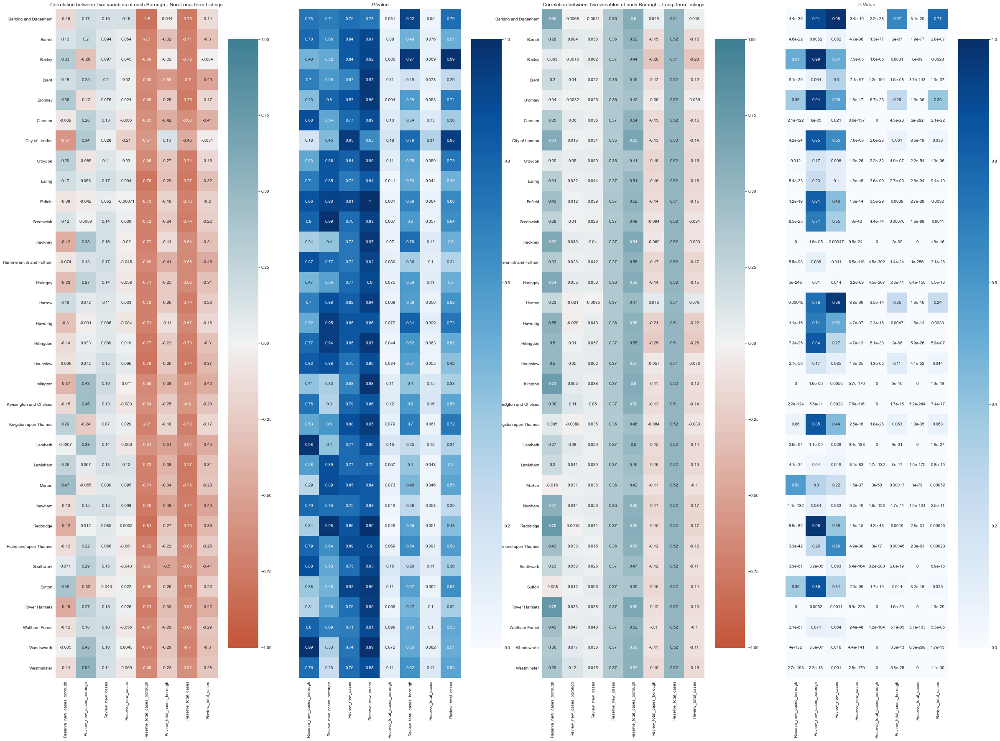

In [217]:
# plot a heatmap to show the correlation between visiting frequency of each borough and covid cases
fig, ax = plt.subplots(ncols=4, figsize = (40,30))
sns.heatmap(
    corr_borough.iloc[:,1:], 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=300),
    square=True,
    annot=True,
    yticklabels=corr_borough.borough,
    ax=ax[0]
)

sns.heatmap(
    p_val_borough.iloc[:,1:], 
    vmin=0, vmax=1, center=0.5,
    cmap=sns.color_palette("Blues", as_cmap=True),
    square=True,
    annot=True,
    yticklabels=False,
    ax=ax[1]
)

sns.heatmap(
    corr_borough_lt.iloc[:,1:], 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=300),
    square=True,
    annot=True,
    yticklabels=corr_borough_lt.borough,
    ax=ax[2]
)

sns.heatmap(
    p_val_borough_lt.iloc[:,1:], 
    vmin=0, vmax=1, center=0.5,
    cmap=sns.color_palette("Blues", as_cmap=True),
    square=True,
    annot=True,
    yticklabels=False,
    ax=ax[3]
)

ax[0].set_title('Correlation between Two variables of each Borough - Non-Long-Term Listings')
ax[1].set_title('P-Value')
ax[2].set_title('Correlation between Two variables of each Borough - Long-Term Listings')
ax[3].set_title('P-Value')

plt.show()

#### Short Summary

##### Non-long-term Listings
Pearson correlation results suggests among the non-long term renting listing groups, high correlations are found between the next month reservation number of each borough with both the total case number and borough total. Comparatively low p-value (~<10%) are found among them too. 

##### Long-term Listings
The correlation results of long-term listings shows an opposite result compared with non-long term rented listings. First, weak correlation are suggested among the review number with all types of covid cases mostly at p-value lower than 0.01. Besides, moderate but positive correlation between next month reservation number and the total case number of London and in each borough, with all p-value under 0.01. Besides, some borough shows strong positive correlation between next-month reservation number and number of new covid cases in the corresponding borough.


#### Spatial Pattern of Non-Long-Term-Rented Listings

In [218]:
# Combine with Spatial Data, include more valid results
corr_borough_geo = corr_borough[['borough','Reserve_total_cases_borough','Reserve_total_cases']].merge(oa,left_on='borough',right_on='NAME',how='left').drop(columns=['NAME','GSS_CODE'])

In [219]:
corr_borough_geo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33 entries, 0 to 32
Data columns (total 4 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   borough                      33 non-null     object  
 1   Reserve_total_cases_borough  33 non-null     float64 
 2   Reserve_total_cases          33 non-null     float64 
 3   geometry                     33 non-null     geometry
dtypes: float64(2), geometry(1), object(1)
memory usage: 1.3+ KB


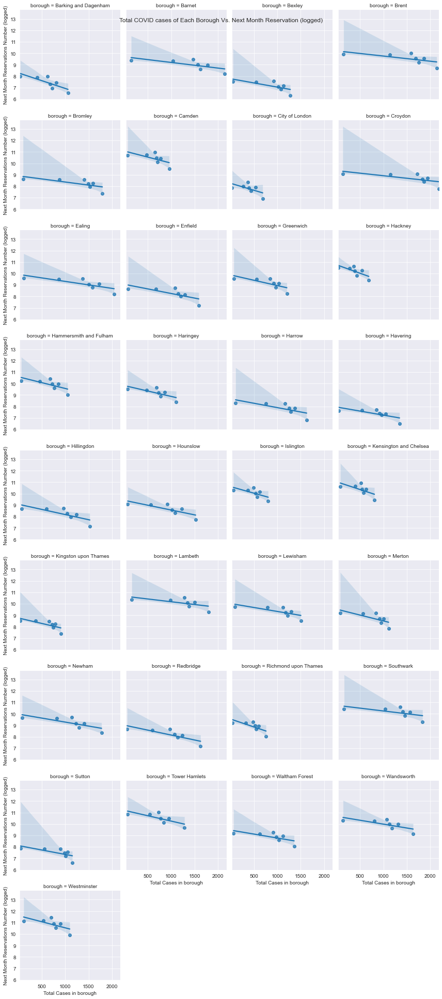

In [220]:
# Plot the regression plot between average borough cases and Next Month Reservation by borough
g = sns.FacetGrid(st_covid_date_borough, col="borough",col_wrap=4)
g.map(sns.regplot, "avg_cases_boroughtotal", "Next_Month_Reservation_trans")

plt.suptitle('Total COVID cases of Each Borough Vs. Next Month Reservation (logged)')
for ax in g.axes:
    g.set_xlabels('Total Cases in borough')
    g.set_ylabels('Next Month Reservations Number (logged)')
plt.show()

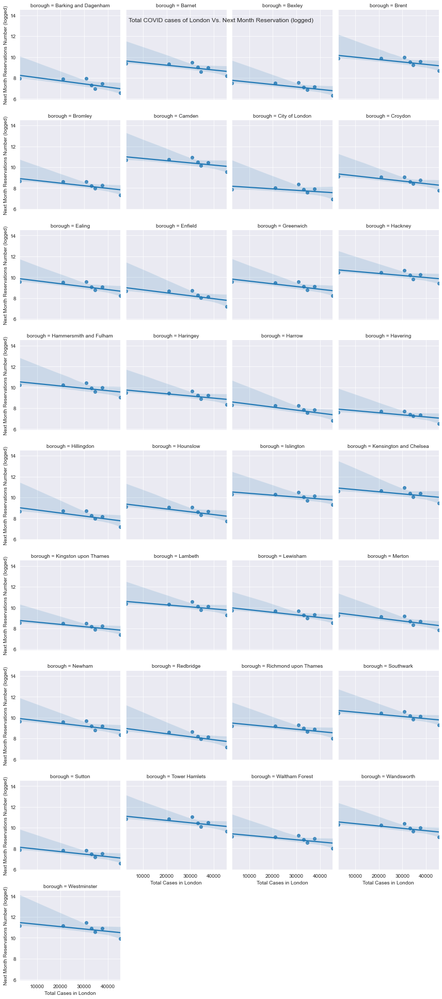

In [221]:
# Plot the regression plot between total London Cases and Next Month Reservation by borough
g = sns.FacetGrid(st_covid_date_borough, col="borough",col_wrap=4)
g.map(sns.regplot, "total_cases_avg", "Next_Month_Reservation_trans")
plt.suptitle('Total COVID cases of London Vs. Next Month Reservation (logged)')
for ax in g.axes:
    g.set_xlabels('Total Cases in London')
    g.set_ylabels('Next Month Reservations Number (logged)')
plt.show()

In [222]:
# Create GeoPandas DataFrame
corr_borough_geo = gpd.GeoDataFrame(corr_borough_geo, crs="epsg:27700").rename(columns={'Reserve_total_cases_borough':'BoroughCases_avg','Reserve_total_cases':'Total_Cases_avg'})

# Create altair DataFrame
corr_borough_alt = alt.InlineData(values = corr_borough_geo.to_json(), 
                       format = alt.DataFormat(property='features',type='json'))

In [388]:
# Creat Map
alt.Chart(corr_borough_alt,title='Correlation of Next Month Reservation in COVID').mark_geoshape(strokeWidth=1,stroke='lightgrey',strokeOpacity=0.2
).encode(
     color=alt.Color(alt.repeat('column'), type='quantitative', scale=alt.Scale(scheme='lightgreyred',domain=[-0.8,-0.5]),sort='descending',title=''),
     tooltip=['properties.borough:N',alt.Tooltip(alt.repeat("column"), type="quantitative")]
).properties(
    projection={'type': 'identity','reflectY': True},
      width=350,
    height=250,
).repeat(
    column=['properties.BoroughCases_avg','properties.Total_Cases_avg'],
).resolve_scale(
    color='independent'
)


alt.RepeatChart(...)

#### Short Summary

The above two charts shows the correlation results of the total number of reservation of each borough with the total number of COVID cases on average and the number of COVID cases on average reported in each borough per month. All results are validated with error rates equal or lower than 10%. As align with overall correlation in previous sessions, all boroughs reservation number correlates with covid cases, yet some boroughs have weak correlations, for instance, boroughs in city center such as Islington, Kensington, City of London and Westminister. As city center boroughs, as suggested in previous sessions, were also borough suffers most in COVID period, it may suggest apart from number of COVID cases, there are other factors influencing on the change in reservation number. In constrast, outer boroughs shows strong corrlation with number of cases. 

Same situation exists when looking at the correlation between borough total cases and reservation number. While most borough, especially those in city center, show around 0.5-0.6 correlation with covid cases. Some outer borough such as Redbridge, Barkingand Dagenham and Hounslow are having strong relationship with numner of covid cases.

#### Spatial Pattern of Long-Term-Rented Listings

In [226]:
# Combine with Spatial Data, include more valid results
corr_borough_geo_lt = corr_borough_lt[['borough','Reserve_total_cases_borough','Reserve_total_cases', 'Reserve_new_cases_borough','Review_total_cases']].merge(oa,left_on='borough',right_on='NAME',how='left').drop(columns=['NAME','GSS_CODE'])
corr_borough_geo_lt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33 entries, 0 to 32
Data columns (total 6 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   borough                      33 non-null     object  
 1   Reserve_total_cases_borough  33 non-null     float64 
 2   Reserve_total_cases          33 non-null     float64 
 3   Reserve_new_cases_borough    33 non-null     float64 
 4   Review_total_cases           33 non-null     float64 
 5   geometry                     33 non-null     geometry
dtypes: float64(4), geometry(1), object(1)
memory usage: 1.8+ KB


In [227]:
# Create GeoPandas DataFrame
corr_borough_geo_lt = gpd.GeoDataFrame(corr_borough_geo_lt, crs="epsg:27700").rename(columns={'Reserve_total_cases_borough':'BoroughCases_avg','Reserve_total_cases':'Total_Cases_avg','Reserve_new_cases_borough':'Borough_NewCases','Review_total_cases':'Review_TotalCase'})

# Create altair DataFrame
corr_borough_alt_lt = alt.InlineData(values = corr_borough_geo_lt.to_json(), 
                       format = alt.DataFormat(property='features',type='json'))

In [387]:
# Creat Map
alt.Chart(corr_borough_alt_lt,title=['COVID Long-Term Rented-Lisiting','Correlation of Next Month Reservation No. Vs.']).mark_geoshape(strokeWidth=1,stroke='lightgrey',strokeOpacity=0.2
).encode(
     color=alt.Color(alt.repeat('row'), type='quantitative', scale=alt.Scale(scheme='lightgreyteal',domain=[0,0.7])),
     tooltip=['properties.borough:N',alt.Tooltip(alt.repeat("row"), type="quantitative")]
).properties(
    projection={'type': 'identity','reflectY': True},
      width=400,
    height=300,
).repeat(
    row=['properties.BoroughCases_avg','properties.Total_Cases_avg','properties.Borough_NewCases'],
).resolve_scale(
    color='independent'
)



alt.RepeatChart(...)

#### Short Summary

Positive Associations are found among the long term rented listings and mostly sensitive in northen part of river. 

### 3.5) Key AirBnB Features in COVID Period

From above analysis we learn that the behavior between the two listing groups. In order to figure out the key features contributing to the difference, a logistic regression model would be built to identify what AirBnB features contribute to the difference between the two groups. 

#### Data Exploration in AirBnB Features

In [229]:
# New variable: Listing_group, where 0=non-long term and 1 = long term
listing_covid_ML['listingGrp'] = 0
listing_covid_ML.loc[listing_covid_ML.id.isin(lt_id),'listingGrp']=1

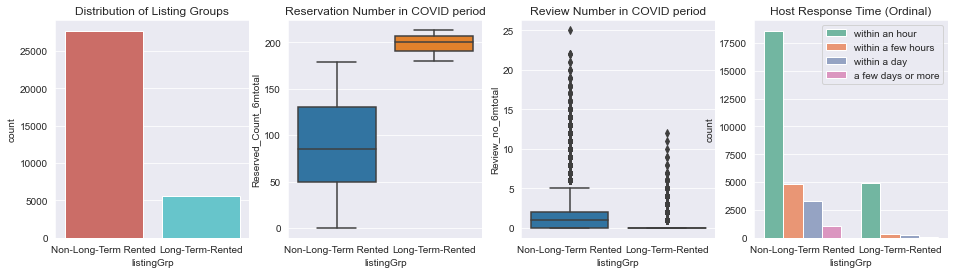

In [345]:
fig, (ax,ax1,ax2,ax3) =plt.subplots(ncols=4,figsize=(16,4))
sns.countplot(x='listingGrp',data=listing_covid_ML, palette='hls',ax=ax)
ax.set_title('Distribution of Listing Groups')
ax.set_xticklabels(['Non-Long-Term Rented','Long-Term-Rented'])
sns.boxplot(x='listingGrp',data=listing_covid_ML,y='Reserved_Count_6mtotal',ax=ax1)
sns.boxplot(x='listingGrp',data=listing_covid_ML,y='Review_no_6mtotal',ax=ax2)
ax1.set_title('Reservation Number in COVID period')
ax1.set_xticklabels(['Non-Long-Term Rented','Long-Term-Rented'])
ax2.set_xticklabels(['Non-Long-Term Rented','Long-Term-Rented'])
ax2.set_title('Review Number in COVID period')
sns.countplot(x="listingGrp", hue="host_response_time", data=listing_covid_ML, palette="Set2",ax=ax3)
ax3.set_title('Host Response Time (Ordinal)')
ax3.set_xticklabels(['Non-Long-Term Rented','Long-Term-Rented'])
ax3.legend(['within an hour','within a few hours','within a day','a few days or more'])
plt.show()

fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Imbalanced Distribution')

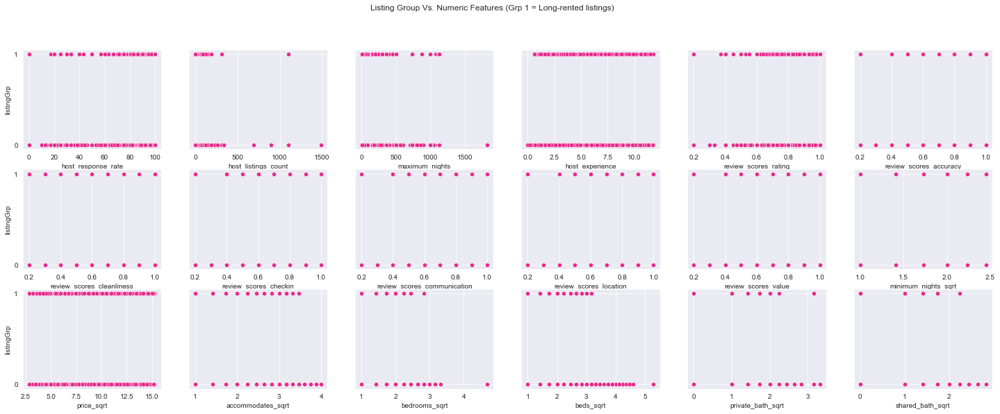

In [233]:
num_var = ['host_response_rate','host_listings_count','maximum_nights','host_experience','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication',
 'review_scores_location','review_scores_value','minimum_nights_sqrt','price_sqrt','accommodates_sqrt','bedrooms_sqrt','beds_sqrt',
 'private_bath_sqrt','shared_bath_sqrt']

fig, ax =plt.subplots(ncols=6,nrows=3,figsize=(25,9),sharey=True)
z=0
# Plot graph to show logistic relationship between binary class and independent numeric values
for j in np.arange(0,3):
    for i in np.arange(0,6):
        x_var = num_var[z]
        sns.scatterplot(y='listingGrp',x=x_var,data=listing_covid_ML,ax=ax[j,i],color='#e7298a')
        ax[j,1].set_yticks([0,1])
        z=z+1
plt.suptitle('Listing Group Vs. Numeric Features (Grp 1 = Long-rented listings)')
plt.show()

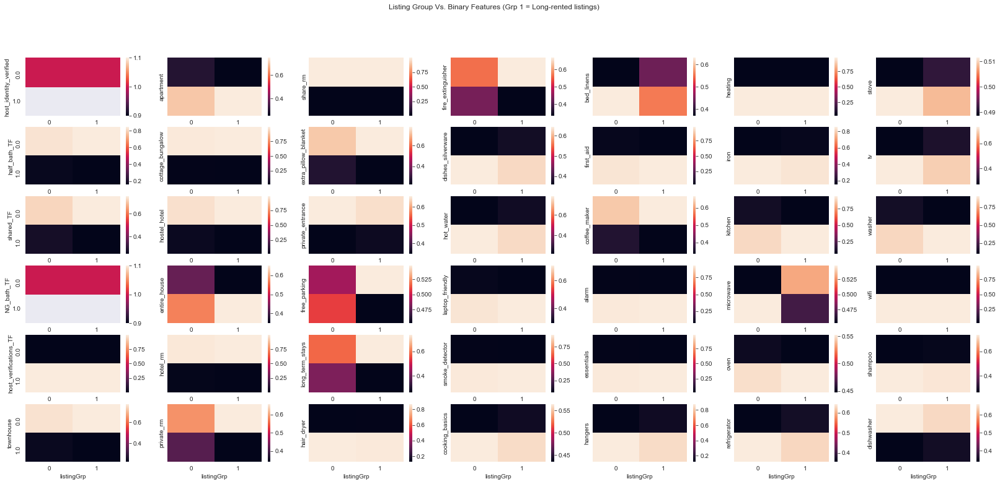

In [234]:
# Explore the binary variables - how the target listing Group differ in proportion and check the variable is good for prediction
binary_var = listing_covid_ML.columns.values[[6] +list(np.arange(8,12)) + list(np.arange(13,50))]
z=0

fig, ax =plt.subplots(ncols=7,nrows=6,figsize=(28,12),sharey=True)

# Plot graph to show logistic relationship between binary class and independent numeric values
for i in np.arange(0,7):
    for j in np.arange(0,6):
        binary = binary_var[z]
        map = pd.crosstab(listing_covid_ML[binary], listing_covid_ML['listingGrp'],normalize='columns')
        sns.heatmap(map,ax=ax[j,i])
        z=z+1
plt.suptitle('Listing Group Vs. Binary Features (Grp 1 = Long-rented listings)')
plt.show()

##### Short Summary:

The distribution of listing Groups within each independent binary variables does not differ much from each other ('horizontal bar' are quite common'). Binary Variables `entire_house`, `private_rm`,`long_term_stays`, `free_parking`,`fire_extinguisher`,`bed_linens` and `microwave` may suggest higher predictor power as they show more variance across Listing Groups.

#### Feature Selection

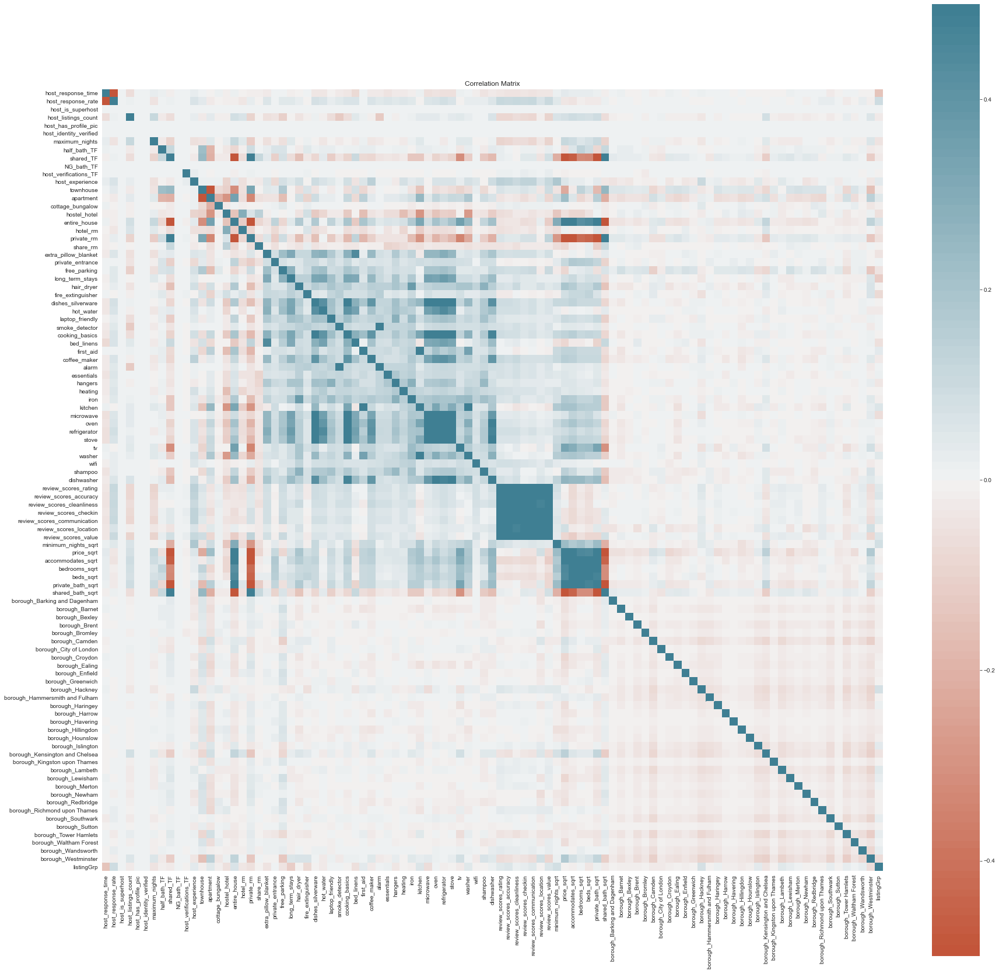

In [341]:
# Find out highly correlated dependent and independent variables
corr = listing_covid_ML.corr().drop(columns=['Reserved_Count_6mtotal','Review_no_6mtotal'],index=['Reserved_Count_6mtotal','Review_no_6mtotal'])
corr.fillna(0,inplace=True)
fig = plt.figure(figsize = (30,30))

ax = sns.heatmap(
    corr, 
    vmin=-0.5, vmax=0.5, center=0,
    cmap=sns.diverging_palette(20, 220, n=100),
    square=True
)
plt.title('Correlation Matrix')
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/First Correlation Matrix')

In [250]:
# Find out the independent varaibles with high correlation with the listing Group
abs(corr['listingGrp']).sort_values(ascending=False).head(50)

listingGrp                        1.000000
host_response_time                0.145321
long_term_stays                   0.114590
host_response_rate                0.094600
minimum_nights_sqrt               0.082857
fire_extinguisher                 0.076433
borough_Hackney                   0.072277
borough_Westminster               0.063719
entire_house                      0.060810
microwave                         0.059344
hostel_hotel                      0.056168
review_scores_accuracy            0.055716
bed_linens                        0.055425
review_scores_value               0.054058
private_rm                        0.053869
kitchen                           0.053206
review_scores_rating              0.050141
washer                            0.045809
borough_Lambeth                   0.044743
maximum_nights                    0.043796
extra_pillow_blanket              0.043626
free_parking                      0.042489
borough_Kensington and Chelsea    0.041751
review_scor

#### Highly correlated group
Several Highly correlated groups are found in the heatmap. Given the nature of the variables, actions are taken to remove these highly correlated groups as below:
- `host_response_time`, `host_response_rate`: Drop `host_response_rate` which show less correlation with the target class
- `town_house`, `apartment`: since they belong to the property_type categories, drop `town_house` which have higher correlations with other independent variables than `apartment`
- Kitchen equipment Group (`coffee_maker`,`hot_water`,`dishes_silverware`, `cooking_basics`, `kitchen`,`microwave`,`oven`, `refrigerator`, `stove`, `dishwasher`) : sum up all equipment to form `Kitchen_Equipment`
- Review Scores: take the average of all review scores
- AirBnB capacities and price (`price_sqrt`,`accommodates_sqrt`,`bedrooms_sqrt`,`beds_sqrt`,`private_bath_sqrt`,`shared_bath_sqrt`,`entire_house`,`private_rm`,`share_TF`) : Form cluster since they all point to the capacity of AirBnB but are different in data nature (cannot be aggregated).
- `washer`,`hostel_hotel`,`first-aid`: `washer` correlates with the other two, hence drop `washer`
- `alarm` and `smoke_detector`: drop `alarm`
- `extra_pillow_sheet` and `bed_linens`: drop `extra_pillow_sheet`

#### Feature Engineering and Dimension Reduction

In [251]:
# Drop columns
listing_covid_ML_2 = listing_covid_ML.drop(columns=['host_response_rate','townhouse','washer','alarm','extra_pillow_blanket'])

# Calculate Mean score
listing_covid_ML_2['Review_Score'] = listing_covid_ML_2[['review_scores_rating','review_scores_accuracy','review_scores_cleanliness'
                                                         ,'review_scores_checkin','review_scores_communication','review_scores_location'
                                                         ,'review_scores_value']].mean(axis=1)
listing_covid_ML_2['Kitchen_Equipment_no'] = listing_covid_ML[['dishes_silverware', 'cooking_basics', 'kitchen','microwave','oven', 'refrigerator', 'stove', 'dishwasher']].sum(axis=1).apply(np.sqrt)
listing_covid_ML_2.drop(columns=['review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin',
                                 'review_scores_communication','review_scores_location','review_scores_value','dishes_silverware', 'cooking_basics'
                                 , 'kitchen','microwave','oven', 'refrigerator', 'stove', 'dishwasher'],inplace=True)

In [252]:
# Form Cluster and Validate Cluster
from sklearn.metrics import silhouette_samples,silhouette_score
cluster_capacity = listing_covid_ML[['price_sqrt','accommodates_sqrt','bedrooms_sqrt','beds_sqrt','private_bath_sqrt','shared_bath_sqrt','entire_house','private_rm','shared_TF']]
scaler = MinMaxScaler()
cluster_scale = scaler.fit_transform(cluster_capacity)

ks=np.arange(2,11)
for k in ks:
    kmeans_mdl_capacity = KMeans(n_clusters=k, random_state=10)
    kmeans_mdl_capacity = kmeans_mdl_capacity.fit(cluster_scale)
    cluster_labels = kmeans_mdl_capacity.predict(cluster_scale)
    silhouette_avg = silhouette_score(cluster_scale, cluster_labels)
    print("For n_clusters =", k,
          "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.7170966489237699
For n_clusters = 3 The average silhouette_score is : 0.7698559199130377
For n_clusters = 4 The average silhouette_score is : 0.5365283999653703
For n_clusters = 5 The average silhouette_score is : 0.5454517509262737
For n_clusters = 6 The average silhouette_score is : 0.532454689150936
For n_clusters = 7 The average silhouette_score is : 0.5487103661710812
For n_clusters = 8 The average silhouette_score is : 0.5123231884960494
For n_clusters = 9 The average silhouette_score is : 0.5236586315438494
For n_clusters = 10 The average silhouette_score is : 0.3993359152858251


##### Validating Cluster Value
Silhouette score suggest the distance of each cluster from each other. Therefore, clusters with far distance from others (k=3) is chosen.

In [253]:
# Choose highest k=3
kmeans_mdl_capacity = KMeans(n_clusters=3, random_state=10).fit(cluster_scale)
cluster_labels = kmeans_mdl_capacity.predict(cluster_scale)
listing_covid_ML_2.loc[:,'Capacity_Cluster']=cluster_labels

# Gettinc cluster sizes
cluster_sizes = listing_covid_ML_2['Capacity_Cluster'].value_counts().to_frame('counts')
print("Cluster sizes:")
print(cluster_sizes)

# Getting the Centroid values
centroids = pd.DataFrame(kmeans_mdl_capacity.cluster_centers_)
print("Centroid:")
print(centroids)

listing_covid_ML_2.drop(columns=['price_sqrt','accommodates_sqrt','bedrooms_sqrt','beds_sqrt','private_bath_sqrt','shared_bath_sqrt','entire_house','private_rm','shared_TF'],inplace=True)

Cluster sizes:
   counts
1   19573
0    8978
2    4791
Centroid:
          0         1         2         3             4             5  \
0  0.270225  0.110087  0.005691  0.017092  1.193490e-15  3.660574e-01   
1  0.578514  0.320478  0.075209  0.099829  3.372878e-01  4.010681e-15   
2  0.365731  0.141438  0.009207  0.022708  3.087003e-01 -1.235123e-15   

              6             7             8  
0 -1.110223e-15  9.800624e-01  1.000000e+00  
1  9.954529e-01 -2.592371e-14  1.088019e-14  
2 -4.329870e-15  9.511584e-01  2.498002e-15  


In [254]:
listing_covid_ML_2.head()

,id,host_response_time,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,maximum_nights,half_bath_TF,NG_bath_TF,host_verifications_TF,...,borough_Southwark,borough_Sutton,borough_Tower Hamlets,borough_Waltham Forest,borough_Wandsworth,borough_Westminster,listingGrp,Review_Score,Kitchen_Equipment_no,Capacity_Cluster
0,11551,1,0,3.0,0,0,180.0,0.0,0.0,1.0,...,0,0,0,0,0,0,0,0.930000,2.645751,1
1,13913,3,0,4.0,0,0,29.0,0.0,0.0,1.0,...,0,0,0,0,0,0,0,0.967143,2.449490,0
2,15400,3,0,1.0,0,0,50.0,0.0,0.0,1.0,...,0,0,0,0,0,0,0,0.980000,2.236068,1
3,17402,1,0,18.0,0,0,365.0,0.0,0.0,1.0,...,0,0,0,0,0,1,0,0.934286,2.828427,1
4,25123,1,0,3.0,0,0,1120.0,1.0,0.0,1.0,...,0,0,0,0,0,0,0,0.980000,1.000000,0


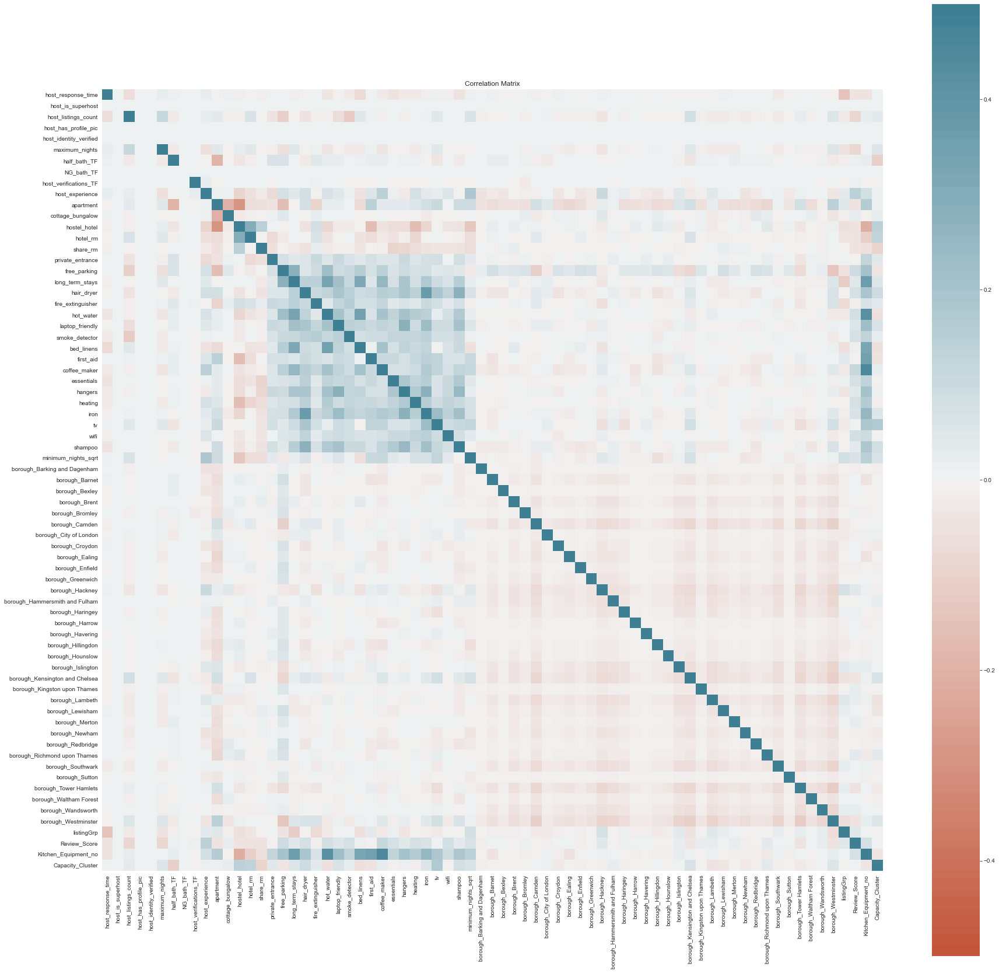

In [255]:
corr_2 = listing_covid_ML_2.corr().drop(columns=['Reserved_Count_6mtotal','Review_no_6mtotal'],index=['Reserved_Count_6mtotal','Review_no_6mtotal'])
corr_2.fillna(0,inplace=True)
plt.figure(figsize = (30,30))

ax = sns.heatmap(
    corr_2, 
    vmin=-0.5, vmax=0.5, center=0,
    cmap=sns.diverging_palette(20, 220, n=100),
    square=True
)
plt.title('Correlation Matrix')
plt.show()

In [256]:
# Show variables with low correslation with target class
corr_df = pd.DataFrame(abs(corr_2['listingGrp']).sort_values(ascending=True)).reset_index().rename(columns={'index':'variables'})
corr_df[corr_df['listingGrp']<=0.05].head()

,variables,listingGrp
0,host_is_superhost,0.000000
1,host_has_profile_pic,0.000000
2,host_identity_verified,0.000000
3,NG_bath_TF,0.000000
4,borough_Barking and Dagenham,0.001112


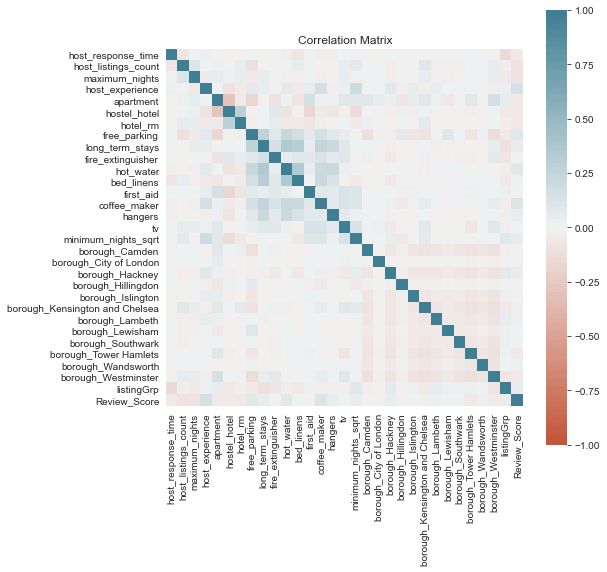

In [331]:
### Remove variables with 0 correlation with the target class (Correlation <0.02)
remove_col = corr_df.loc[corr_df['listingGrp']<=0.02,'variables']
listing_covid_ML_3 = listing_covid_ML_2.drop(columns=remove_col)
corr_3 = listing_covid_ML_3.corr().drop(columns=['Reserved_Count_6mtotal','Review_no_6mtotal'],index=['Reserved_Count_6mtotal','Review_no_6mtotal'])
corr_3.fillna(0,inplace=True)
fig = plt.figure(figsize = (8,8))

ax = sns.heatmap(
    corr_3, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=100),
    square=True
)
plt.title('Correlation Matrix')
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Correlation Matrix')

#### Scaling and Normalization

In [258]:
# Scale to [0,1]
listing_covid_ML_4 = listing_covid_ML_3.copy()
norm_col = ['host_listings_count','maximum_nights','host_experience','minimum_nights_sqrt','host_response_time']

listing_covid_ML_4[norm_col] = scaler.fit_transform(listing_covid_ML_4[norm_col])
print(listing_covid_ML_4.head())

      id  host_response_time  host_listings_count  maximum_nights  \
0  11551            0.000000             0.002013        0.098136   
1  13913            0.666667             0.002685        0.015351   
2  15400            0.666667             0.000671        0.026864   
3  17402            0.000000             0.012081        0.199561   
4  25123            0.000000             0.002013        0.613487   

   host_experience  apartment  hostel_hotel  hotel_rm  free_parking  \
0         0.932203        1.0           0.0       0.0           1.0   
1         0.923729        1.0           0.0       0.0           1.0   
2         0.915254        1.0           0.0       0.0           0.0   
3         0.906780        1.0           0.0       0.0           1.0   
4         0.889831        0.0           0.0       0.0           1.0   

   long_term_stays  ...  borough_Islington  borough_Kensington and Chelsea  \
0              1.0  ...                  0                               0   
1 

In [259]:
# Final data for building model
listing_covid_ML_final = listing_covid_ML_4.drop(columns=['id','Reserved_Count_6mtotal','Review_no_6mtotal']) # Drop column irrelavent for model
listing_covid_ML_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33342 entries, 0 to 33341
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_response_time              33342 non-null  float64
 1   host_listings_count             33342 non-null  float64
 2   maximum_nights                  33342 non-null  float64
 3   host_experience                 33342 non-null  float64
 4   apartment                       33342 non-null  float64
 5   hostel_hotel                    33342 non-null  float64
 6   hotel_rm                        33342 non-null  float64
 7   free_parking                    33342 non-null  float64
 8   long_term_stays                 33342 non-null  float64
 9   fire_extinguisher               33342 non-null  float64
 10  hot_water                       33342 non-null  float64
 11  bed_linens                      33342 non-null  float64
 12  first_aid                       

#### Logistic Regression Model

In [260]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score, roc_auc_score,roc_curve

In [261]:
# Define the dependent and independent variables
X= listing_covid_ML_final.drop(columns='listingGrp')
Y=listing_covid_ML_final['listingGrp']

In [262]:
# define the model
model = LogisticRegression()

# Split the training and testing model
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state=25)

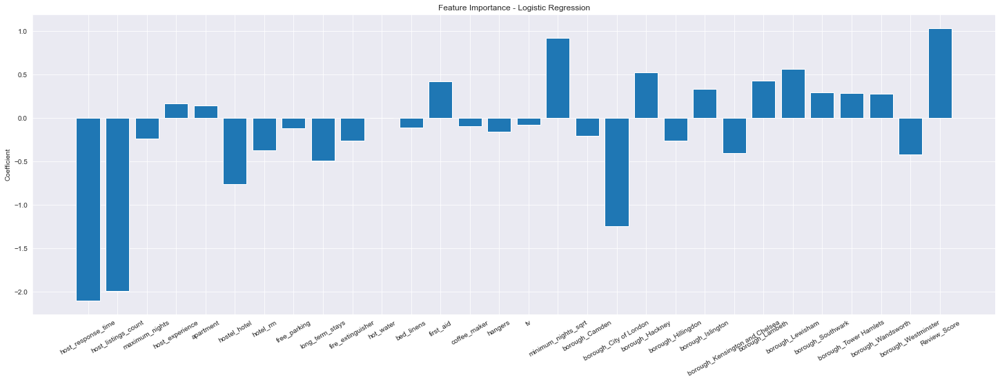

In [263]:
# fit the model
model.fit(X_train, y_train)

# understand the importance from the coefficient
importance = model.coef_[0]

# summarize feature importance
fig, ax = plt.subplots(figsize= (25,8))
ax=plt.axes()
plt.bar([x for x in range(len(importance))], importance)
ax.set_xticks(range(len(X_train.columns)))
ax.set_xticklabels(X_train.columns,rotation=30)
plt.title('Feature Importance - Logistic Regression')
plt.ylabel('Coefficient')
plt.show()

#### Short Summary on Feature Importance

By evaluating the coefficient of the model, we can obtain the importance of each dependent variables on the positive class prediction, important features are hence identified as `host_response_time`, `host_listings_count`, `maximum_nights`, `host_experience` which holds negative relationship with probability of Long-Term-Rented Listing, and `review_score`, `borough_Westminister` which hold positive relationship. 

On the other hand, some features are identified as less important, or even not importanct at all (such as `hot water`). Others including `bed_linens`,`tv`,`free_parking`,`coffee_maker`,`first-aid` also contain low coefficient.

In [264]:
# Validation with Test Result
y_pred = model.predict(X_test) 
cm = confusion_matrix(y_test.tolist(), y_pred.tolist(),normalize='true')
ROC = roc_auc_score(y_test.tolist(), y_pred.tolist())
print(classification_report(y_test, y_pred))
print('The AUC of ROC is ' + str(ROC))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91      5564
           1       0.35      0.01      0.01      1105

    accuracy                           0.83      6669
   macro avg       0.59      0.50      0.46      6669
weighted avg       0.75      0.83      0.76      6669

The AUC of ROC is 0.5019991965154141


In [265]:
# K Fold Cross Validation is performed to provide better estimation on the model performance
from sklearn.model_selection import RepeatedKFold, cross_val_score  

cv_repeat = RepeatedKFold(n_splits=10, n_repeats=4, random_state=1) # Set k=10-fold validation, repeat for 4 time for stability
scores = cross_val_score(model, X_train,y_train, scoring='accuracy', cv=cv_repeat, n_jobs=-1)

In [266]:
print('10-Fold Cross Validated Accuracy - by Repeated K-Fold (training): %.3f (%.3f)' % (scores.mean(), scores.std()))
print('Test Accuracy From Unseen Data: 0.83')

10-Fold Cross Validated Accuracy - by Repeated K-Fold (training): 0.831 (0.006)
Test Accuracy From Unseen Data: 0.83


In [267]:
# Obtin distribution of target class
print(y_test.value_counts(normalize=True))
print(y_train.value_counts(normalize=True))

0    0.834308
1    0.165692
Name: listingGrp, dtype: float64
0    0.830803
1    0.169197
Name: listingGrp, dtype: float64


##### Stratified Repeated K-Fold validation
Since the Dataset is quite imbalance, a high value of K-fold validation may even split the data more. Therefore, stratification method should be performed for balancing.

In [268]:
from sklearn.model_selection import RepeatedStratifiedKFold
cv_straf= RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores_straf = cross_val_score(model, X_train,y_train, scoring='accuracy', cv=cv_straf, n_jobs=-1)
print('10-Fold Cross Validated Accuracy - by Stratified Repeated K-Fold (training): %.3f (%.3f)' % (scores_straf.mean(), scores_straf.std()))

10-Fold Cross Validated Accuracy - by Stratified Repeated K-Fold (training): 0.831 (0.001)


The standard deviation suggests that the model accuracy is more stable.

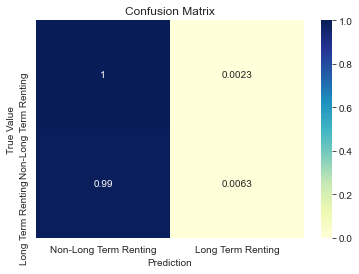

In [269]:
# Plot Confusion Matrix
fig,ax=plt.subplots()
sns.heatmap(cm,center=0.5,vmax=1,vmin=0,cmap="YlGnBu",annot=True)
plt.title('Confusion Matrix')
ax.set_xticklabels(['Non-Long Term Renting','Long Term Renting'])
ax.set_yticklabels(['Non-Long Term Renting','Long Term Renting'])
ax.set_xlabel('Prediction')
ax.set_ylabel('True Value')
plt.show()

#### Short Summary for Baseline Model:

- Generally Speaking, the **overall accuracy is 83.1%**, validation by both K-fold stratified cross validation and the unseen test data. 
- However, the accuracy rate among the two target classes, non-long-term and long-term rented listings, are very extreme. Indeed, almost all accuracy is contribution by the negative class (class 0) prediction. This is quite obvious by viewing the F1 score of two classes, whereas **F1 score of positive class is only 0.01 and that of negative class is 0.91. The accuracy of positive class is 0.01 only.**
- When looking at the Area Under the Curve, which measures the trade-off for different thresholds and provides a useful number for comparing models based on their general capabilities. The AUC is only 50.2%, which is slightly better than Non-skilled model. A ROC curve is plotted as below. 
- One of the reason could be the imbalanced data, as almost 90% of the data belongs to negative class and 10% is the positive class. A balanced dataset assumed equal class weight, yet it does not apply when they are imbalance. 
- As per previous exploratory analysis on distribution of dependent variables between two target classes and the correlation analysis, many variables suggest weak correlation with the target class. Similar distribution are found between two classes. Hence in graph it may be hard to classify them into two classes. Noises are commonly observed and hence **default threshold may not represent an optimal interpretation of the predicted probabilities. Due to the imbalance dataset, we may have to determine the best threshold for determination, and trade off negative prediction power for positive class prediction.**
- Regarding variables with low feature importance, they will be removed.


#### Remove Variables

In [270]:
X2= listing_covid_ML_final.drop(columns=['listingGrp','hot_water'])
Y2=listing_covid_ML_final['listingGrp']

# Split the training and testing model
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, Y2, test_size = 0.2, random_state=25)

model2 = LogisticRegression()
# fit the model
model2.fit(X_train2, y_train2)

LogisticRegression()

In [271]:
# Validation with Test Result
y2_pred = model2.predict(X_test2) 
cm2 = confusion_matrix(y_test2.tolist(), y2_pred.tolist(),normalize='all')
ROC = roc_auc_score(y_test2.tolist(), y2_pred.tolist())
print(classification_report(y_test2, y2_pred))
print('The AUC of ROC is ' + str(ROC))

cv_straf= RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores_straf = cross_val_score(model, X_train2,y_train2, scoring='accuracy', cv=cv_straf, n_jobs=-1)
print('10-Fold Cross Validated Accuracy - by Stratified Repeated K-Fold (training): %.3f (%.3f)' % (scores_straf.mean(), scores_straf.std()))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91      5564
           1       0.35      0.01      0.01      1105

    accuracy                           0.83      6669
   macro avg       0.59      0.50      0.46      6669
weighted avg       0.75      0.83      0.76      6669

The AUC of ROC is 0.5019991965154141
10-Fold Cross Validated Accuracy - by Stratified Repeated K-Fold (training): 0.831 (0.001)


#### Thresholding by ROC AUC

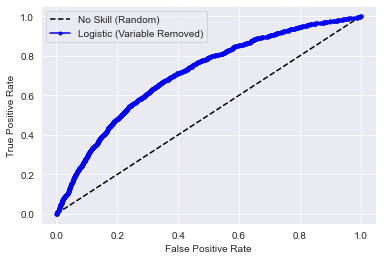

In [272]:
# Plot a ROC Curve for thresholding
# predict probabilities
y2_pred_prob = model2.predict_proba(X_test2)
# Only use the probability for positive class
y2_pred_prob = y2_pred_prob[:, 1]
# ROC Curve calculation
fpr2, tpr2, thresholds2 = roc_curve(y_test2, y2_pred_prob)

# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill (Random)',color='k')
plt.plot(fpr2, tpr2, marker='.', label='Logistic (Variable Removed)',color='b')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Since we are not emphasizing on prediction of either class, Geometric Mean will be used to seek a balance between the sensitivity and the specificity for the imbalanced dataset (i.e. G-Mean = sqrt(Sensitivity * Specificity))

In [273]:
gmeans2 = np.sqrt(tpr2 * (1-fpr2)) # G mean in each threshold
best_gmean2_idx = np.argmax(gmeans2) # Get index for best g-mean
Best_threshold2 = thresholds2[best_gmean2_idx] # Get best threshold according to the index
print('Best Threshold = ' + str(Best_threshold2))

Best Threshold = 0.17875408928989184


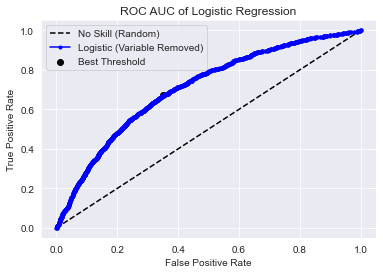

In [330]:
# plot the roc curve for the model
fig = plt.figure()
plt.scatter(fpr2[best_gmean2_idx], tpr2[best_gmean2_idx], marker='o', color='black', label='Best Threshold')
plt.plot([0,1], [0,1], linestyle='--', label='No Skill (Random)',color='k')
plt.plot(fpr2, tpr2, marker='.', label='Logistic (Variable Removed)',color='b')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC AUC of Logistic Regression')
plt.legend()
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/ROC AUC')

In [275]:
# Make prediction based on the new threshold
model2_thres = LogisticRegression(class_weight={0:Best_threshold2,1:(1-Best_threshold2)})
# fit the model
model2_thres.fit(X_train2, y_train2)

# Make predictions
y2_pred_prob_thres = model2_thres.predict_proba(X_test2)
y2_pred_thres = model2_thres.predict(X_test2)
# Only use the probability for positive class
y2_pred_prob_thres = y2_pred_prob_thres[:, 1]
# ROC Curve calculation
fpr2_thres, tpr2_thres, thresholds2 = roc_curve(y_test2, y2_pred_prob_thres)

cm2 = confusion_matrix(y_test2.tolist(), y2_pred_thres.tolist(),normalize='true')
ROC = roc_auc_score(y_test2.tolist(), y2_pred_thres.tolist())
print(classification_report(y_test2, y2_pred_thres))
print('The AUC of ROC is ' + str(ROC))

cv_straf= RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores_straf = cross_val_score(model2_thres, X_train2,y_train2, scoring='accuracy', cv=cv_straf, n_jobs=-1)
print('10-Fold Cross Validated Accuracy - by Stratified Repeated K-Fold (training): %.3f (%.3f)' % (scores_straf.mean(), scores_straf.std()))

              precision    recall  f1-score   support

           0       0.91      0.65      0.76      5564
           1       0.28      0.66      0.39      1105

    accuracy                           0.66      6669
   macro avg       0.59      0.66      0.57      6669
weighted avg       0.80      0.66      0.70      6669

The AUC of ROC is 0.65805493297247
10-Fold Cross Validated Accuracy - by Stratified Repeated K-Fold (training): 0.649 (0.009)


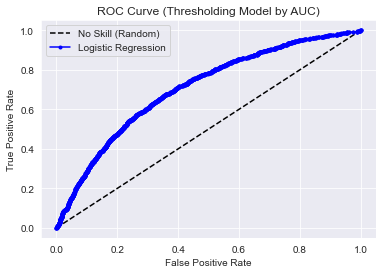

In [276]:
# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill (Random)',color='k')
plt.plot(fpr2_thres, tpr2_thres, marker='.', label='Logistic Regression',color='b')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.title('ROC Curve (Thresholding Model by AUC)')
plt.show()

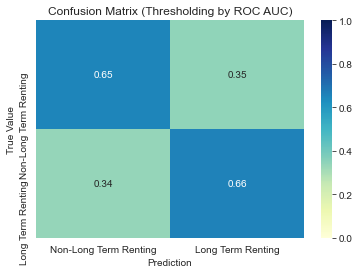

In [326]:
# Plot Confusion Matrix
fig,ax=plt.subplots()
sns.heatmap(cm2,center=0.5,vmax=1,vmin=0,cmap="YlGnBu",annot=True)
plt.title('Confusion Matrix (Thresholding by ROC AUC)')
ax.set_xticklabels(['Non-Long Term Renting','Long Term Renting'])
ax.set_yticklabels(['Non-Long Term Renting','Long Term Renting'])
ax.set_xlabel('Prediction')
ax.set_ylabel('True Value')
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Confusion Matrix')

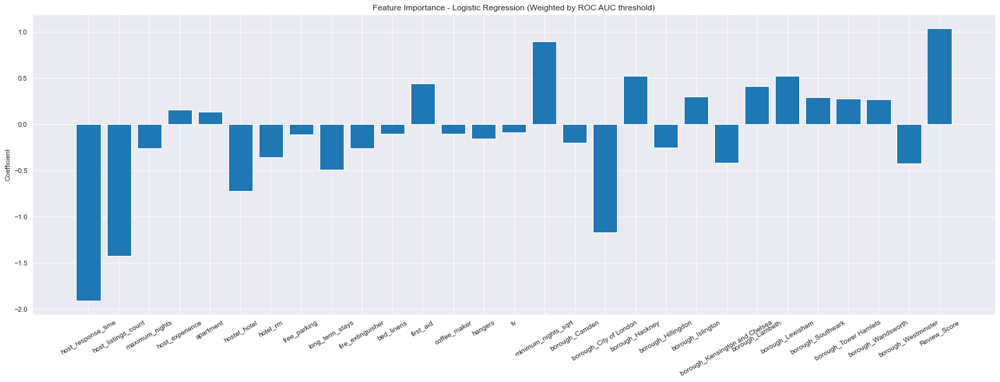

In [278]:
# understand the importance from the coefficient
importance = model2_thres.coef_[0]

# summarize feature importance
fig, ax = plt.subplots(figsize= (25,8))
ax=plt.axes()
plt.bar([x for x in range(len(importance))], importance)
ax.set_xticks(range(len(X_train2.columns)))
ax.set_xticklabels(X_train2.columns,rotation=30)
plt.title('Feature Importance - Logistic Regression (Weighted by ROC AUC threshold)')
plt.ylabel('Coefficient')
plt.show()

#### Thresholding by balanced Class Weight

Class Weight is calculated based  on the formula: `No. of sample in the training set / (No. of Class * Count of Class)`

In [279]:
from sklearn.utils.class_weight import compute_class_weight

In [280]:
class_weight = compute_class_weight(class_weight='balanced',classes=[0,1],y=y_train)
print('New Weight of Class 0: ' + str(class_weight[0]) + ', class 1 Weight: ' + str(class_weight[1]))

New Weight of Class 0: 0.6018276173285199, class 1 Weight: 2.9551296255262574


In [281]:
# Train model once again

model_weight = LogisticRegression(class_weight={0:class_weight[0],1:class_weight[1]})

# fit the model
model_weight.fit(X_train2, y_train2)
y_pred_weight = model_weight.predict(X_test2) # Make prediction

In [282]:
# predict probabilities
y_pred_prob_weight = model_weight.predict_proba(X_test2)
# Only use the probability for positive class
y_pred_prob_weight = y_pred_prob_weight[:, 1]
# ROC Curve calculation
fpr_weight, tpr_weight, thresholds_weight = roc_curve(y_test2, y_pred_prob_weight)


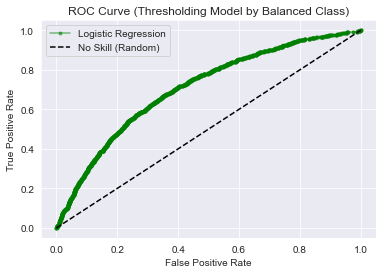

In [283]:
# plot the roc curve for the model
plt.plot(fpr_weight, tpr_weight, marker='.', label='Logistic Regression',color='g',alpha=0.5)
plt.plot([0,1], [0,1], linestyle='--', label='No Skill (Random)',color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Thresholding Model by Balanced Class)')
plt.legend()
plt.show()

In [284]:
# Validation with Test Result
cm_weight = confusion_matrix(y_test2.tolist(), y_pred_weight.tolist(),normalize='true')
ROC_weight = roc_auc_score(y_test2.tolist(), y_pred_weight.tolist())
print(classification_report(y_test2, y_pred_weight))
print('The AUC of ROC is ' + str(ROC_weight))

cv_straf= RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores_straf = cross_val_score(model_weight, X_train2,y_train2, scoring='accuracy', cv=cv_straf, n_jobs=-1)
print('10-Fold Cross Validated Accuracy - by Stratified Repeated K-Fold (training): %.3f (%.3f)' % (scores_straf.mean(), scores_straf.std()))

              precision    recall  f1-score   support

           0       0.91      0.62      0.74      5564
           1       0.26      0.69      0.38      1105

    accuracy                           0.63      6669
   macro avg       0.59      0.65      0.56      6669
weighted avg       0.80      0.63      0.68      6669

The AUC of ROC is 0.6543726476931534
10-Fold Cross Validated Accuracy - by Stratified Repeated K-Fold (training): 0.624 (0.009)


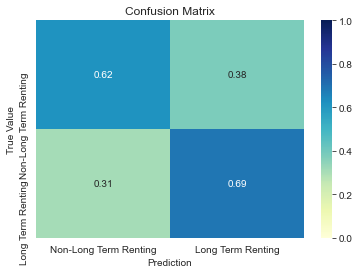

In [285]:
# Plot Confusion Matrix
fig,ax=plt.subplots()
sns.heatmap(cm_weight,center=0.5,vmax=1,vmin=0,cmap="YlGnBu",annot=True)
plt.title('Confusion Matrix')
ax.set_xticklabels(['Non-Long Term Renting','Long Term Renting'])
ax.set_yticklabels(['Non-Long Term Renting','Long Term Renting'])
ax.set_xlabel('Prediction')
ax.set_ylabel('True Value')
plt.show()

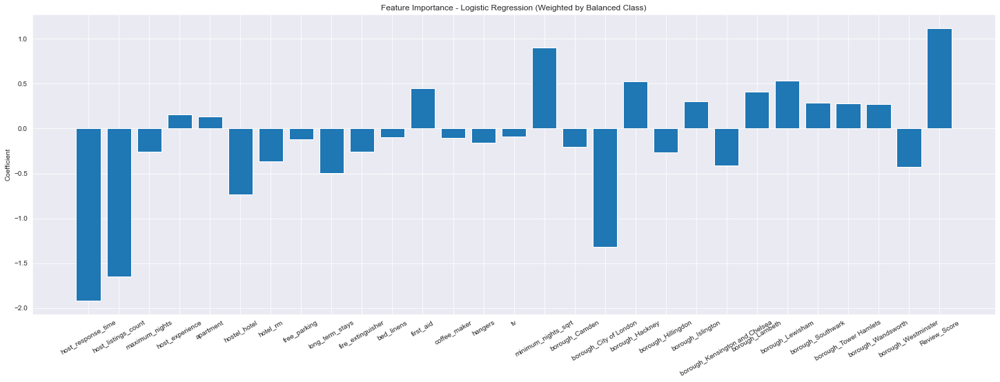

In [286]:
# understand the importance from the coefficient
importance = model_weight.coef_[0]
intercept_weight = model_weight.intercept_
# summarize feature importance
fig, ax = plt.subplots(figsize= (25,8))
ax=plt.axes()
plt.bar([x for x in range(len(importance))], importance)
ax.set_xticks(range(len(X_train2.columns)))
ax.set_xticklabels(X_train2.columns,rotation=30)
plt.title('Feature Importance - Logistic Regression (Weighted by Balanced Class)')
plt.ylabel('Coefficient')
plt.show()

#### Short Summary on Threshold Tuning

Using ROC AUC and  the frequency count to Forecast a model definitely improve the positive class prediction. Although tuning by balanced class weight suggest higher positive prediction, it sacriface more negative class prediction than ROC threshold. Hence the model by AUC threshold tuning is preferred.

#### Feature Importance

In [287]:
importance = model2_thres.coef_[0]
intercept_thres= model2_thres.intercept_

In [288]:
print(intercept_thres)
print(importance)

[-1.04376243]
[-1.91102399 -1.42768579 -0.26346955  0.15856583  0.13441842 -0.7205443
 -0.35329156 -0.11393019 -0.4914924  -0.25919194 -0.09969367  0.44525038
 -0.10235115 -0.15785906 -0.08638829  0.89935149 -0.20042365 -1.1715482
  0.52503394 -0.2515562   0.30300108 -0.41329874  0.410197    0.52533302
  0.2916202   0.27923341  0.27169188 -0.42523327  1.03967945]


In [313]:
# Build a DataFrame
FeatureImportance = pd.DataFrame([list(X_train2.columns),list(importance)]).transpose().rename(columns={0:'Feature',1:'Coef'})

In [314]:
# Include Intercept a DataFrame
i =pd.DataFrame(['No Variable',intercept_weight[0]]).transpose().rename(columns={0:'Feature',1:'Coef'})
FeatureImportance = pd.concat([FeatureImportance,i])
FeatureImportance = FeatureImportance.astype({'Coef':'float64'}).reset_index(drop=True)

In [315]:
# Remove the logit to get the Odd ratio for interpretation
FeatureImportance['OddsRatio'] = np.exp(FeatureImportance['Coef'])
FeatureImportance['Coef_abs'] = np.abs(FeatureImportance['Coef'])

In [316]:
FeatureImportance = FeatureImportance.sort_values(by='Coef',ascending=False).reset_index(drop=True)
FeatureImportance.head(30)

,Feature,Coef,OddsRatio,Coef_abs
0,Review_Score,1.039679,2.828310,1.039679
1,minimum_nights_sqrt,0.899351,2.458009,0.899351
2,borough_Lewisham,0.525333,1.691022,0.525333
3,borough_Hackney,0.525034,1.690516,0.525034
4,first_aid,0.445250,1.560881,0.445250
5,borough_Lambeth,0.410197,1.507115,0.410197
6,borough_Islington,0.303001,1.353916,0.303001
7,borough_Southwark,0.291620,1.338595,0.291620
8,borough_Tower Hamlets,0.279233,1.322116,0.279233
9,borough_Wandsworth,0.271692,1.312183,0.271692


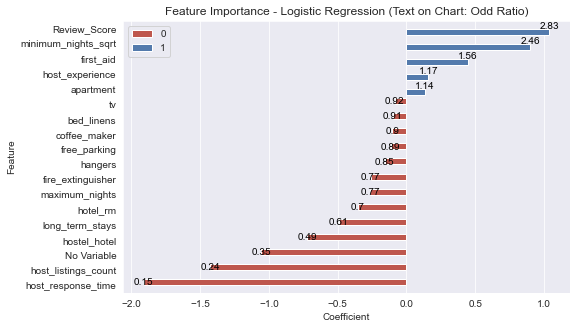

In [334]:
# Plot Graph again to understand the positive and negative impact of each feature

# Remove borough information, display in map
df = FeatureImportance[~FeatureImportance.Feature.str.contains('borough')].reset_index(drop=True)

fig, ax = plt.subplots(figsize= (8,5))
colors = [1 if c >= 0 else 0 for c in df.Coef]
sns.barplot(data=df, x='Coef', y='Feature',hue=colors,palette=sns.diverging_palette(15, 250, n=2,center="dark"))

for index, row in df.iterrows():
    plt.text(row.Coef,index, round(row.OddsRatio,2), color='black',ha='center')

plt.title('Feature Importance - Logistic Regression (Text on Chart: Odd Ratio)')
plt.xlabel('Coefficient')
plt.show()
fig.savefig('C:/Users/Hillie/Documents/GitHub/in3061-inm430-coursework-hillielau/coursework/Feature Importance')

#### Short Summary:

The length of bar indicates the coefficient value and direction, while the text at bar edge indicate the Odd ratio of the variables. Hence, the following summary is made:

- `host_response_time`, `host_listings_count` are host information which suggest negative relationship with better performance in visiting frequency. One level increase in host_response_time (the higher the slower response time), or increase in one listings that the host holds, means 85% and 76% decrease in odd ratios toward long term rented listing groups.

- `Review_score` (ordinal), `minimum_nights_sqrt` (numeric - squared) and `first_aid`(binary) are top 3 room features suggests positive relationship with proability of higher visiting frequency. 

- Locational Features: some borough suggest probability of lower visiting frequency such as Westminister, City of London and Kensington  and Chelsea, which are all located in city center. Some demonstrate probability of higher visiting frequency, such as Lewisham, Hackney, Islington and Lambeth.

- `No Variable` refers to the intercept of the model. It suggest if you only hold on listing without any features given, it's quite unlike (odd ratio = 0.35) to observe high visiting frequency.






In [304]:
### Plot map to show coefficient of borough specifically

# Extract borough from Feature importance dataframe
BoroughImportance = FeatureImportance[FeatureImportance.Feature.str.contains('borough')].copy()

# Update their name for matching Geo Data
BoroughImportance.Feature = BoroughImportance.Feature.str.replace('borough_','')
BoroughImportance.Feature = BoroughImportance.Feature.str.replace('_',' ')

# Merge with Shape file
BoroughImportance = BoroughImportance.merge(oa[['NAME','geometry']],left_on='Feature',right_on='NAME',how='right').reset_index(drop=True) # Some borough name are missing in left df

BoroughImportance.head()

,Feature,Coef,OddsRatio,Coef_abs,NAME,geometry
0,NaN,NaN,NaN,NaN,Kingston upon Thames,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,NaN,NaN,NaN,NaN,Croydon,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,NaN,NaN,NaN,NaN,Bromley,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,NaN,NaN,NaN,NaN,Hounslow,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,NaN,NaN,NaN,NaN,Ealing,"POLYGON ((510253.500 182881.600, 510249.900 18..."


In [306]:
## Null values appear because no coef is found in the model
## Fill as 0 (Coef) and  1(oddRatio)
BoroughImportance.Coef = BoroughImportance.Coef.fillna(0)
BoroughImportance.Coef_abs = BoroughImportance.Coef_abs.fillna(0)
BoroughImportance.OddsRatio = BoroughImportance.OddsRatio.fillna(1)
BoroughImportance = BoroughImportance.drop(columns='Feature').rename(columns={'NAME':'borough'})

BoroughImportance.head()

,Coef,OddsRatio,Coef_abs,borough,geometry
0,0.0,1.0,0.0,Kingston upon Thames,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,0.0,1.0,0.0,Croydon,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,0.0,1.0,0.0,Bromley,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,0.0,1.0,0.0,Hounslow,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,0.0,1.0,0.0,Ealing,"POLYGON ((510253.500 182881.600, 510249.900 18..."


In [307]:
# Create a GeoPandas DataFrame
BoroughImportance = gpd.GeoDataFrame(BoroughImportance, crs="epsg:27700")

## convert to altair data
BoroughImportance_df = alt.InlineData(values = BoroughImportance.to_json(), 
                       format = alt.DataFormat(property='features',type='json'))

In [311]:
# Plot Map displaying the borough importance
alt.Chart(BoroughImportance_df, title=["Importance of Borough by Regression Coef",'Positive Class= Long-Rented Listing']).mark_geoshape(strokeWidth=1,stroke='lightgray',strokeOpacity=0.2
).encode(
    color=alt.Color('properties.Coef:Q', scale=alt.Scale(scheme='redblue', domain=[-1, 1]),title='')
    , tooltip=alt.Tooltip(['properties.borough:N','properties.Coef:Q','properties.OddsRatio:Q'])
).properties(
    projection={'type': 'identity','reflectY': True},
    width=400,
    height=300
)

alt.Chart(...)

#### Short Summary:
Coefficient  provides evidence that boroughs surrounding city center obtain positive coefficient and city centre obtain negative to being classified as long-rented listings. Outer circle could not be assessed due to the lack of data and correlation.